In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.impute import SimpleImputer
from scipy.stats import norm
from scipy.stats import uniform
import scipy.stats as stats
from   scipy.stats        import    chi2_contingency
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
from scipy.stats import   ttest_1samp
from   scipy.stats  import ttest_1samp, ttest_ind
import statsmodels.stats.api as sm
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score

In [2]:
operators = ['AT&T','Verizon','T-Mobile US','US Cellular']
revenue = [171.76,128.29,68.4,4.04]

In [4]:
# Creating a Series from the list
telecom = pd.Series(revenue, index= operators)
telecom

AT&T           171.76
Verizon        128.29
T-Mobile US     68.40
US Cellular      4.04
dtype: float64

In [5]:
#Acessing the first element of the series
telecom [0]

171.76

In [6]:
# Acessing first 3 elements of the series
telecom [:3]

AT&T           171.76
Verizon        128.29
T-Mobile US     68.40
dtype: float64

In [15]:
# Acessing the last 3 elemenets of the series
telecom [-2:]

T-Mobile US    68.40
US Cellular     4.04
dtype: float64

In [17]:
# Acessing multiple elements of the series
telecom[[0,2,3]]

AT&T           171.76
T-Mobile US     68.40
US Cellular      4.04
dtype: float64

In [19]:
# Acessing element using its labelled index
telecom['AT&T']

171.76

In [21]:
# Acessing first 3 elements using its labelled index
telecom[:'T-Mobile US']

AT&T           171.76
Verizon        128.29
T-Mobile US     68.40
dtype: float64

In [23]:
telecom[0:2]

AT&T       171.76
Verizon    128.29
dtype: float64

In [25]:
# aCESSING MULTIPLES VALUES USING LABELLED INDEX
telecom[['AT&T','Verizon','T-Mobile US']]

AT&T           171.76
Verizon        128.29
T-Mobile US     68.40
dtype: float64

In [31]:
day = ['day1', 'day2', 'day3', 'day4']
temperature = [31, 28, 30, 32] #temperature in degree Celsius
temp_data = pd.Series(temperature, index=day)

In [34]:
temp_data [:2]

day1    31
day2    28
dtype: int64

In [35]:
temp_data['day3']

30

In [36]:
temp_data[3]

32

In [37]:
temp_data[2:]

day3    30
day4    32
dtype: int64

In [38]:
temp_data[:2]

day1    31
day2    28
dtype: int64

In [39]:
#Creating a dataframe using dictionary
store_data = pd.DataFrame({'CustomerId':['CustID00','CustID01','CustID02','CustID03','CustID04'],
                          'location':['Chicago','Boston','Seattle','San Francisco','Austin'],
                          'gender':['M','M','F','M','F'],
                          'type':['Electronic','Food&Bevrages','Food&Bevrages','Medicine','Beauty'],
                          'quantity':[1,3,4,2,1],'total_bill':[100,75,125,50,80]})

In [42]:
store_data.head()

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Beauty,1,80


In [53]:
#Acesscing first row of data fram
store_data[0:1]

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100


In [54]:
# Acessing first colom of the database
store_data['location']

0          Chicago
1           Boston
2          Seattle
3    San Francisco
4           Austin
Name: location, dtype: object

In [55]:
# Acessing rows with step size of 2
store_data[::2]

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
2,CustID02,Seattle,F,Food&Bevrages,4,125
4,CustID04,Austin,F,Beauty,1,80


In [56]:
# Acessing rows in reverse (descending order)
store_data[::-1]

,CustomerId,location,gender,type,quantity,total_bill
4,CustID04,Austin,F,Beauty,1,80
3,CustID03,San Francisco,M,Medicine,2,50
2,CustID02,Seattle,F,Food&Bevrages,4,125
1,CustID01,Boston,M,Food&Bevrages,3,75
0,CustID00,Chicago,M,Electronic,1,100


In [60]:
store_data[-3:-1]

,CustomerId,location,gender,type,quantity,total_bill
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50


In [63]:
calorie_data = pd.DataFrame({'day': ['day1','day2','day3','day4','day5']
                           ,'calories': [450, 300, 345, 520, 600]
                           ,'duration_min': [30, 25, 29, 39, 48]
                           })
calorie_data

,day,calories,duration_min
0,day1,450,30
1,day2,300,25
2,day3,345,29
3,day4,520,39
4,day5,600,48


In [62]:
calorie_data[:2]

,day,calories,duration_min
0,day1,450,30
1,day2,300,25


In [64]:
calorie_data['calories']

0    450
1    300
2    345
3    520
4    600
Name: calories, dtype: int64

In [65]:
calorie_data[::2]

,day,calories,duration_min
0,day1,450,30
2,day3,345,29
4,day5,600,48


In [67]:
store_data

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Beauty,1,80


In [66]:
#Acessing first data using the loc method (Indexsing starts at zero in Python)
store_data.loc[1]

CustomerId         CustID01
location             Boston
gender                    M
type          Food&Bevrages
quantity                  3
total_bill               75
Name: 1, dtype: object

In [68]:
# acessing 1st and 4th index with colomns location and type
store_data.loc[[1,4],['location','type']]

,location,type
1,Boston,Food&Bevrages
4,Austin,Beauty


# iloc method

In [69]:
# acessing 1st and 4th index with colomns location and type using iloc method
store_data.iloc[[1,4],[1,3]]

,location,type
1,Boston,Food&Bevrages
4,Austin,Beauty


In [71]:
#Modify entries in datafram using loc and iloc command
store_data.loc[4,'type']

'Beauty'

In [72]:
store_data.loc[4,'type'] = 'Electonics'

In [73]:
store_data

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Electonics,1,80


In [75]:
store_data.iloc[4,3]

'Electonics'

In [77]:
store_data.iloc[4,3]='Beauty'

In [78]:
store_data

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Beauty,1,80


In [79]:
calorie_data = pd.DataFrame({'day': ['day1','day2','day3','day4','day5']
                           ,'calories': [450, 300, 345, 520, 600]
                           ,'duration_min': [30, 25, 29, 39, 48]
                           })
calorie_data

,day,calories,duration_min
0,day1,450,30
1,day2,300,25
2,day3,345,29
3,day4,520,39
4,day5,600,48


In [80]:
calorie_data.loc[0]

day             day1
calories         450
duration_min      30
Name: 0, dtype: object

In [81]:
store_data

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Beauty,1,80


In [84]:
#Condition based formating
store_data['quantity']>1


0    False
1     True
2     True
3     True
4    False
Name: quantity, dtype: bool

In [87]:
store_data[store_data['quantity']>1]

,CustomerId,location,gender,type,quantity,total_bill
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50


In [126]:
store_data.loc[store_data['quantity']>1]

,location,gender,type,quantity,total_bill,rating
1,Boston,M,Food&Bevrages,3,75,5
2,Seattle,F,Food&Bevrages,4,125,3
3,San Francisco,M,Medicine,2,50,4


In [92]:
store_data

,CustomerId,location,gender,type,quantity,total_bill
0,CustID00,Chicago,M,Electronic,1,100
1,CustID01,Boston,M,Food&Bevrages,3,75
2,CustID02,Seattle,F,Food&Bevrages,4,125
3,CustID03,San Francisco,M,Medicine,2,50
4,CustID04,Austin,F,Beauty,1,80


In [93]:
#adding a new column to the DataFrame
store_data ['rating']= [2,5,3,4,4]

In [94]:
store_data

,CustomerId,location,gender,type,quantity,total_bill,rating
0,CustID00,Chicago,M,Electronic,1,100,2
1,CustID01,Boston,M,Food&Bevrages,3,75,5
2,CustID02,Seattle,F,Food&Bevrages,4,125,3
3,CustID03,San Francisco,M,Medicine,2,50,4
4,CustID04,Austin,F,Beauty,1,80,4


In [98]:
#Removing a column from a dataframe
store_data.drop('CustomerId',axis = 1)

,location,gender,type,quantity,total_bill,rating
0,Chicago,M,Electronic,1,100,2
1,Boston,M,Food&Bevrages,3,75,5
2,Seattle,F,Food&Bevrages,4,125,3
3,San Francisco,M,Medicine,2,50,4
4,Austin,F,Beauty,1,80,4


In [100]:
store_data

,CustomerId,location,gender,type,quantity,total_bill,rating
0,CustID00,Chicago,M,Electronic,1,100,2
1,CustID01,Boston,M,Food&Bevrages,3,75,5
2,CustID02,Seattle,F,Food&Bevrages,4,125,3
3,CustID03,San Francisco,M,Medicine,2,50,4
4,CustID04,Austin,F,Beauty,1,80,4


In [101]:
store_data.drop('CustomerId',axis=1, inplace=True)

In [102]:
store_data

,location,gender,type,quantity,total_bill,rating
0,Chicago,M,Electronic,1,100,2
1,Boston,M,Food&Bevrages,3,75,5
2,Seattle,F,Food&Bevrages,4,125,3
3,San Francisco,M,Medicine,2,50,4
4,Austin,F,Beauty,1,80,4


In [103]:
#creating the copy of existing DataFrame so the orignal DataFrame remians unaffected
new_store_data= store_data.copy()

In [104]:
new_store_data

,location,gender,type,quantity,total_bill,rating
0,Chicago,M,Electronic,1,100,2
1,Boston,M,Food&Bevrages,3,75,5
2,Seattle,F,Food&Bevrages,4,125,3
3,San Francisco,M,Medicine,2,50,4
4,Austin,F,Beauty,1,80,4


In [106]:
new_store_data.drop(['location','rating'],axis =1, inplace=True)

In [107]:
new_store_data

,gender,type,quantity,total_bill
0,M,Electronic,1,100
1,M,Food&Bevrages,3,75
2,F,Food&Bevrages,4,125
3,M,Medicine,2,50
4,F,Beauty,1,80


In [108]:
store_data

,location,gender,type,quantity,total_bill,rating
0,Chicago,M,Electronic,1,100,2
1,Boston,M,Food&Bevrages,3,75,5
2,Seattle,F,Food&Bevrages,4,125,3
3,San Francisco,M,Medicine,2,50,4
4,Austin,F,Beauty,1,80,4


In [109]:
#Removing rows from a DataFrame
new_store_data.drop(1,axis=0,inplace=True)

In [110]:
new_store_data

,gender,type,quantity,total_bill
0,M,Electronic,1,100
2,F,Food&Bevrages,4,125
3,M,Medicine,2,50
4,F,Beauty,1,80


In [117]:
#reseting index of a DataFrame
new_store_data.reset_index(inplace=True)

In [118]:
new_store_data

,index,gender,type,quantity,total_bill
0,0,M,Electronic,1,100
1,2,F,Food&Bevrages,4,125
2,3,M,Medicine,2,50
3,4,F,Beauty,1,80


In [119]:
new_store_data.drop('index',axis=1,inplace=True)

In [120]:
new_store_data

,gender,type,quantity,total_bill
0,M,Electronic,1,100
1,F,Food&Bevrages,4,125
2,M,Medicine,2,50
3,F,Beauty,1,80


In [121]:
calorie_data = pd.DataFrame({'day': ['day1','day2','day3','day4','day5']
                           ,'calories': [450, 300, 345, 520, 600]
                           ,'duration_min': [30, 25, 29, 39, 48]
                           })
calorie_data

,day,calories,duration_min
0,day1,450,30
1,day2,300,25
2,day3,345,29
3,day4,520,39
4,day5,600,48


In [127]:
calorie_data.loc[calorie_data['calories']>500]

,day,calories,duration_min
3,day4,520,39
4,day5,600,48


In [129]:
data_cust=pd.DataFrame({"CustomerId":['101','102','103','104'],
                       "category":['Medium','Medium','High','Low'],
                       "first_visit":['yes','no','yes','yes'],
                       "sales":[123,52,214,663]},index=[0,1,2,3])
data_cust

,CustomerId,category,first_visit,sales
0,101,Medium,yes,123
1,102,Medium,no,52
2,103,High,yes,214
3,104,Low,yes,663


In [130]:
data_cust_new=pd.DataFrame({"CustomerId":['101','103','104','105'],
                       "distance":[12,9,44,21],
                       "sales":[123,214,663,331]},index=[4,5,6,7])
data_cust_new

,CustomerId,distance,sales
4,101,12,123
5,103,9,214
6,104,44,663
7,105,21,331


In [131]:
#cancat using rows
pd.concat([data_cust,data_cust_new],axis=0)

,CustomerId,category,first_visit,sales,distance
0,101,Medium,yes,123,NaN
1,102,Medium,no,52,NaN
2,103,High,yes,214,NaN
3,104,Low,yes,663,NaN
4,101,NaN,NaN,123,12.0
5,103,NaN,NaN,214,9.0
6,104,NaN,NaN,663,44.0
7,105,NaN,NaN,331,21.0


In [132]:
#cancat using columns
pd.concat([data_cust,data_cust_new],axis=1)

,CustomerId,category,first_visit,sales,CustomerId,distance,sales
0,101,Medium,yes,123.0,NaN,NaN,NaN
1,102,Medium,no,52.0,NaN,NaN,NaN
2,103,High,yes,214.0,NaN,NaN,NaN
3,104,Low,yes,663.0,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,101,12.0,123.0
5,NaN,NaN,NaN,NaN,103,9.0,214.0
6,NaN,NaN,NaN,NaN,104,44.0,663.0
7,NaN,NaN,NaN,NaN,105,21.0,331.0


In [133]:
#merge two DataFrames outer join
pd.merge(data_cust,data_cust_new,how='outer',on='CustomerId')

,CustomerId,category,first_visit,sales_x,distance,sales_y
0,101,Medium,yes,123.0,12.0,123.0
1,102,Medium,no,52.0,NaN,NaN
2,103,High,yes,214.0,9.0,214.0
3,104,Low,yes,663.0,44.0,663.0
4,105,NaN,NaN,NaN,21.0,331.0


In [134]:
#merge two DataFrames inner join
pd.merge(data_cust,data_cust_new,how='inner',on='CustomerId')

,CustomerId,category,first_visit,sales_x,distance,sales_y
0,101,Medium,yes,123,12,123
1,103,High,yes,214,9,214
2,104,Low,yes,663,44,663


In [135]:
#merge two DataFrames right join
pd.merge(data_cust,data_cust_new,how='right',on='CustomerId')

,CustomerId,category,first_visit,sales_x,distance,sales_y
0,101,Medium,yes,123.0,12,123
1,103,High,yes,214.0,9,214
2,104,Low,yes,663.0,44,663
3,105,NaN,NaN,NaN,21,331


In [136]:
#merge two DataFrames left join
pd.merge(data_cust,data_cust_new,how='left',on='CustomerId')

,CustomerId,category,first_visit,sales_x,distance,sales_y
0,101,Medium,yes,123,12.0,123.0
1,102,Medium,no,52,NaN,NaN
2,103,High,yes,214,9.0,214.0
3,104,Low,yes,663,44.0,663.0


In [137]:
data_quaters = pd.DataFrame({'Q1':[101,102,103],
                            'Q2':[201,202,203]},
                           index=['I0','I1','I2'])

In [144]:
data_quaters_new =pd.DataFrame({'Q3':[301,302,303],
                               'Q4':[401,402,403]},
                              index =['I0','I2','I3'])

In [140]:
data_quaters

,Q1,Q2
I0,101,201
I1,102,202
I2,103,203


In [145]:
data_quaters_new 

,Q3,Q4
I0,301,401
I2,302,402
I3,303,403


# Join behvae just like merge just instead of using the columns datafreame , it uses Index to join/merge

In [146]:
data_quaters.join(data_quaters_new,how='outer' ) # outer , inner, left and right work same as merge

,Q1,Q2,Q3,Q4
I0,101.0,201.0,301.0,401.0
I1,102.0,202.0,NaN,NaN
I2,103.0,203.0,302.0,402.0
I3,NaN,NaN,303.0,403.0


In [151]:
# importing a excel sheet in python
path = r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\StockData.csv'

In [149]:
data =pd.read_csv(path)

In [150]:
data.head()

,stock,date,price
0,AAPL,08-02-2013,67.8542
1,AAPL,11-02-2013,68.5614
2,AAPL,12-02-2013,66.8428
3,AAPL,13-02-2013,66.7156
4,AAPL,14-02-2013,66.6556


In [3]:
path_new = r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\StockData.xlsx'

In [4]:
data_excel=pd.read_excel(path_new)

In [13]:
data_excel.head()

,stock,date,price
0,AAPL,2013-02-08,67.8542
1,AAPL,2013-02-11,68.5614
2,AAPL,2013-02-12,66.8428
3,AAPL,2013-02-13,66.7156
4,AAPL,2013-02-14,66.6556


In [15]:
data_excel.tail()

,stock,date,price
5031,ZTS,2018-02-01,77.82
5032,ZTS,2018-02-02,76.78
5033,ZTS,2018-02-05,73.83
5034,ZTS,2018-02-06,73.27
5035,ZTS,2018-02-07,73.86


In [5]:
#Export the data in CSV format to a location
data_excel.to_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\Saved_StockData.csv',index=False)

In [ ]:
data_excel.to

In [159]:
#shape to check the number of rows and columns in DataFrame
data.shape

(5036, 3)

In [160]:
#info() to check the data Type of the columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5036 entries, 0 to 5035
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   stock   5036 non-null   object 
 1   date    5036 non-null   object 
 2   price   5036 non-null   float64
dtypes: float64(1), object(2)
memory usage: 118.2+ KB


In [162]:
#to check the minimum value in the numeric column
data['price'].min()

28.4

In [163]:
#to check the maximum value in the numeric column
data['price'].max()

179.26

In [1]:
#unique to check the unique value in a column
data['stock'].unique()

NameError: name 'data' is not defined

In [165]:
data['stock'].value_counts()

AAPL    1259
SNI     1259
TJX     1259
ZTS     1259
Name: stock, dtype: int64

In [166]:
data['stock'].value_counts(normalize=True) # this tells percentage of the time that value is coming

AAPL    0.25
SNI     0.25
TJX     0.25
ZTS     0.25
Name: stock, dtype: float64

# Statistical Functions

In [168]:
# to get the mean value of a numeric columns
data['price'].mean()

73.05702966640199

In [173]:
# to get the median value of a numeric columns
data['price'].median()

69.08500000000001

# groupby() function is used to split data into groups based on some criteria

In [174]:
data.head()

,stock,date,price
0,AAPL,08-02-2013,67.8542
1,AAPL,11-02-2013,68.5614
2,AAPL,12-02-2013,66.8428
3,AAPL,13-02-2013,66.7156
4,AAPL,14-02-2013,66.6556


In [175]:
# groupby mean
data.groupby(['stock'])['price'].mean()

stock
AAPL    109.066698
SNI      71.319206
TJX      66.743566
ZTS      45.098648
Name: price, dtype: float64

In [ ]:
data.groupby(['stock'])['price'].med

In [178]:
#groupby median
data.groupby(['stock'])['price'].median()

stock
AAPL    109.01
SNI      72.31
TJX      68.85
ZTS      45.62
Name: price, dtype: float64

In [179]:
data.describe()

,price
count,5036.000000
mean,73.057030
std,29.011126
min,28.400000
25%,54.067500
50%,69.085000
75%,79.250000
max,179.260000


# create a function to increase to price of the stock by 10%

In [181]:
def profit(s):
    return s +s*(10/100) # increase in price by 10%

In [182]:
profit(100)

110.0

# apply() the function lets you manipulate the columns and rows in the dataframe

In [183]:
data['price'].apply(profit)

0       74.63962
1       75.41754
2       73.52708
3       73.38716
4       73.32116
          ...   
5031    85.60200
5032    84.45800
5033    81.21300
5034    80.59700
5035    81.24600
Name: price, Length: 5036, dtype: float64

In [184]:
data['New_Price']=data['price'].apply(profit)
data.head()

,stock,date,price,New_Price
0,AAPL,08-02-2013,67.8542,74.63962
1,AAPL,11-02-2013,68.5614,75.41754
2,AAPL,12-02-2013,66.8428,73.52708
3,AAPL,13-02-2013,66.7156,73.38716
4,AAPL,14-02-2013,66.6556,73.32116


In [185]:
#sort the value based on column
data.sort_values('New_Price',ascending=False)

,stock,date,price,New_Price
1244,AAPL,18-01-2018,179.26,197.186
1243,AAPL,17-01-2018,179.10,197.010
1245,AAPL,19-01-2018,178.46,196.306
1241,AAPL,12-01-2018,177.09,194.799
1247,AAPL,23-01-2018,177.04,194.744
...,...,...,...,...
4076,ZTS,17-04-2014,28.60,31.460
4074,ZTS,15-04-2014,28.55,31.405
4075,ZTS,16-04-2014,28.53,31.383
4073,ZTS,14-04-2014,28.48,31.328


In [186]:
#Converting a date column into a datetimeformat
data['date'] = pd.to_datetime(data['date'],dayfirst=True)

In [187]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5036 entries, 0 to 5035
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   stock      5036 non-null   object        
 1   date       5036 non-null   datetime64[ns]
 2   price      5036 non-null   float64       
 3   New_Price  5036 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 157.5+ KB


In [188]:
# the column date is now in datetime format.now we can change the format to any other format
data['date'].dt.strftime('%m/%d/%Y')

0       02/08/2013
1       02/11/2013
2       02/12/2013
3       02/13/2013
4       02/14/2013
           ...    
5031    02/01/2018
5032    02/02/2018
5033    02/05/2018
5034    02/06/2018
5035    02/07/2018
Name: date, Length: 5036, dtype: object

In [189]:
#Extracting year from date column
data['date'].dt.year

0       2013
1       2013
2       2013
3       2013
4       2013
        ... 
5031    2018
5032    2018
5033    2018
5034    2018
5035    2018
Name: date, Length: 5036, dtype: int64

In [190]:
data['date'].dt.month

0       2
1       2
2       2
3       2
4       2
       ..
5031    2
5032    2
5033    2
5034    2
5035    2
Name: date, Length: 5036, dtype: int64

In [192]:
data['date'].dt.day

0        8
1       11
2       12
3       13
4       14
        ..
5031     1
5032     2
5033     5
5034     6
5035     7
Name: date, Length: 5036, dtype: int64

In [193]:
data['date'][1]-data['date'][0]

Timedelta('3 days 00:00:00')

In [195]:
data['date'][1]>data['date'][0]

True

In [196]:
import datetime
date = datetime.date(2022, 1, 29)
print(date)

2022-01-29


In [2]:
eda = pd.read_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\Referral_Join_Prediction.csv')

<IPython.core.display.Javascript object>

In [4]:
eda.head()

,referral_id,referral_age,referral_exp_in_years,referral_preferred_city,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_gender,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,Emp_Salary_Grade,Joined
0,1,28,5.0,Delhi,106,89.0,72,87.0,83.0,Male,123.0,10.00,33.04,?,10.0,3,141,EL0,Yes
1,2,26,3.0,Pune,65,63.0,77,94.0,85.0,Male,83.0,6.09,27.39,20.87,10.0,10,80,ML0,Yes
2,3,23,2.0,Mumbai,45,92.0,85,84.0,72.0,Male,62.0,41.74,2.61,40.00,2.0,1,60,EL0,No
3,4,29,6.0,Bangalore,126,60.0,95,95.0,67.0,Male,146.0,31.30,9.13,23.48,9.0,3,142,ML0,Yes
4,5,26,3.0,Mumbai,65,92.0,70,80.0,92.0,Female,83.0,25.65,30.43,16.52,7.0,4,89,EL0,Yes


In [6]:
eda.tail()

,referral_id,referral_age,referral_exp_in_years,referral_preferred_city,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_gender,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,Emp_Salary_Grade,Joined
494,495,21,1.0,Pune,25,81.0,77,77.0,91.0,Male,42.0,19.13,16.09,6.52,9.0,8,40,EL0,Yes
495,496,21,1.0,Mumbai,25,74.0,95,67.0,81.0,Female,100.0,3.48,13.04,29.13,9.0,3,40,EL0,Yes
496,497,29,7.0,Mumbai,146,94.0,92,89.0,71.0,Male,200.0,38.70,5.22,39.57,9.0,5,161,EL0,Yes
497,498,30,7.0,Mumbai,143,64.0,89,61.0,88.0,Female,160.0,38.70,37.83,6.52,7.0,5,158,EL0,Yes
498,499,30,8.0,Bangalore,144,67.0,72,81.0,60.0,Female,200.0,33.48,20.43,1.74,4.0,6,159,EE0,No


In [12]:
print("no. of rows :" ,eda.shape[0],"\n""no. of colums :",eda.shape[1])

no. of rows : 499 
no. of colums : 19


In [9]:
# Retrive the list of feilds along with their datatype
eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   referral_id                          499 non-null    int64  
 1   referral_age                         499 non-null    int64  
 2   referral_exp_in_years                499 non-null    float64
 3   referral_preferred_city              499 non-null    object 
 4   referral_current_salary              499 non-null    int64  
 5   referral_10_th_marks                 498 non-null    float64
 6   referral_12th_marks                  499 non-null    int64  
 7   referral_graduation_marks            498 non-null    float64
 8   referral_post_grad_marks             498 non-null    float64
 9   referral_gender                      499 non-null    object 
 10  referral_expected_sal                497 non-null    float64
 11  referral_aptitude_numerical_scor

In [11]:
eda.describe().T

,count,mean,std,min,25%,50%,75%,max
referral_id,499.0,250.000000,144.193157,1.00,125.50,250.00,374.50,499.00
referral_age,499.0,27.020040,2.811979,20.00,25.00,27.00,29.00,65.00
referral_exp_in_years,499.0,4.053307,2.609814,1.00,2.00,4.00,6.00,42.00
referral_current_salary,499.0,86.472946,52.566584,25.00,45.00,85.00,126.00,853.00
referral_10_th_marks,498.0,77.295181,11.128083,-1.00,68.00,78.00,87.00,103.00
referral_12th_marks,499.0,77.478958,10.932113,12.00,69.00,77.00,87.00,95.00
referral_graduation_marks,498.0,77.096386,10.812223,-1.00,68.00,77.00,86.00,104.00
referral_post_grad_marks,498.0,78.269076,10.478487,60.00,69.00,78.00,88.75,101.00
referral_expected_sal,497.0,108.692153,58.722281,40.00,62.00,103.00,143.00,870.00
referral_aptitude_verbal_score,489.0,21.840491,12.338425,0.43,11.74,20.87,32.61,43.48


# Observation:
Data has been loaded correctly into the pandas dataframe

There are 499 rows and 19 features

There are missing values in 'referral_exp_in_years', 'referral_current_salary', 'referral_10_th_marks', 'referral_post_grad_marks' etc.

'referral_aptitude_numerical_score' and 'referral_aptitude_reasoning_score' are categorised as object type. However based on the values available in this feature/column, it should be numeric.

'referral_10_th_marks' and 'referral_graduation_marks' have minimu value as '-1' which need to checked

In [12]:
#Treat the Bad data
# Lets print out the unique count of 2 variables to understand the wrong data points
eda['referral_aptitude_numerical_score'].unique()

array(['10.00', '6.09', '41.74', '31.30', '25.65', '38.70', '30.43',
       '5.65', '18.70', '23.04', '27.39', '28.26', '32.61', '40.00',
       '24.78', '0.87', '27.83', '18.26', '20.87', '6.52', '21.74',
       '4.78', '26.96', '39.13', '3.04', '13.48', '33.91', '3.48',
       '15.65', '13.91', '38.26', '3.91', '28.70', '23.48', '10.43',
       '8.26', '39.57', '7.39', '30.87', '5.22', '12.61', '16.96',
       '34.35', '33.04', '10.87', '4.35', '35.65', '16.52', '20.43',
       '36.52', '40.43', '7.83', '6.96', '22.17', '34.78', '33.48',
       '43.48', '0.43', '17.39', '9.13', '29.57', '19.13', '17.83',
       '37.83', '36.09', '23.91', '36.96', '19.57', '31.74', '22.61',
       '12.17', '37.39', '14.78', '30.00', '11.74', '35.22', '2.61',
       '40.87', '42.61', '29.13', '?', '9.57', '43.04', '13.04', '25.22',
       '1.74', '15.22', '11.30', '32.17', '14.35', '20.00', nan, '2.17',
       '26.52', '26.09', '1.30', '8.70', '41.30', '16.09', '42.17',
       '24.35'], dtype=object)

In [13]:
# so we have ? in the feature, Lets look at the second feature as well
eda['referral_aptitude_reasoning_score'].unique()

array(['?', '20.87', '40.00', '23.48', '16.52', '32.61', '18.26', '2.50',
       '36.52', '3.04', '38.70', '26.52', '22.61', '14.35', '0.87',
       '13.04', '39.13', '34.35', '43.48', '20.43', '25.22', '37.83',
       '3.91', '28.26', '15.22', '15.65', '35.22', '17.39', '24.78',
       '33.04', '42.61', '31.74', '21.74', '6.09', '2.17', '8.70',
       '41.30', '26.09', '23.91', '27.83', '9.57', '10.43', '40.87',
       '12.17', '6.96', '33.48', '12.61', '42.17', '6.52', '2.61',
       '23.04', '20.00', '7.39', '4.35', '25.65', '31.30', '30.43',
       '5.22', '10.00', '37.39', '27.39', '0.23', '26.96', '34.78',
       '13.48', '19.13', '8.26', '24.35', '21.30', '0.67', '0.99',
       '29.57', '78.00', '36.96', '19.57', '36.09', '38.26', '28.70',
       '69.67', '33.91', '10.87', '0.43', '89.00', '18.70', '13.91', nan,
       '32.17', '7.83', '40.43', '16.09', '43.04', '30.00', '39.57',
       '29.13', '41.74', '11.74', '22.17', '16.96', '3.48', '35.65',
       '30.87', '4.78', '1.74',

# 'referral_aptitude_reasoning_score' and 'referral_aptitude_numerical_score' are currently identified as 'object' datatype. Hence, we cannot retrieve the mean or median value of these fields to replace the bad data.

Hence, first replace ? with Null

In [13]:
eda['referral_aptitude_numerical_score'].replace('?',np.NaN , inplace=True)
eda['referral_aptitude_reasoning_score'].replace('?',np.NaN , inplace=True)

In [14]:
eda['referral_aptitude_numerical_score']= eda['referral_aptitude_numerical_score'].astype('float64')
eda['referral_aptitude_reasoning_score']= eda['referral_aptitude_reasoning_score'].astype('float64')


In [18]:
eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   referral_id                          499 non-null    int64  
 1   referral_age                         499 non-null    int64  
 2   referral_exp_in_years                499 non-null    float64
 3   referral_preferred_city              499 non-null    object 
 4   referral_current_salary              499 non-null    int64  
 5   referral_10_th_marks                 498 non-null    float64
 6   referral_12th_marks                  499 non-null    int64  
 7   referral_graduation_marks            498 non-null    float64
 8   referral_post_grad_marks             498 non-null    float64
 9   referral_gender                      499 non-null    object 
 10  referral_expected_sal                497 non-null    float64
 11  referral_aptitude_numerical_scor

We observe that both 'referral_aptitude_reasoning_score' and 'referral_aptitude_numerical_score' fields are now identified as 'float64' datatype

# Treat Anomalies
Lets check the anomaly observed in 'referral_10_th_marks','referral_graduation_marks'

Lets assume that the marks have to atleast 35

In [21]:
eda[eda['referral_10_th_marks']<35]

,referral_id,referral_age,referral_exp_in_years,referral_preferred_city,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_gender,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,Emp_Salary_Grade,Joined
89,90,27,4.0,Bangalore,85,-1.0,81,93.0,86.0,Female,103.0,31.74,6.52,30.43,10.0,3,101,EL0,Yes


In [23]:
eda[eda['referral_graduation_marks']<35]

,referral_id,referral_age,referral_exp_in_years,referral_preferred_city,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_gender,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,Emp_Salary_Grade,Joined
270,271,29,6.0,Bangalore,126,82.0,88,-1.0,64.0,Male,143.0,10.43,27.39,27.83,1.0,6,141,ML0,No


From above records we observe that '-1' has been enterd maybe because the data was not available. However, this data has to be imputed. We can either impute it with mean/median value or make some assumption.

Let's assume 10th Marks are almost same as 12th marks and impute the same

In [15]:
eda['referral_10_th_marks'] = np.where(eda['referral_10_th_marks']==-1,eda['referral_12th_marks'],eda['referral_10_th_marks'])

In [16]:
eda.iloc[89]

referral_id                                   90
referral_age                                  27
referral_exp_in_years                        4.0
referral_preferred_city                Bangalore
referral_current_salary                       85
referral_10_th_marks                        81.0
referral_12th_marks                           81
referral_graduation_marks                   93.0
referral_post_grad_marks                    86.0
referral_gender                           Female
referral_expected_sal                      103.0
referral_aptitude_numerical_score          31.74
referral_aptitude_verbal_score              6.52
referral_aptitude_reasoning_score          30.43
referral_Management_Interview_score         10.0
referral_HR_Interview_score                    3
Salary offered                               101
Emp_Salary_Grade                             EL0
Joined                                       Yes
Name: 89, dtype: object

In [27]:
eda['referral_10_th_marks'].describe()

count    498.000000
mean      77.459839
std       10.559375
min       60.000000
25%       68.000000
50%       78.000000
75%       87.000000
max      103.000000
Name: referral_10_th_marks, dtype: float64

In [28]:
eda['referral_graduation_marks'].describe()

count    498.000000
mean      77.096386
std       10.812223
min       -1.000000
25%       68.000000
50%       77.000000
75%       86.000000
max      104.000000
Name: referral_graduation_marks, dtype: float64

In [17]:
eda['referral_graduation_marks'].replace(-1,eda['referral_graduation_marks'].mean(), inplace=True)

In [40]:
eda.iloc[270]

referral_id                                  271
referral_age                                  29
referral_exp_in_years                        6.0
referral_preferred_city                Bangalore
referral_current_salary                      126
referral_10_th_marks                        82.0
referral_12th_marks                           88
referral_graduation_marks              77.096386
referral_post_grad_marks                    64.0
referral_gender                             Male
referral_expected_sal                      143.0
referral_aptitude_numerical_score          10.43
referral_aptitude_verbal_score             27.39
referral_aptitude_reasoning_score          27.83
referral_Management_Interview_score          1.0
referral_HR_Interview_score                    6
Salary offered                               141
Emp_Salary_Grade                             ML0
Joined                                        No
Name: 270, dtype: object

In [41]:
eda['referral_graduation_marks'].describe()

count    498.000000
mean      77.253206
std       10.227796
min       60.000000
25%       68.000000
50%       77.000000
75%       86.000000
max      104.000000
Name: referral_graduation_marks, dtype: float64

We have 4 categorical variables:

referral_preferred_city

referral_gender

Emp_Salary_Grade

Joined

In [42]:
eda['referral_preferred_city'].value_counts()

Mumbai       232
Bangalore    142
Delhi         93
Pune          32
Name: referral_preferred_city, dtype: int64

In [44]:
eda['referral_gender'].value_counts()

Male      260
Female    238
?           1
Name: referral_gender, dtype: int64

In [45]:
eda['Emp_Salary_Grade'].value_counts()

EL0    221
ML0    187
EE0     91
Name: Emp_Salary_Grade, dtype: int64

In [46]:
eda['Joined'].value_counts()

No     261
Yes    238
Name: Joined, dtype: int64

In [47]:
eda['referral_gender'].mode()

0    Male
Name: referral_gender, dtype: object

In [18]:
#As it is just 1 value we can go ahead and replace it with the mode value
eda['referral_gender'].replace('?',eda['referral_gender'].mode()[0],inplace=True)

In [49]:
eda['referral_gender'].value_counts()

Male      261
Female    238
Name: referral_gender, dtype: int64

Treat missing values

In [50]:
eda.isnull().sum()

referral_id                             0
referral_age                            0
referral_exp_in_years                   0
referral_preferred_city                 0
referral_current_salary                 0
referral_10_th_marks                    1
referral_12th_marks                     0
referral_graduation_marks               1
referral_post_grad_marks                1
referral_gender                         0
referral_expected_sal                   2
referral_aptitude_numerical_score       4
referral_aptitude_verbal_score         10
referral_aptitude_reasoning_score       8
referral_Management_Interview_score     1
referral_HR_Interview_score             0
Salary offered                          0
Emp_Salary_Grade                        0
Joined                                  0
dtype: int64

<AxesSubplot:xlabel='referral_aptitude_verbal_score'>

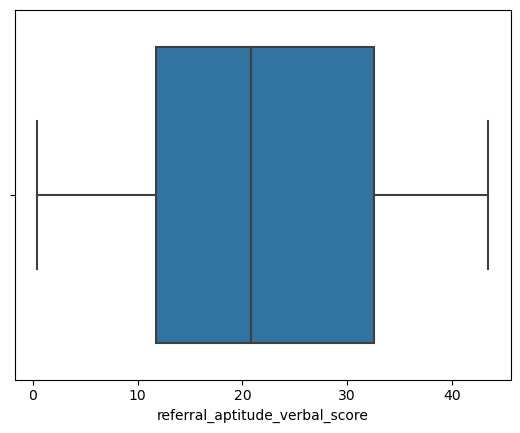

In [51]:
sns.boxplot(data= eda, x='referral_aptitude_verbal_score')

In [19]:
#lets use the mean value to impute the missing value in referral_aptitude_verbal_score
eda['referral_aptitude_verbal_score'].fillna(eda['referral_aptitude_verbal_score'].mean(),inplace=True)

In [59]:
eda.isnull().sum()

referral_id                            0
referral_age                           0
referral_exp_in_years                  0
referral_preferred_city                0
referral_current_salary                0
referral_10_th_marks                   1
referral_12th_marks                    0
referral_graduation_marks              1
referral_post_grad_marks               1
referral_gender                        0
referral_expected_sal                  2
referral_aptitude_numerical_score      4
referral_aptitude_verbal_score         0
referral_aptitude_reasoning_score      8
referral_Management_Interview_score    1
referral_HR_Interview_score            0
Salary offered                         0
Emp_Salary_Grade                       0
Joined                                 0
dtype: int64

In [20]:
eda_num=eda.select_dtypes(['int64','float64'])
eda_cat =eda.select_dtypes(['object'])

In [61]:
eda_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   referral_id                          499 non-null    int64  
 1   referral_age                         499 non-null    int64  
 2   referral_exp_in_years                499 non-null    float64
 3   referral_current_salary              499 non-null    int64  
 4   referral_10_th_marks                 498 non-null    float64
 5   referral_12th_marks                  499 non-null    int64  
 6   referral_graduation_marks            498 non-null    float64
 7   referral_post_grad_marks             498 non-null    float64
 8   referral_expected_sal                497 non-null    float64
 9   referral_aptitude_numerical_score    495 non-null    float64
 10  referral_aptitude_verbal_score       499 non-null    float64
 11  referral_aptitude_reasoning_scor

In [62]:
eda_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   referral_preferred_city  499 non-null    object
 1   referral_gender          499 non-null    object
 2   Emp_Salary_Grade         499 non-null    object
 3   Joined                   499 non-null    object
dtypes: object(4)
memory usage: 15.7+ KB


In [21]:
from sklearn.impute import SimpleImputer

In [22]:
imputer = SimpleImputer(missing_values=np.nan, strategy='median')

In [23]:
eda_num = pd.DataFrame(imputer.fit_transform(eda_num), columns=eda_num.columns)

In [67]:
eda_num.isnull().sum()

referral_id                            0
referral_age                           0
referral_exp_in_years                  0
referral_current_salary                0
referral_10_th_marks                   0
referral_12th_marks                    0
referral_graduation_marks              0
referral_post_grad_marks               0
referral_expected_sal                  0
referral_aptitude_numerical_score      0
referral_aptitude_verbal_score         0
referral_aptitude_reasoning_score      0
referral_Management_Interview_score    0
referral_HR_Interview_score            0
Salary offered                         0
dtype: int64

In [68]:
eda_num.describe().T

,count,mean,std,min,25%,50%,75%,max
referral_id,499.0,250.000000,144.193157,1.00,125.50,250.00,374.500,499.00
referral_age,499.0,27.020040,2.811979,20.00,25.00,27.00,29.000,65.00
referral_exp_in_years,499.0,4.053307,2.609814,1.00,2.00,4.00,6.000,42.00
referral_current_salary,499.0,86.472946,52.566584,25.00,45.00,85.00,126.000,853.00
referral_10_th_marks,499.0,77.460922,10.548795,60.00,68.00,78.00,87.000,103.00
referral_12th_marks,499.0,77.478958,10.932113,12.00,69.00,77.00,87.000,95.00
referral_graduation_marks,499.0,77.252698,10.217528,60.00,68.00,77.00,86.000,104.00
referral_post_grad_marks,499.0,78.268537,10.467968,60.00,69.00,78.00,88.500,101.00
referral_expected_sal,499.0,108.669339,58.605352,40.00,62.00,103.00,143.000,870.00
referral_aptitude_numerical_score,499.0,20.971363,12.507253,0.43,10.00,20.43,31.955,43.48


In [24]:
eda_new = pd.concat([eda_num,eda_cat],axis=1,join='inner')

In [70]:
eda_new.head()

,referral_id,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
0,1.0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,Delhi,Male,EL0,Yes
1,2.0,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,Pune,Male,ML0,Yes
2,3.0,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,Mumbai,Male,EL0,No
3,4.0,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,Bangalore,Male,ML0,Yes
4,5.0,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,Mumbai,Female,EL0,Yes


In [71]:
eda_new.shape

(499, 19)

In [25]:
eda =eda_new

In [1]:
# if we have a large dataset and there are few records with null values we can choose to drop these records
# using the below command
# df = df.dropna()

Checking for duplicates

In [26]:
dups= eda.duplicated()
print('numbers of duplicate rows = %d' % (dups.sum()))

numbers of duplicate rows = 0


In [27]:
# if we have duplicates we use drop duplicate command
eda.drop_duplicates(inplace=True)

In [75]:
eda.shape

(499, 19)

# Data Visualization

Univariate Analysis

In [77]:
eda.head()

,referral_id,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
0,1.0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,Delhi,Male,EL0,Yes
1,2.0,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,Pune,Male,ML0,Yes
2,3.0,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,Mumbai,Male,EL0,No
3,4.0,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,Bangalore,Male,ML0,Yes
4,5.0,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,Mumbai,Female,EL0,Yes


In [78]:
eda[['referral_exp_in_years','referral_current_salary']].describe()

,referral_exp_in_years,referral_current_salary
count,499.000000,499.000000
mean,4.053307,86.472946
std,2.609814,52.566584
min,1.000000,25.000000
25%,2.000000,45.000000
50%,4.000000,85.000000
75%,6.000000,126.000000
max,42.000000,853.000000


Insights:
referral_exp_in_years ranges from a minimum of 1 year to maximum of 42 years

75% of the referrals have less than or equal to 6 years experience

Mean salary of referrals is 86.44 which is higher than the median value indicating that the ditribution is right tailed

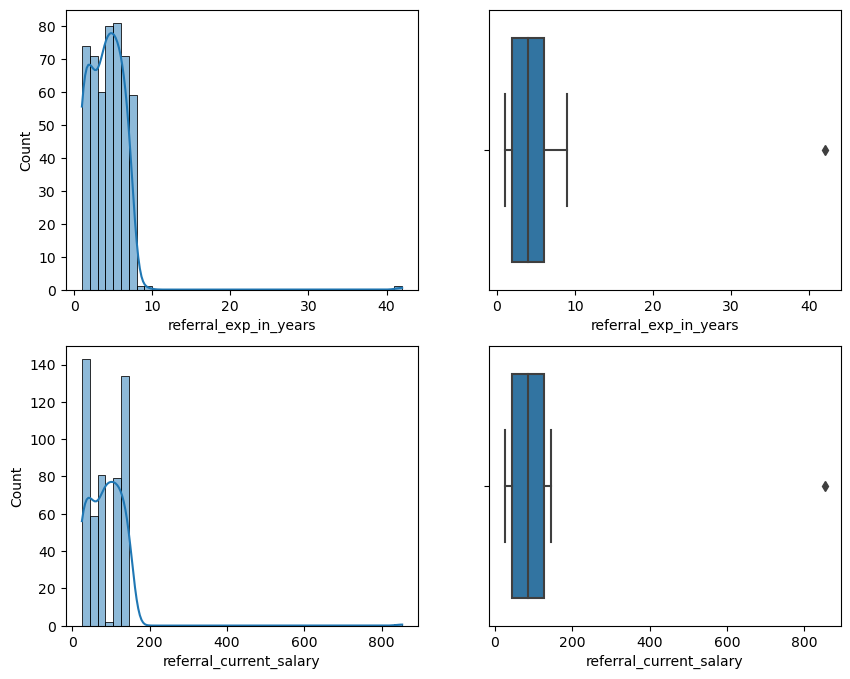

In [81]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_size_inches(10,8)
sns.histplot(eda['referral_exp_in_years'],kde=True, ax=axes[0][0])
sns.boxplot(x='referral_exp_in_years', data=eda, ax=axes[0][1])
sns.histplot(eda['referral_current_salary'],kde=True,ax=axes[1][0])
sns.boxplot(x='referral_current_salary',data=eda,ax=axes[1][1])
plt.show()

# Insights:
Both referral_exp_in_years and referral_current_salary have ouliers in upper values.

## Categorical Variable

In [87]:
round(eda['referral_preferred_city'].value_counts(normalize=True),2)

Mumbai       0.46
Bangalore    0.28
Delhi        0.19
Pune         0.06
Name: referral_preferred_city, dtype: float64

<AxesSubplot:xlabel='referral_preferred_city', ylabel='count'>

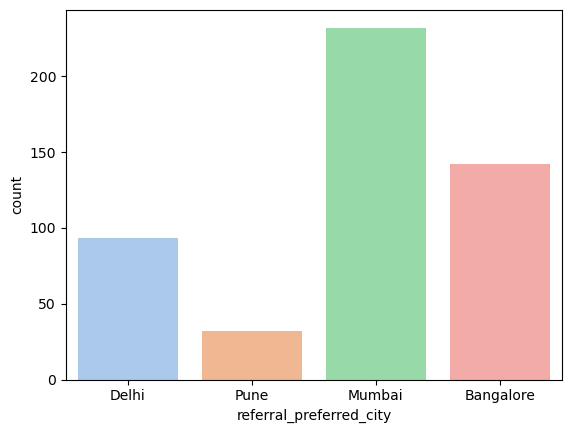

In [89]:
sns.countplot(data=eda, x='referral_preferred_city', palette='pastel')

Insights:
Maximum referrals i.e. around 46% referrals are coming from Mumbai

Only 6% referrals are from Pune

# Bivariate Analysis

<AxesSubplot:xlabel='referral_exp_in_years', ylabel='referral_current_salary'>

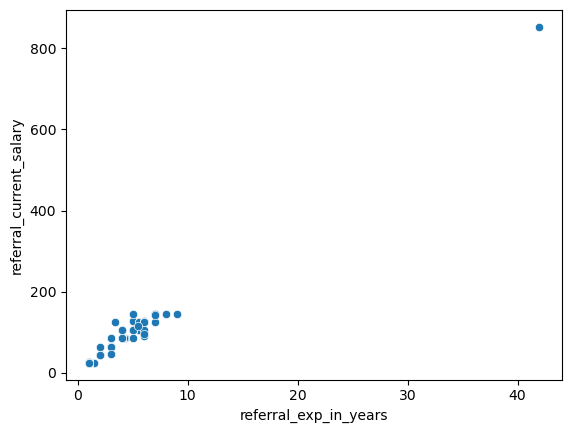

In [90]:
sns.scatterplot(data=eda,x='referral_exp_in_years',y='referral_current_salary')

Insights:
From the above plot we see that as the referral experience increases the salary is also increasing showing a positive relationship

In [91]:
eda[eda['referral_exp_in_years']>40]

,referral_id,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
354,355.0,65.0,42.0,853.0,61.0,95.0,78.0,68.0,870.0,2.17,33.48,29.13,7.0,3.0,868.0,Mumbai,Male,EL0,No


Categorical vs Categorical

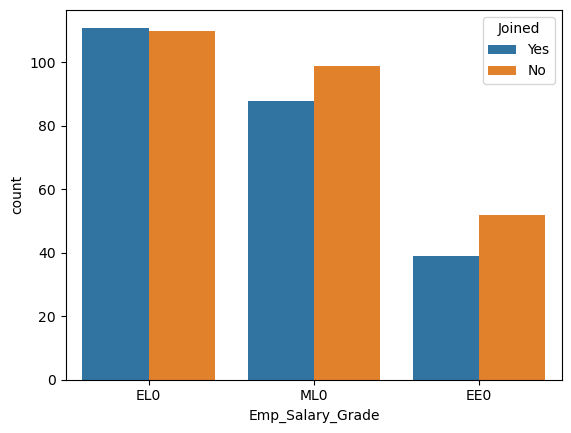

In [92]:
sns.countplot(data=eda,x='Emp_Salary_Grade',hue='Joined');

In [93]:
pd.crosstab(eda['Emp_Salary_Grade'],eda['Joined'],margins=True,normalize=True)

Joined,No,Yes,All
Emp_Salary_Grade,,,
EE0,0.104208,0.078156,0.182365
EL0,0.220441,0.222445,0.442886
ML0,0.198397,0.176353,0.374749
All,0.523046,0.476954,1.000000


Insights:
44.29% referrals are from the EL0 grade

There is no major difference in the referrals joining or not joining based on gardes

In [94]:
## Categorical vs Numeric

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Joined', ylabel='referral_expected_sal'>

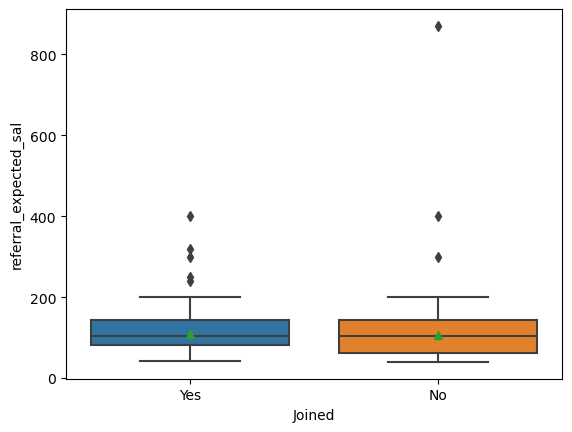

In [3]:
# Showmeans = True  shows mean value as well in boxplot as green star
fig_dims =(12,5)
sns.boxplot(data=eda,x='Joined',y='referral_expected_sal',showmeans = True)

Insights:
Median value of the expected salary for referrals who have joined is almost same as referrals who have not joined. However, there is a major difference in the range of expected salary for the 2 categories.

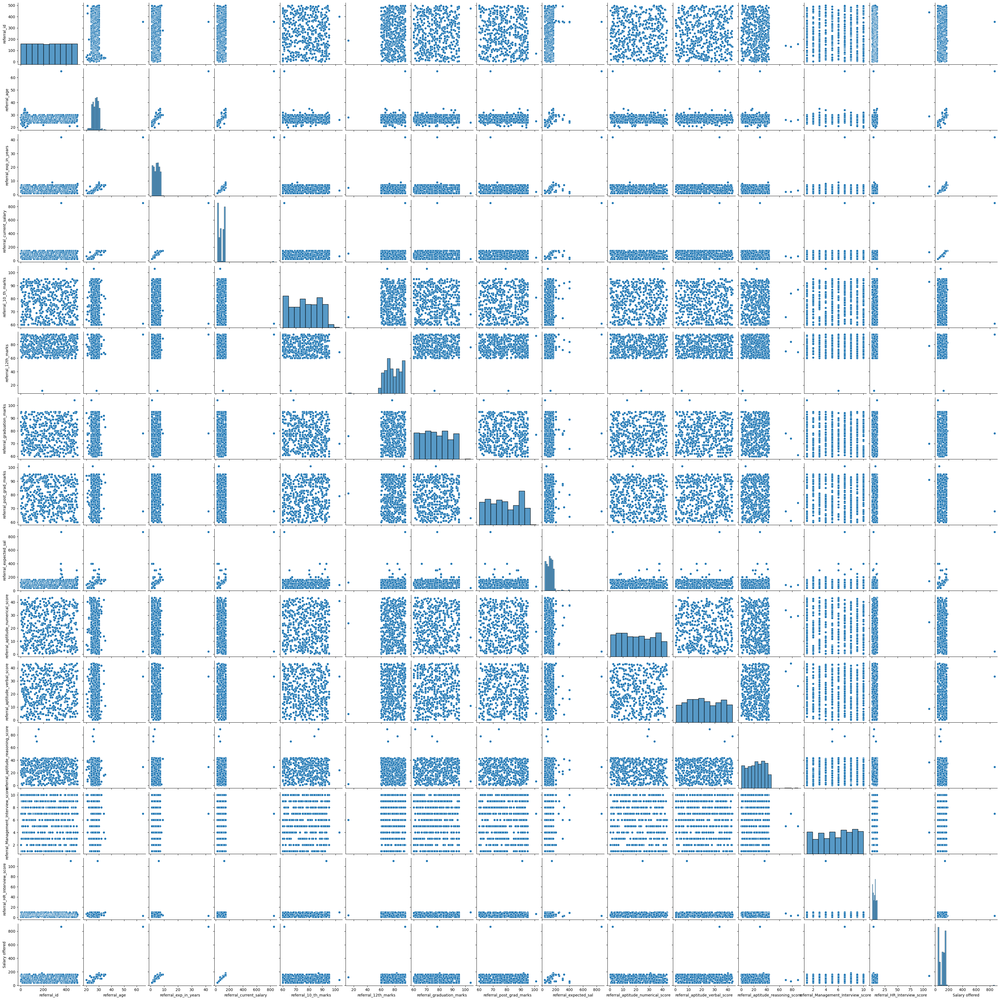

In [96]:
sns.pairplot(eda)

<AxesSubplot:>

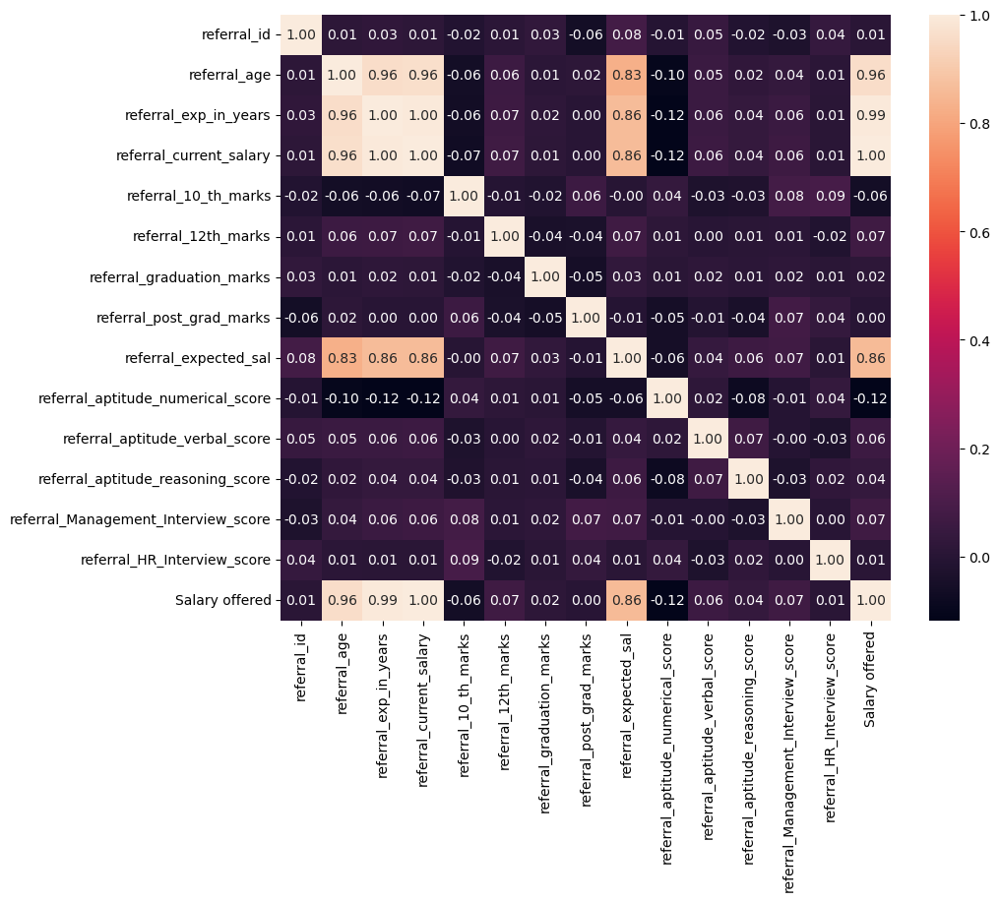

In [97]:
plt.figure(figsize=(10,8))
sns.heatmap(eda.corr(),annot=True,fmt="0.2f")

Insights
There is a strong correlation observed between few fields. 'Salary offered' is highly correlated to 'referral_age' and 'referral_exp_in_years'

Also, 'Salary offered' shows high correlation with 'referral_expected_sal'

# Multivariate Analysis

<AxesSubplot:xlabel='Joined', ylabel='referral_age'>

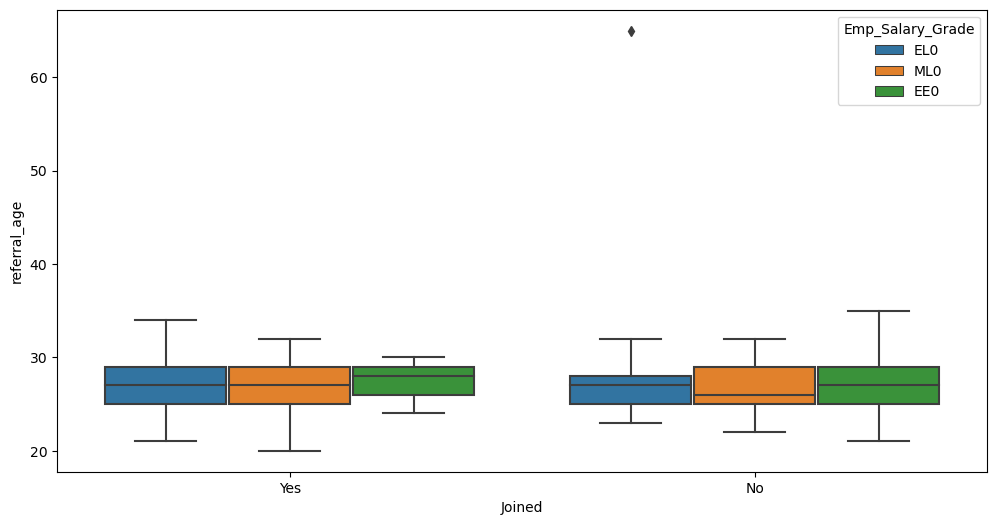

In [104]:
fig_dims = (12,6)
fig = plt.subplots(figsize =fig_dims)
sns.boxplot(data=eda, x='Joined',y='referral_age',hue='Emp_Salary_Grade')

FacetGrid

<bound method Grid.add_legend of <seaborn.axisgrid.FacetGrid object at 0x0000019946085850>>

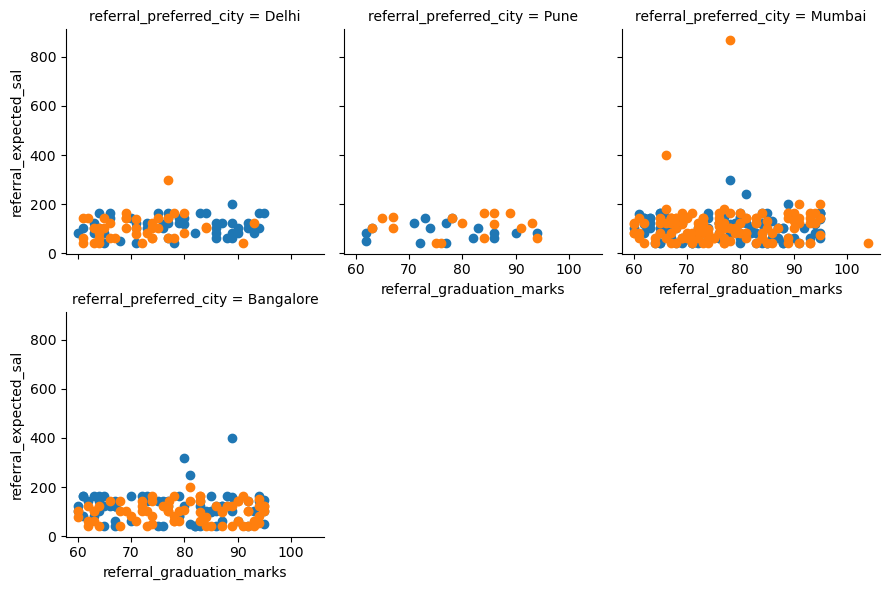

In [105]:
g = sns.FacetGrid(eda,col= 'referral_preferred_city',hue='Joined',col_wrap=3,height=3)
g = g.map(plt.scatter,"referral_graduation_marks","referral_expected_sal")
g.add_legend

# Data Preparation

Scaling

In [28]:
## Dropping the ID fearure before we scale numeric values as the same will not add any value in model building
eda.drop(labels='referral_id', axis=1,inplace=True)

In [107]:
eda.head()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,Delhi,Male,EL0,Yes
1,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,Pune,Male,ML0,Yes
2,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,Mumbai,Male,EL0,No
3,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,Bangalore,Male,ML0,Yes
4,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,Mumbai,Female,EL0,Yes


In [29]:
cat =[]
num =[]
for i in eda.columns:
    if eda[i].dtype=='object':
        cat.append(i)
    else:
        num.append(i)
print(cat)        
print(num)

['referral_preferred_city', 'referral_gender', 'Emp_Salary_Grade', 'Joined']
['referral_age', 'referral_exp_in_years', 'referral_current_salary', 'referral_10_th_marks', 'referral_12th_marks', 'referral_graduation_marks', 'referral_post_grad_marks', 'referral_expected_sal', 'referral_aptitude_numerical_score', 'referral_aptitude_verbal_score', 'referral_aptitude_reasoning_score', 'referral_Management_Interview_score', 'referral_HR_Interview_score', 'Salary offered']


In [30]:
# Method 1 
## using Zscore for scalaing/standardisation
from scipy.stats import zscore
data_scaled = eda[num].apply(zscore)

In [110]:
data_scaled.head()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered
0,0.348844,0.363108,0.371846,1.094974,-0.501683,0.954936,0.452448,0.244774,-0.878080,0.917867,-0.016947,1.462710,-0.482494,0.741797
1,-0.363112,-0.404000,-0.408900,-1.372236,-0.043856,1.640721,0.643699,-0.438443,-1.191013,0.454815,-0.212046,1.462710,0.791391,-0.418628
2,-1.431047,-0.787553,-0.789752,1.379652,0.688667,0.661028,-0.599431,-0.797132,1.662194,-1.576054,1.217930,-1.279957,-0.846461,-0.799095
3,0.704823,0.746661,0.752697,-1.656914,1.604322,1.738690,-1.077558,0.637623,0.826641,-1.041701,-0.016947,1.119877,-0.482494,0.760820
4,-0.363112,-0.404000,-0.408900,1.379652,-0.684814,0.269151,1.313077,-0.438443,0.374449,0.703962,-0.537210,0.434210,-0.300510,-0.247418


In [111]:
eda.describe()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered
count,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000
mean,27.020040,4.053307,86.472946,77.460922,77.478958,77.252698,78.268537,108.669339,20.971363,21.840491,23.706713,5.733467,5.651303,102.006012
std,2.811979,2.609814,52.566584,10.548795,10.932113,10.217528,10.467968,58.605352,12.507253,12.213917,13.391275,2.919795,5.500516,52.619704
min,20.000000,1.000000,25.000000,60.000000,12.000000,60.000000,60.000000,40.000000,0.430000,0.430000,0.230000,1.000000,1.000000,40.000000
25%,25.000000,2.000000,45.000000,68.000000,69.000000,68.000000,69.000000,62.000000,10.000000,11.740000,13.040000,3.000000,3.000000,60.000000
50%,27.000000,4.000000,85.000000,78.000000,77.000000,77.000000,78.000000,103.000000,20.430000,21.740000,23.480000,6.000000,5.000000,101.000000
75%,29.000000,6.000000,126.000000,87.000000,87.000000,86.000000,88.500000,143.000000,31.955000,32.610000,34.350000,8.000000,8.000000,141.000000
max,65.000000,42.000000,853.000000,103.000000,95.000000,104.000000,101.000000,870.000000,43.480000,43.480000,89.000000,10.000000,111.000000,868.000000


In [113]:
round(data_scaled.describe(),2)

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered
count,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00
mean,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.50,-1.17,-1.17,-1.66,-6.00,-1.69,-1.75,-1.17,-1.64,-1.75,-1.75,-1.62,-0.85,-1.18
25%,-0.72,-0.79,-0.79,-0.90,-0.78,-0.91,-0.89,-0.80,-0.88,-0.83,-0.80,-0.94,-0.48,-0.80
50%,-0.01,-0.02,-0.03,0.05,-0.04,-0.02,-0.03,-0.10,-0.04,-0.01,-0.02,0.09,-0.12,-0.02
75%,0.70,0.75,0.75,0.91,0.87,0.86,0.98,0.59,0.88,0.88,0.80,0.78,0.43,0.74
max,13.52,14.55,14.60,2.42,1.60,2.62,2.17,13.00,1.80,1.77,4.88,1.46,19.17,14.57


<AxesSubplot:xlabel='referral_current_salary', ylabel='Count'>

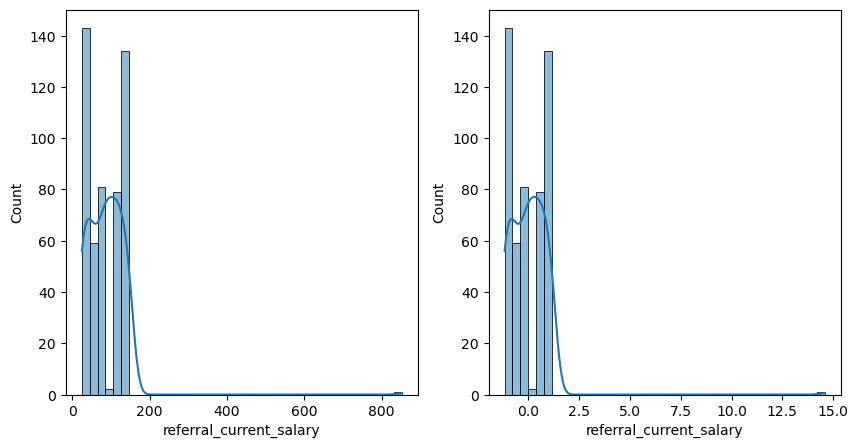

In [114]:
fig,axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(10,5)
sns.histplot(eda['referral_current_salary'], kde=True, ax=axes[0])
sns.histplot(data_scaled['referral_current_salary'], kde=True, ax=axes[1])

Method II

Using standardScaler for Standardisation

In [31]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(eda[num])
data_standard = scaler.transform(eda[num])
data_standard = pd.DataFrame(data_standard, columns=eda[num].columns)
round(data_standard.describe(),2)

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered
count,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00,499.00
mean,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.50,-1.17,-1.17,-1.66,-6.00,-1.69,-1.75,-1.17,-1.64,-1.75,-1.75,-1.62,-0.85,-1.18
25%,-0.72,-0.79,-0.79,-0.90,-0.78,-0.91,-0.89,-0.80,-0.88,-0.83,-0.80,-0.94,-0.48,-0.80
50%,-0.01,-0.02,-0.03,0.05,-0.04,-0.02,-0.03,-0.10,-0.04,-0.01,-0.02,0.09,-0.12,-0.02
75%,0.70,0.75,0.75,0.91,0.87,0.86,0.98,0.59,0.88,0.88,0.80,0.78,0.43,0.74
max,13.52,14.55,14.60,2.42,1.60,2.62,2.17,13.00,1.80,1.77,4.88,1.46,19.17,14.57


Method III Min-Max method

In [32]:
from sklearn.preprocessing import MinMaxScaler
#build the scaler model
scaler = MinMaxScaler().fit(eda[num])
# transform the test
data_minmax = scaler.transform(eda[num])
data_minmax = pd.DataFrame(data_minmax , columns=eda[num].columns)
data_minmax.describe()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered
count,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000
mean,0.156001,0.074471,0.074243,0.406068,0.788903,0.392107,0.445574,0.082734,0.477151,0.497340,0.264467,0.525941,0.042285,0.074886
std,0.062488,0.063654,0.063486,0.245321,0.131712,0.232217,0.255316,0.070609,0.290529,0.283715,0.150854,0.324422,0.050005,0.063550
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.111111,0.024390,0.024155,0.186047,0.686747,0.181818,0.219512,0.026506,0.222300,0.262718,0.144306,0.222222,0.018182,0.024155
50%,0.155556,0.073171,0.072464,0.418605,0.783133,0.386364,0.439024,0.075904,0.464576,0.495006,0.261913,0.555556,0.036364,0.073671
75%,0.200000,0.121951,0.121981,0.627907,0.903614,0.590909,0.695122,0.124096,0.732288,0.747503,0.384364,0.777778,0.063636,0.121981
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Transformation

In [117]:
eda.referral_current_salary.describe()

count    499.000000
mean      86.472946
std       52.566584
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      853.000000
Name: referral_current_salary, dtype: float64

<AxesSubplot:xlabel='referral_current_salary'>

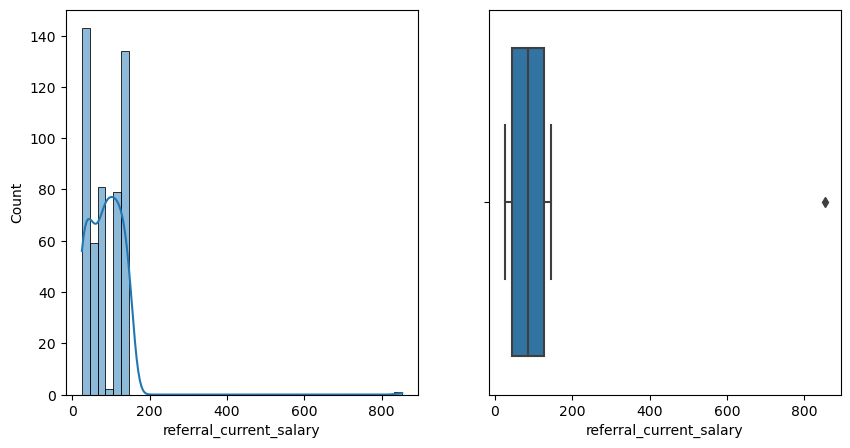

In [119]:
fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot(eda.referral_current_salary, kde=True, ax=axs[0]) 
sns.boxplot(x= 'referral_current_salary', data=eda, ax=axs[1]) 

In [121]:
print("Skeness of referral current salary is", eda['referral_current_salary'].skew())
print("kurtosis of referral current salary is ", eda['referral_current_salary'].kurtosis())

Skeness of referral current salary is 6.184346309755603
kurtosis of referral current salary is  89.46603642396403


Skewness assesses the extent to which a variable’s distribution is symmetrical

Kurtosis is a measure of whether the distribution is too peaked

For an ideal normal distribution (theoretical) Skewness and Kurtosis have to be between -1 to +1 Or we can say that if we are able to reduce the skewness and kurtosis from a very high value to lower values we are able to get the data distirbuted more normally

-0.5366972326623899
-0.25722521778402907


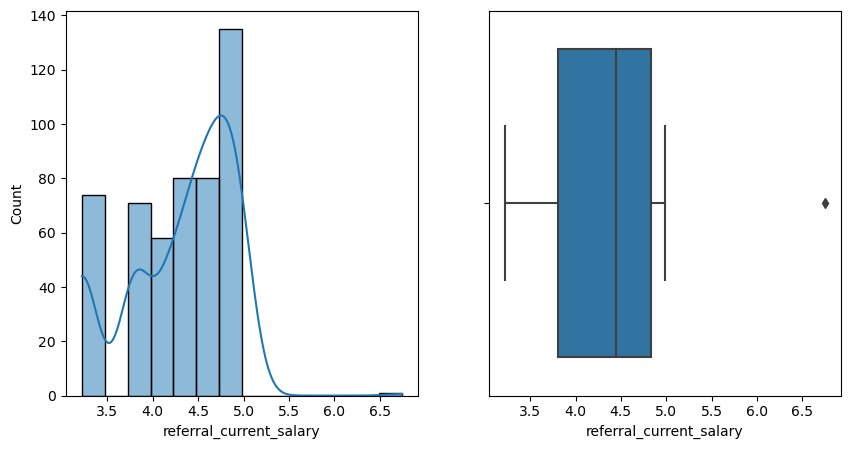

In [123]:
#using log Tranformation
print(np.log(eda['referral_current_salary']).skew())
print(np.log(eda['referral_current_salary']).kurtosis())

fig_dims = (10,5)
fig, axs = plt.subplots(nrows=1, ncols=2,figsize =fig_dims)
sns.histplot(np.log(eda['referral_current_salary']),kde=True, ax =axs[0])
sns.boxplot(x=np.log(eda['referral_current_salary']), ax = axs[1])
plt.show()

0.7524793474615112
7.32123129002615


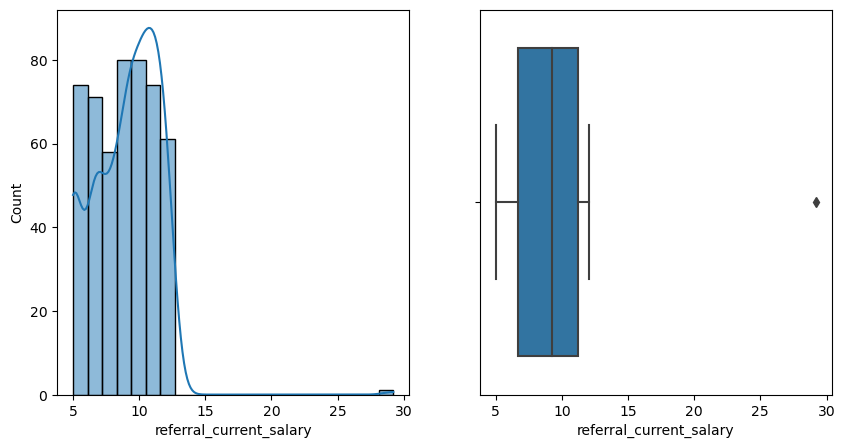

In [125]:
# using the the square root transformation
print(np.sqrt(eda['referral_current_salary']).skew())
print(np.sqrt(eda['referral_current_salary']).kurtosis())

fig_dims = (10,5)
fig, axs = plt.subplots(nrows=1, ncols=2,figsize =fig_dims)
sns.histplot(np.sqrt(eda['referral_current_salary']),kde=True, ax =axs[0])
sns.boxplot(x=np.sqrt(eda['referral_current_salary']), ax = axs[1])
plt.show()

-0.3950105143684113
0.04120887026425146


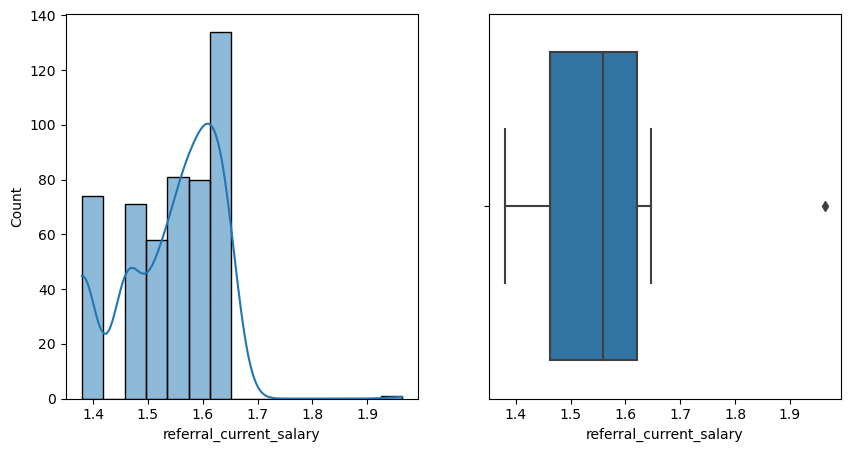

In [126]:
# Using root of 10 for transformation
print((eda['referral_current_salary']**0.1).skew())
print((eda['referral_current_salary']**0.1).kurtosis())

fig_dims = (10, 5) 
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=fig_dims) 
sns.histplot((eda['referral_current_salary']**0.1), kde=True, ax = axs[0])
sns.boxplot(x=(eda['referral_current_salary']**0.1), ax = axs[1])
plt.show()

# Outlier Treatment

In [128]:
### metheod I - Z score

In [33]:
# Take backup of 'referral_current_salary' field as 2 other fields to compare output from different methods
eda['referral_current_salary1'] = eda['referral_current_salary']
eda['referral_current_salary2'] = eda['referral_current_salary']

In [130]:
eda['referral_current_salary'].describe()

count    499.000000
mean      86.472946
std       52.566584
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      853.000000
Name: referral_current_salary, dtype: float64

<AxesSubplot:xlabel='referral_current_salary'>

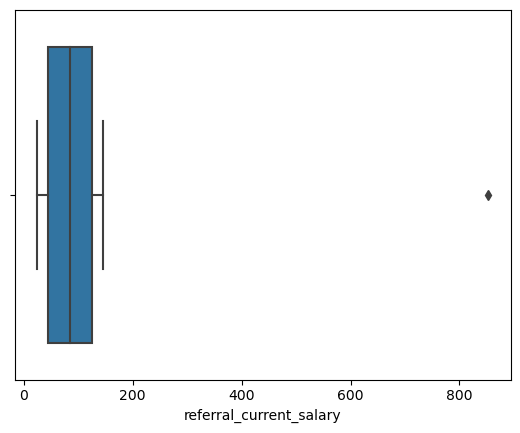

In [131]:
sns.boxplot(x=eda.referral_current_salary)

In [34]:
## Method I (Z Score)
eda['referral_current_salary_zscore'] = (eda.referral_current_salary - eda.referral_current_salary.mean())/eda.referral_current_salary.std()

In [35]:
eda['referral_current_salary_zscore'].describe()

count    4.990000e+02
mean     1.824415e-17
std      1.000000e+00
min     -1.169430e+00
25%     -7.889603e-01
50%     -2.802057e-02
75%      7.519426e-01
max      1.458202e+01
Name: referral_current_salary_zscore, dtype: float64

In [36]:
round(eda['referral_current_salary_zscore'].describe(),2)

count    499.00
mean       0.00
std        1.00
min       -1.17
25%       -0.79
50%       -0.03
75%        0.75
max       14.58
Name: referral_current_salary_zscore, dtype: float64

In [138]:
eda[eda['referral_current_salary_zscore']>3]

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,...,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined,referral_current_salary1,referral_current_salary2,referral_current_salary_zscore
354,65.0,42.0,853.0,61.0,95.0,78.0,68.0,870.0,2.17,33.48,...,7.0,3.0,868.0,Mumbai,Male,EL0,No,853.0,853.0,14.582021


In [139]:
eda[eda['referral_current_salary_zscore']< -3]

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,...,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined,referral_current_salary1,referral_current_salary2,referral_current_salary_zscore


In [37]:
# Let us calculate the value for referral_current_salary if ZScore has to be 3
referral_current_salary_impute_value = (3*eda['referral_current_salary'].std()) + eda['referral_current_salary'].mean()
round(referral_current_salary_impute_value,2)

244.17

In [38]:
list1 = eda[eda['referral_current_salary_zscore']>3].index
list1

Int64Index([354], dtype='int64')

In [39]:
eda['referral_current_salary'] = np.where(eda.index.isin(list1),round(referral_current_salary_impute_value,2),eda['referral_current_salary'])

<AxesSubplot:xlabel='referral_current_salary'>

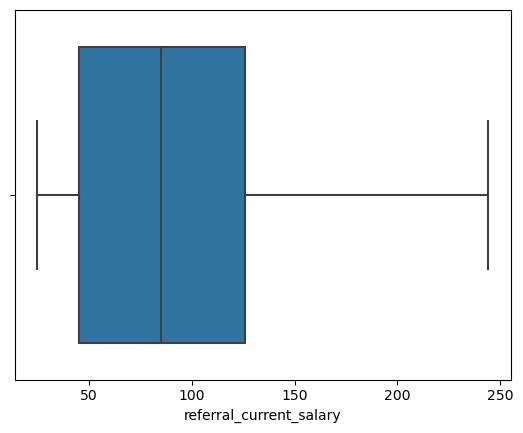

In [145]:
sns.boxplot(x= eda['referral_current_salary'])

In [146]:
eda.referral_current_salary.describe()

count    499.000000
mean      85.252846
std       40.396086
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      244.170000
Name: referral_current_salary, dtype: float64

In [40]:
eda.drop(['referral_current_salary_zscore'], axis=1, inplace=True)

In [148]:
##Boxplot Method

<AxesSubplot:xlabel='referral_current_salary1'>

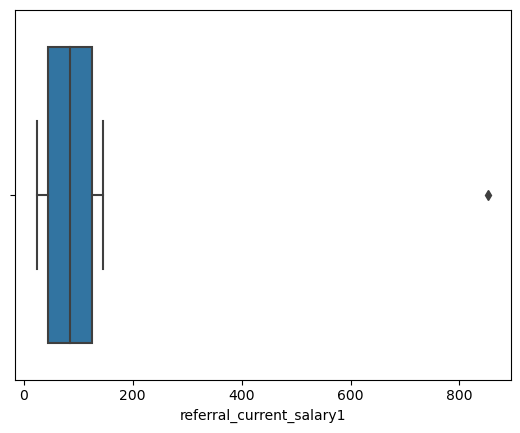

In [149]:
sns.boxplot(x = eda['referral_current_salary1'])

In [41]:
def detect_outlier(col):
    Q1,Q3 = np.percentile(col,[25,75])
    IQR = Q3-Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

In [42]:
# Check the lower and the upper range for the variable with z score
lr,ur = detect_outlier(eda['referral_current_salary1'])
print ("lower range" ,lr , "and upper range", ur)

lower range -76.5 and upper range 247.5


In [43]:
eda['referral_current_salary1'] = np.where (eda['referral_current_salary1']> ur , ur, eda['referral_current_salary1'])
eda['referral_current_salary1'] = np.where (eda['referral_current_salary1']< lr , lr, eda['referral_current_salary1'])

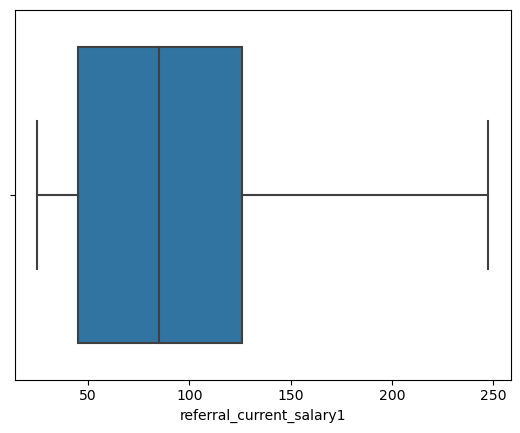

In [153]:
sns.boxplot(x=eda['referral_current_salary1']);

In [154]:
eda['referral_current_salary1'].describe()

count    499.000000
mean      85.259519
std       40.422658
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      247.500000
Name: referral_current_salary1, dtype: float64

In [155]:
eda['referral_current_salary2'].describe()

count    499.000000
mean      86.472946
std       52.566584
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      853.000000
Name: referral_current_salary2, dtype: float64

In [44]:
### Based on business knowledge, we can choose to impute a different value and not higher or lower whisker value 
## We can choose quantile as shown below
q99percent = eda.referral_current_salary2.quantile(q=0.99)
q99percent

146.0

In [45]:
eda[eda['referral_current_salary2']==853]

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined,referral_current_salary1,referral_current_salary2
354,65.0,42.0,244.17,61.0,95.0,78.0,68.0,870.0,2.17,33.48,29.13,7.0,3.0,868.0,Mumbai,Male,EL0,No,247.5,853.0


In [46]:
eda.drop(354, inplace=True)

In [47]:
eda['referral_current_salary2'].describe()

count    498.000000
mean      84.933735
std       39.802147
min       25.000000
25%       45.000000
50%       85.000000
75%      126.000000
max      146.000000
Name: referral_current_salary2, dtype: float64

In [160]:
eda.shape

(498, 20)

In [161]:
eda.tail()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined,referral_current_salary1,referral_current_salary2
494,21.0,1.0,25.0,81.0,77.0,77.0,91.0,42.0,19.13,16.09,6.52,9.0,8.0,40.0,Pune,Male,EL0,Yes,25.0,25.0
495,21.0,1.0,25.0,74.0,95.0,67.0,81.0,100.0,3.48,13.04,29.13,9.0,3.0,40.0,Mumbai,Female,EL0,Yes,25.0,25.0
496,29.0,7.0,146.0,94.0,92.0,89.0,71.0,200.0,38.70,5.22,39.57,9.0,5.0,161.0,Mumbai,Male,EL0,Yes,146.0,146.0
497,30.0,7.0,143.0,64.0,89.0,61.0,88.0,160.0,38.70,37.83,6.52,7.0,5.0,158.0,Mumbai,Female,EL0,Yes,143.0,143.0
498,30.0,8.0,144.0,67.0,72.0,81.0,60.0,200.0,33.48,20.43,1.74,4.0,6.0,159.0,Bangalore,Female,EE0,No,144.0,144.0


In [162]:
eda.reset_index(drop=True,inplace=True)

In [163]:
eda.tail()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined,referral_current_salary1,referral_current_salary2
493,21.0,1.0,25.0,81.0,77.0,77.0,91.0,42.0,19.13,16.09,6.52,9.0,8.0,40.0,Pune,Male,EL0,Yes,25.0,25.0
494,21.0,1.0,25.0,74.0,95.0,67.0,81.0,100.0,3.48,13.04,29.13,9.0,3.0,40.0,Mumbai,Female,EL0,Yes,25.0,25.0
495,29.0,7.0,146.0,94.0,92.0,89.0,71.0,200.0,38.70,5.22,39.57,9.0,5.0,161.0,Mumbai,Male,EL0,Yes,146.0,146.0
496,30.0,7.0,143.0,64.0,89.0,61.0,88.0,160.0,38.70,37.83,6.52,7.0,5.0,158.0,Mumbai,Female,EL0,Yes,143.0,143.0
497,30.0,8.0,144.0,67.0,72.0,81.0,60.0,200.0,33.48,20.43,1.74,4.0,6.0,159.0,Bangalore,Female,EE0,No,144.0,144.0


In [48]:
eda.drop(['referral_current_salary2','referral_current_salary1'], axis=1, inplace=True)

In [165]:
eda.shape

(498, 18)

# Label Encoding

In [49]:
eda[cat]

,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
0,Delhi,Male,EL0,Yes
1,Pune,Male,ML0,Yes
2,Mumbai,Male,EL0,No
3,Bangalore,Male,ML0,Yes
4,Mumbai,Female,EL0,Yes
...,...,...,...,...
494,Pune,Male,EL0,Yes
495,Mumbai,Female,EL0,Yes
496,Mumbai,Male,EL0,Yes
497,Mumbai,Female,EL0,Yes


In [50]:
# Convert a column to category then use that category values for your label enconding
eda['referral_preferred_city'] = eda['referral_preferred_city'].astype('category')
eda.dtypes

referral_age                            float64
referral_exp_in_years                   float64
referral_current_salary                 float64
referral_10_th_marks                    float64
referral_12th_marks                     float64
referral_graduation_marks               float64
referral_post_grad_marks                float64
referral_expected_sal                   float64
referral_aptitude_numerical_score       float64
referral_aptitude_verbal_score          float64
referral_aptitude_reasoning_score       float64
referral_Management_Interview_score     float64
referral_HR_Interview_score             float64
Salary offered                          float64
referral_preferred_city                category
referral_gender                          object
Emp_Salary_Grade                         object
Joined                                   object
dtype: object

In [168]:
eda.referral_preferred_city.value_counts()

Mumbai       231
Bangalore    142
Delhi         93
Pune          32
Name: referral_preferred_city, dtype: int64

In [51]:
# .cat.code is the command used for label encoding
eda['referral_preferred_city']= eda['referral_preferred_city'].cat.codes

In [52]:
eda.head()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,referral_gender,Emp_Salary_Grade,Joined
0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,1,Male,EL0,Yes
1,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,3,Male,ML0,Yes
2,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,2,Male,EL0,No
3,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,0,Male,ML0,Yes
4,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,2,Female,EL0,Yes


In [53]:
eda['referral_preferred_city'].value_counts()

2    231
0    142
1     93
3     32
Name: referral_preferred_city, dtype: int64

# One Hot Encoding

In [54]:
cat.remove('Joined')
cat.remove('referral_preferred_city')

In [55]:
cat

['referral_gender', 'Emp_Salary_Grade']

In [56]:
eda_new = pd.get_dummies(eda, columns=cat, drop_first=True)

In [180]:
eda_new.head(10)

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,Joined,referral_gender_Male,Emp_Salary_Grade_EL0,Emp_Salary_Grade_ML0
0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,1,Yes,1,1,0
1,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,3,Yes,1,0,1
2,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,2,No,1,1,0
3,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,0,Yes,1,0,1
4,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,2,Yes,0,1,0
5,29.0,6.0,126.0,87.0,89.0,81.0,77.0,143.0,38.70,9.13,32.61,1.0,8.0,141.0,0,No,0,1,0
6,30.0,7.0,146.0,66.0,62.0,64.0,86.0,163.0,30.43,10.00,18.26,9.0,10.0,161.0,0,Yes,0,1,0
7,29.0,6.0,127.0,78.0,61.0,83.0,70.0,144.0,5.65,8.26,2.50,3.0,10.0,142.0,2,No,0,1,0
8,24.0,3.0,66.0,79.0,77.0,83.0,66.0,84.0,18.70,22.17,36.52,9.0,3.0,123.0,2,Yes,0,0,1
9,29.0,5.0,127.0,88.0,95.0,77.0,92.0,144.0,23.04,38.26,3.04,10.0,4.0,142.0,0,Yes,0,0,1


In [181]:
eda_new['Joined'].value_counts()

No     260
Yes    238
Name: Joined, dtype: int64

In [182]:
eda_new['Joined'] = np.where(eda_new['Joined']=='Yes',1,0)

In [183]:
eda_new['Joined'].value_counts()

0    260
1    238
Name: Joined, dtype: int64

In [184]:
eda_new.head()

,referral_age,referral_exp_in_years,referral_current_salary,referral_10_th_marks,referral_12th_marks,referral_graduation_marks,referral_post_grad_marks,referral_expected_sal,referral_aptitude_numerical_score,referral_aptitude_verbal_score,referral_aptitude_reasoning_score,referral_Management_Interview_score,referral_HR_Interview_score,Salary offered,referral_preferred_city,Joined,referral_gender_Male,Emp_Salary_Grade_EL0,Emp_Salary_Grade_ML0
0,28.0,5.0,106.0,89.0,72.0,87.0,83.0,123.0,10.00,33.04,23.48,10.0,3.0,141.0,1,1,1,1,0
1,26.0,3.0,65.0,63.0,77.0,94.0,85.0,83.0,6.09,27.39,20.87,10.0,10.0,80.0,3,1,1,0,1
2,23.0,2.0,45.0,92.0,85.0,84.0,72.0,62.0,41.74,2.61,40.00,2.0,1.0,60.0,2,0,1,1,0
3,29.0,6.0,126.0,60.0,95.0,95.0,67.0,146.0,31.30,9.13,23.48,9.0,3.0,142.0,0,1,1,0,1
4,26.0,3.0,65.0,92.0,70.0,80.0,92.0,83.0,25.65,30.43,16.52,7.0,4.0,89.0,2,1,0,1,0


In [185]:
eda.shape

(498, 18)

In [4]:
dv = pd.read_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\Automobile.csv')
dv.head()

,symboling,normalized_losses,make,fuel_type,aspiration,number_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
0,3,168,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,168,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,168,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [6]:
dv.describe(include='all') #include all tells the Python to show all the columns and not just the numerical columns

,symboling,normalized_losses,make,fuel_type,aspiration,number_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
count,201.000000,201.000000,201,201,201,201,201,201,201,201.000000,...,201.000000,201,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000
unique,NaN,NaN,22,2,2,2,5,3,2,NaN,...,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,toyota,gas,std,four,sedan,fwd,front,NaN,...,NaN,mpfi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,32,181,165,114,94,118,198,NaN,...,NaN,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.840796,125.189055,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.797015,...,126.875622,NaN,3.329701,3.261741,10.164279,103.263682,5121.393035,25.179104,30.686567,13207.129353
std,1.254802,33.572966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.066366,...,41.546834,NaN,0.268166,0.317875,4.004965,37.389372,479.624905,6.423220,6.815150,7947.066342
min,-2.000000,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.600000,...,61.000000,NaN,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,0.000000,101.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.500000,...,98.000000,NaN,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7775.000000
50%,1.000000,122.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.000000,...,120.000000,NaN,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,150.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.400000,...,141.000000,NaN,3.580000,3.460000,9.400000,116.000000,5500.000000,30.000000,34.000000,16500.000000


In [8]:
dv.describe(include='all').T # Transpose the describe column

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
symboling,201.0,NaN,NaN,NaN,0.840796,1.254802,-2.0,0.0,1.0,2.0,3.0
normalized_losses,201.0,NaN,NaN,NaN,125.189055,33.572966,65.0,101.0,122.0,150.0,256.0
make,201,22,toyota,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fuel_type,201,2,gas,181,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aspiration,201,2,std,165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_of_doors,201,2,four,114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
body_style,201,5,sedan,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN
drive_wheels,201,3,fwd,118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
engine_location,201,2,front,198,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wheel_base,201.0,NaN,NaN,NaN,98.797015,6.066366,86.6,94.5,97.0,102.4,120.9


# Histogram

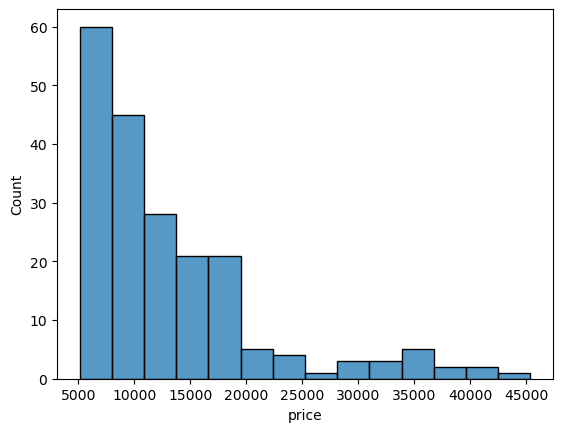

In [10]:
sns.histplot(data =dv , x = 'price');

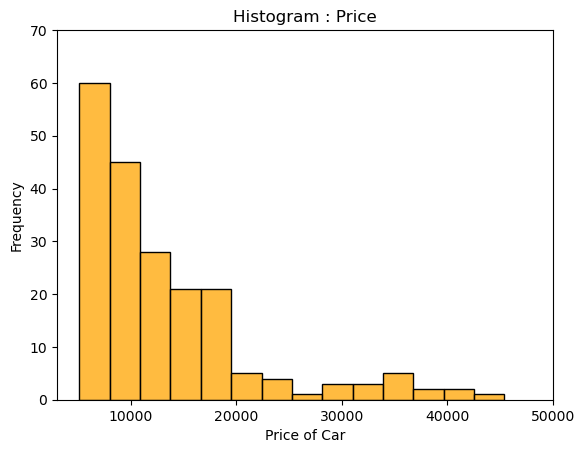

In [13]:
#Customise the Histogram
plt.title('Histogram : Price')
plt.xlim(3000,50000)
plt.ylim(0,70)
plt.xlabel('Price of Car')
plt.ylabel('Frequency')
sns.histplot(data= dv, x='price',color='orange');

<AxesSubplot:xlabel='price', ylabel='Count'>

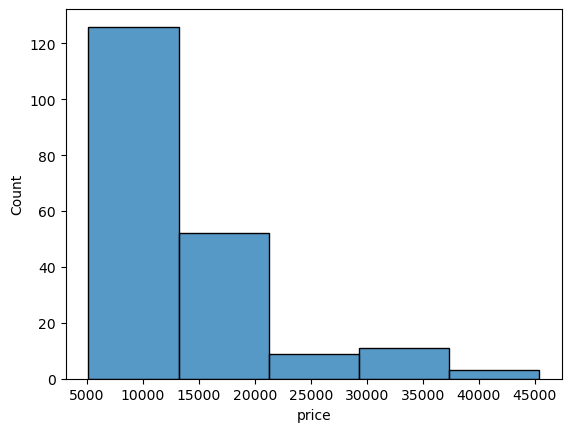

In [16]:
# to Reduce the number of bin in Histogram to 5
sns.histplot(data =dv, x= 'price', bins =5)

<AxesSubplot:xlabel='price', ylabel='Count'>

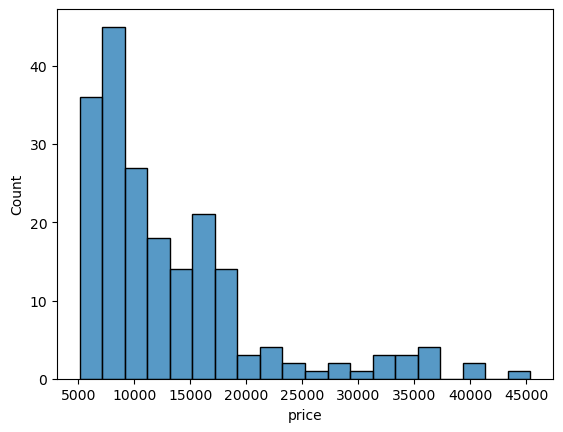

In [17]:
# To increase the number of bins to 20
sns.histplot(data=dv , x='price',bins=20)

<AxesSubplot:xlabel='price', ylabel='Count'>

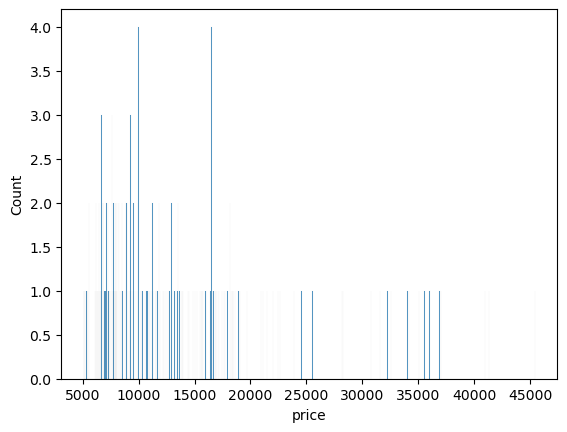

In [18]:
# to have bars with very narrow width
sns.histplot(data = dv , x = 'price', binwidth=20)

<AxesSubplot:xlabel='price', ylabel='Count'>

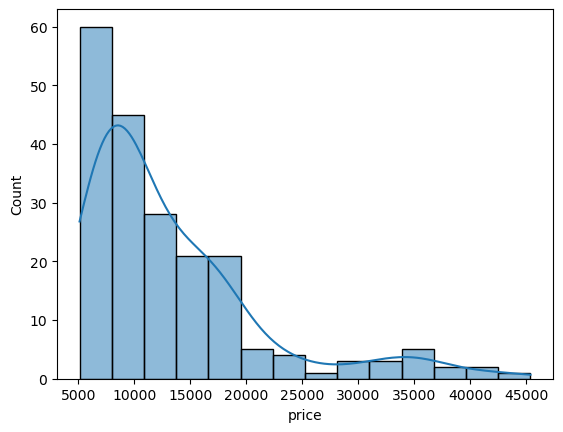

In [19]:
# kde or kernel Density estimation visialises the data continues level
sns.histplot(data = dv , x = 'price', kde=True)

<AxesSubplot:xlabel='price', ylabel='Count'>

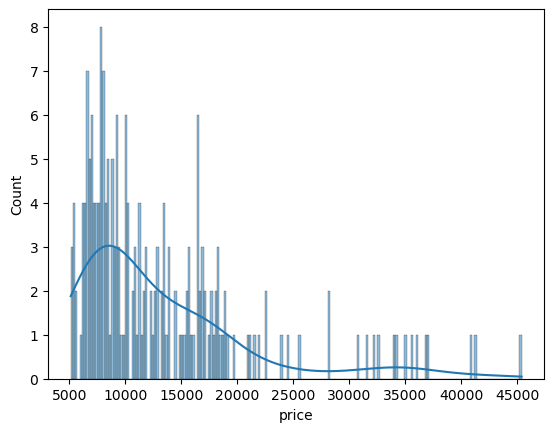

In [21]:
sns.histplot(data = dv, x = 'price', bins=200, kde=True)

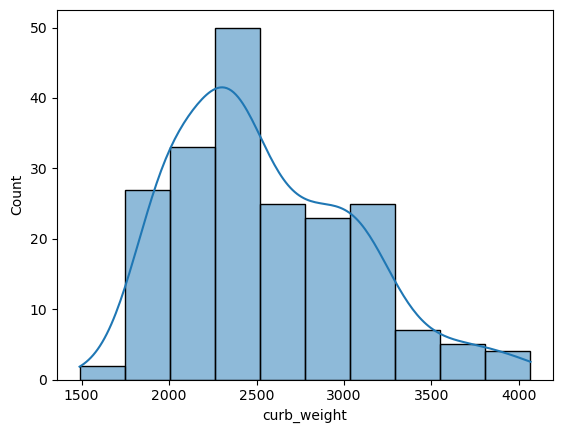

In [23]:
sns.histplot(data = dv, x = 'curb_weight', kde=True);

<AxesSubplot:xlabel='horsepower', ylabel='Count'>

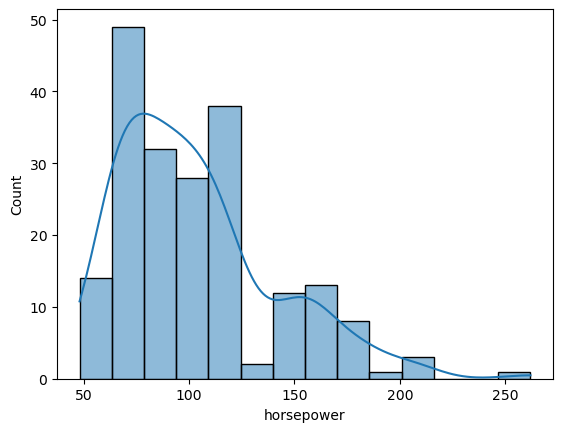

In [25]:
sns.histplot(data=dv, x= 'horsepower', kde=True)

<AxesSubplot:xlabel='price', ylabel='Count'>

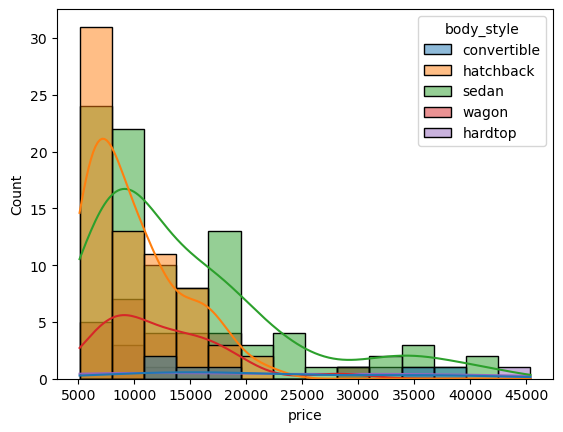

In [27]:
# hue is a way to add another column data within your existing graph
sns.histplot(data=dv , x = 'price', hue='body_style',kde=True)

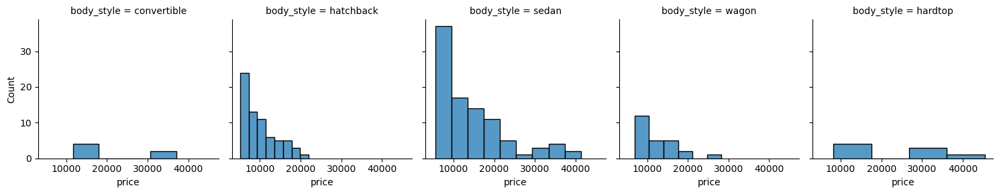

In [29]:
#subplots to make multiples graphs
g = sns.FacetGrid(dv,col='body_style')
g.map(sns.histplot,"price");

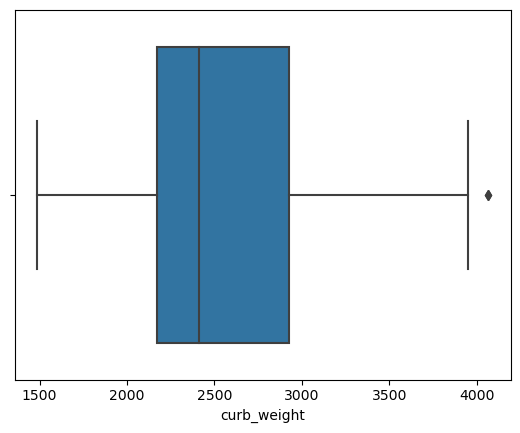

In [32]:
sns.boxplot(data = dv, x='curb_weight');

lets see how to customise a box plot

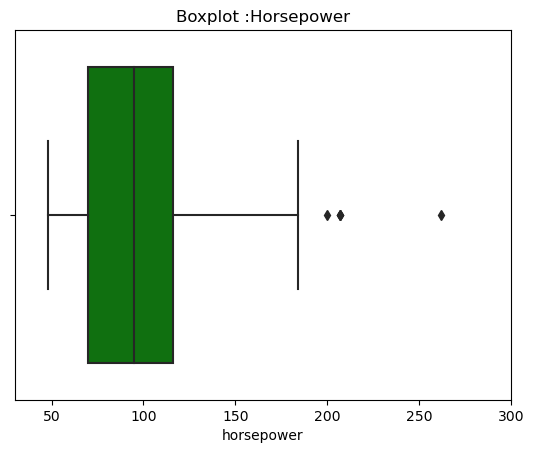

In [34]:
plt.title('Boxplot :Horsepower')
plt.xlabel('Horsepower')
plt.xlim(30,300)
sns.axes_style('whitegrid')
sns.boxplot(data=dv,x = 'horsepower',color='green');

## Comparing groups with boxplots

<AxesSubplot:xlabel='body_style', ylabel='price'>

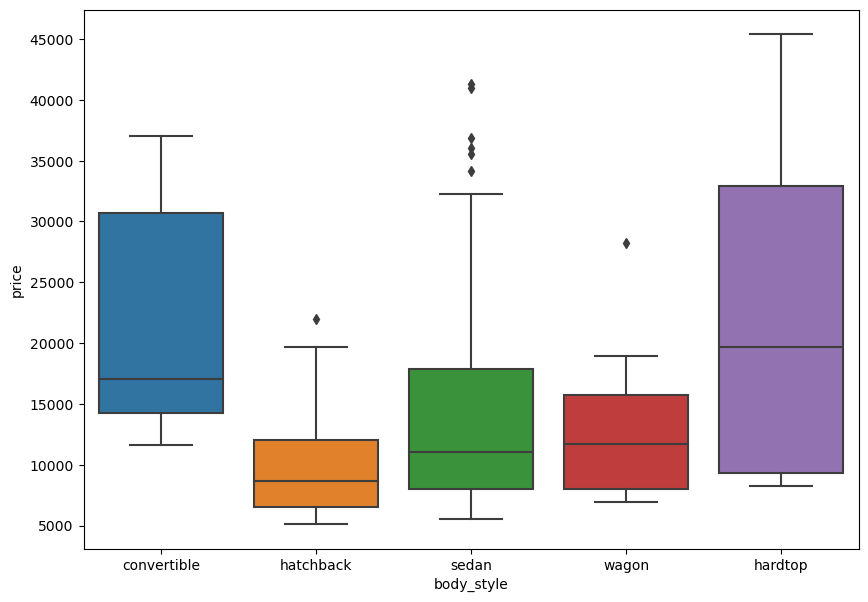

In [36]:
plt.figure(figsize=(10,7))
sns.boxplot(data = dv, x = 'body_style',y = 'price')

## A bar graph is generally used to find the no of observation in each bin
We can use a countplot() function in seaborn to plot a bar graph

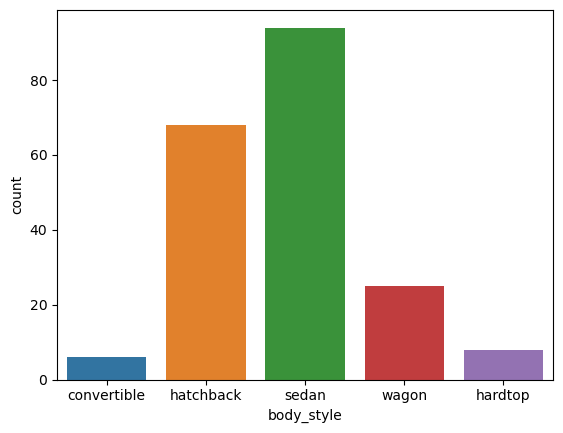

In [38]:
sns.countplot(data=dv, x = 'body_style');

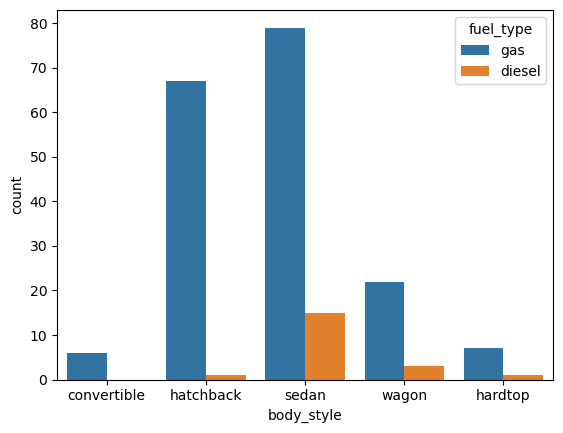

In [40]:
sns.countplot(data=dv, x = 'body_style',hue='fuel_type');

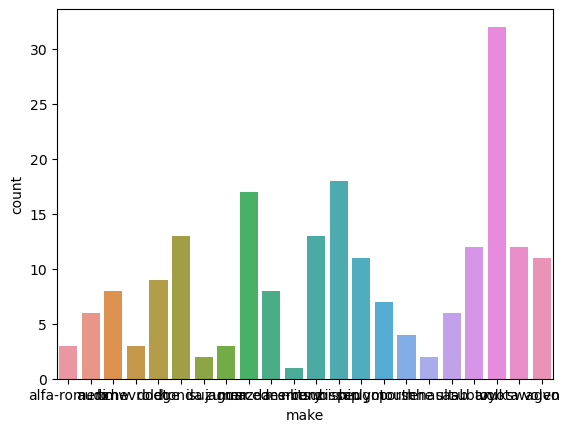

In [42]:
#let make bar graph from few more attributes
sns.countplot(data = dv, x = 'make');

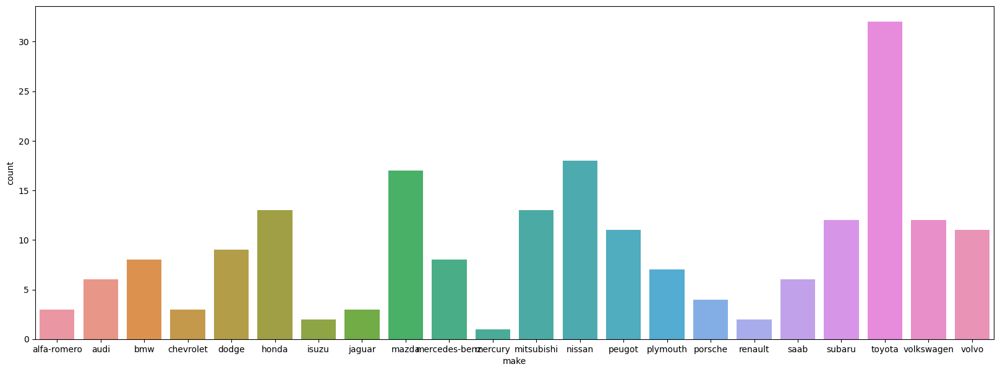

In [44]:
#the above mentioned graph looks messy and congested
# lets inccrease the size of the plot to make it look bigger
plt.figure(figsize=(20,7))
sns.countplot(data = dv, x = 'make');

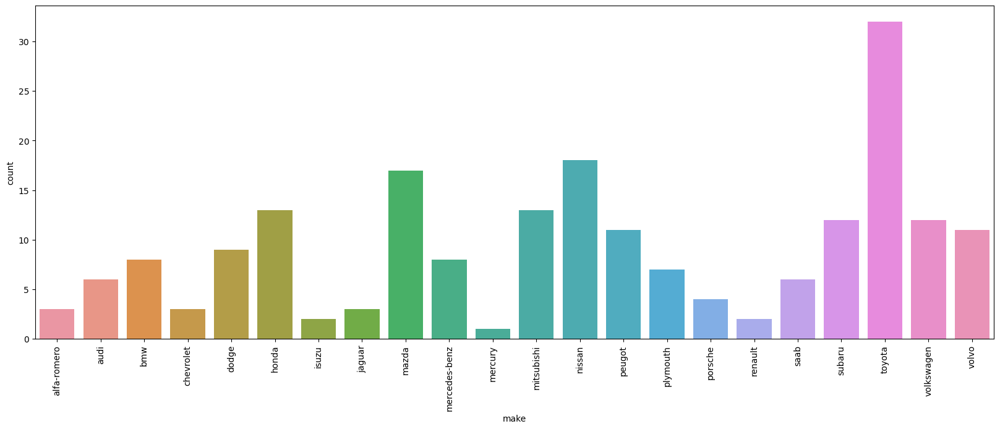

In [46]:
#rotate the naming convention of x axis
plt.figure(figsize=(20,7))
sns.countplot(data =dv, x= 'make')
plt.xticks(rotation =90);

Text(0.5, 0, 'Engine-Type')

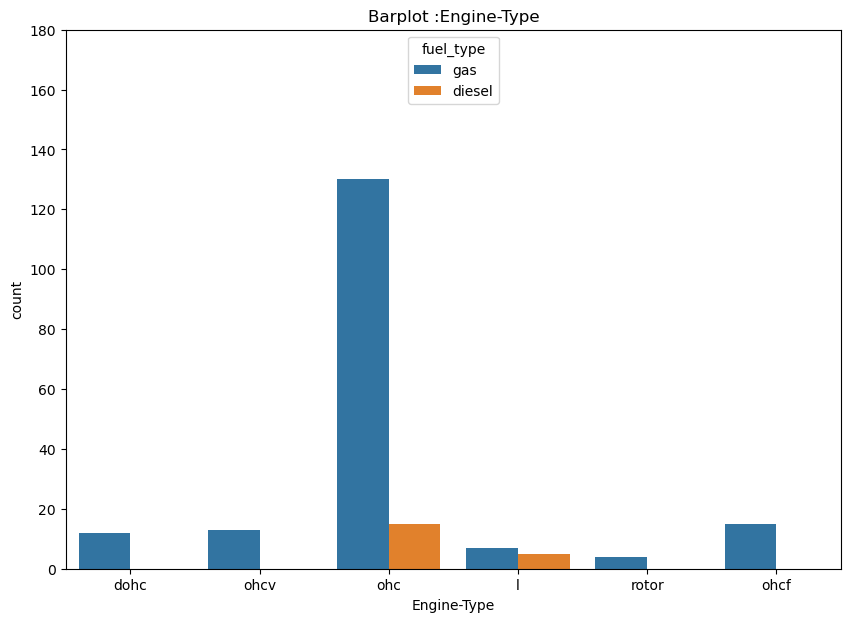

In [48]:
#Commonways to custumise a barplot

plt.figure(figsize=(10,7))
plt.title('Barplot :Engine-Type')
plt.ylim(0,180)
sns.countplot(data=dv , x = 'engine_type',hue='fuel_type');
plt.xlabel('Engine-Type')

## Line Charts

In [49]:
# loading a sample data set already available in seaborn
flights = sns.load_dataset("flights")

In [50]:
flights.head()

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


<AxesSubplot:xlabel='month', ylabel='passengers'>

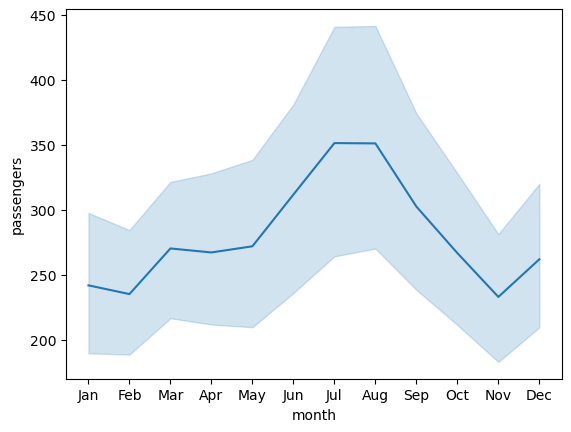

In [51]:
#creating a line plot
sns.lineplot(data = flights, x = 'month',y ='passengers')

<AxesSubplot:xlabel='month', ylabel='passengers'>

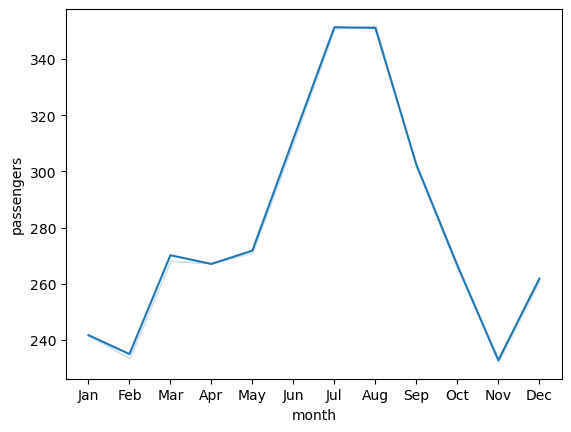

In [52]:
# we can switch off the confidence interval by setting ci parameter to False
sns.lineplot(data = flights,x='month',y='passengers',ci=False)

<AxesSubplot:xlabel='month', ylabel='passengers'>

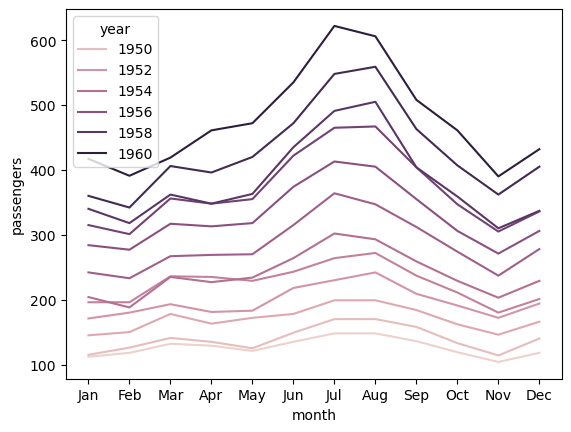

In [53]:
# We can check the relationship between 2 variables for different category by specifying the hue parameter
sns.lineplot(data=flights,x='month',y='passengers',ci=False, hue='year')

# we can change the style of line graph by adding 'style' parameter to function

In [54]:
fmri = sns.load_dataset('fmri')
fmri

,subject,timepoint,event,region,signal
0,s13,18,stim,parietal,-0.017552
1,s5,14,stim,parietal,-0.080883
2,s12,18,stim,parietal,-0.081033
3,s11,18,stim,parietal,-0.046134
4,s10,18,stim,parietal,-0.037970
...,...,...,...,...,...
1059,s0,8,cue,frontal,0.018165
1060,s13,7,cue,frontal,-0.029130
1061,s12,7,cue,frontal,-0.004939
1062,s11,7,cue,frontal,-0.025367


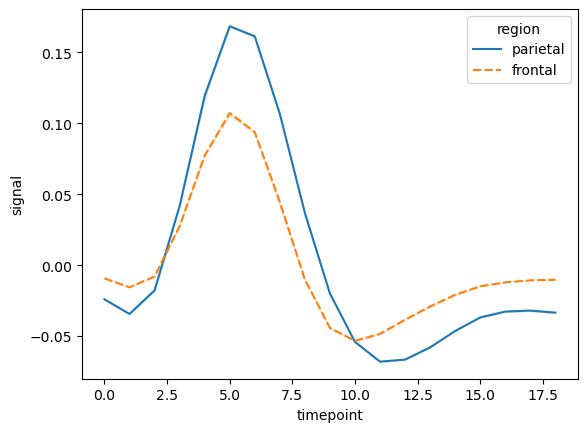

In [56]:
sns.lineplot(data=fmri,x='timepoint',y='signal',hue='region',style='region',ci=False);

<AxesSubplot:xlabel='timepoint', ylabel='signal'>

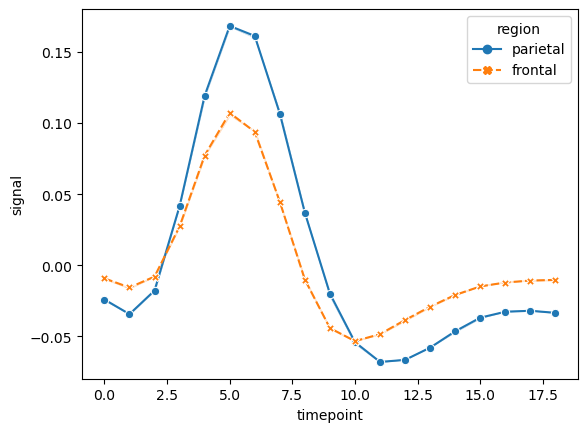

In [57]:
# we can also add markers at each observation to identify groups in better way
sns.lineplot(data=fmri,x='timepoint',y='signal',hue='region',style='region',ci=False,markers=True)

<AxesSubplot:xlabel='engine_size', ylabel='horsepower'>

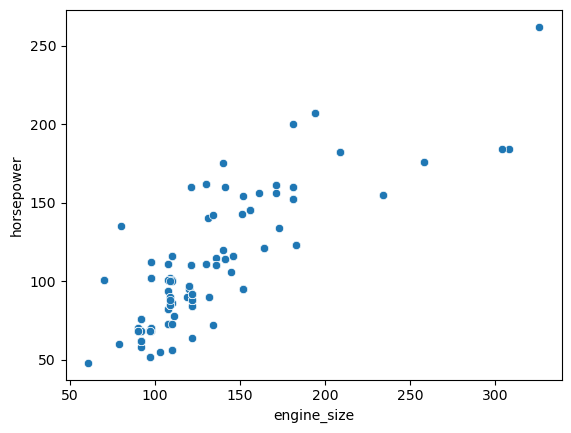

In [59]:
sns.scatterplot(data=dv, x='engine_size',y='horsepower')

<AxesSubplot:xlabel='engine_size', ylabel='horsepower'>

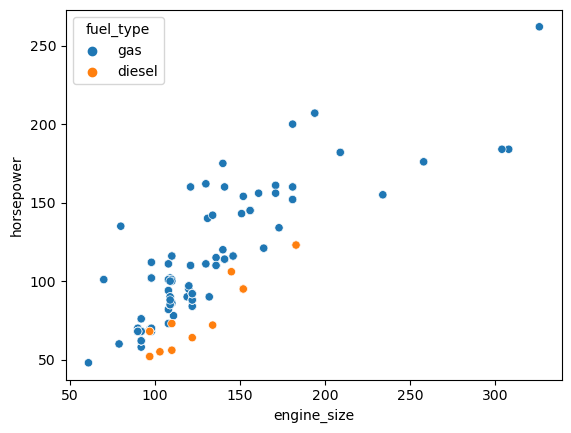

In [62]:
# We can also check the relationship between 2 variable for different category by specifying the hue parameter
sns.scatterplot(data=dv, x= 'engine_size',y='horsepower',hue='fuel_type' )

<AxesSubplot:xlabel='engine_size', ylabel='horsepower'>

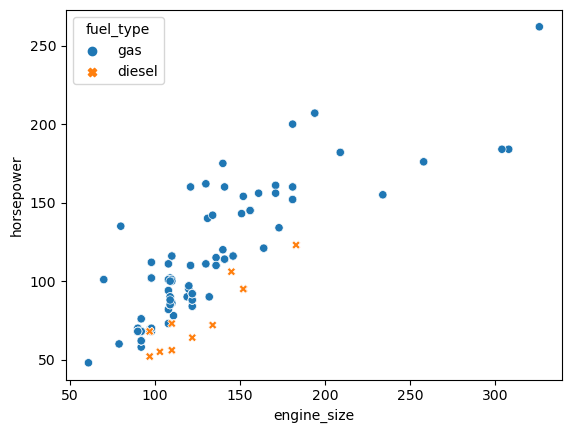

In [64]:
sns.scatterplot(data=dv, x= 'engine_size',y='horsepower',hue='fuel_type',style='fuel_type')

<AxesSubplot:xlabel='curb_weight', ylabel='engine_size'>

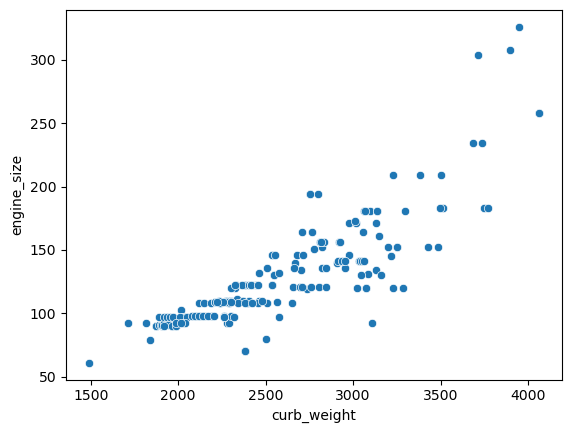

In [66]:
sns.scatterplot(data=dv, x='curb_weight', y = 'engine_size')

<AxesSubplot:xlabel='bore', ylabel='stroke'>

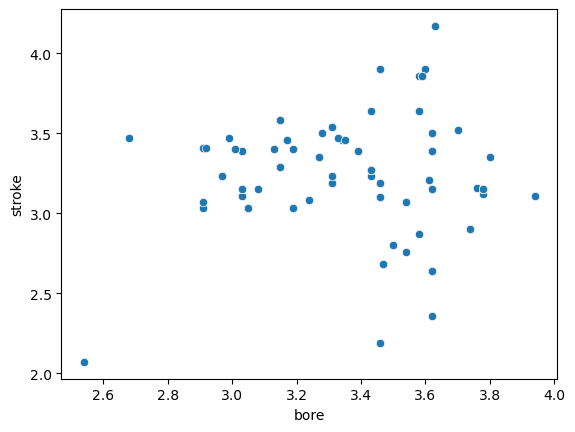

In [67]:
sns.scatterplot(data=dv, x='bore', y='stroke')

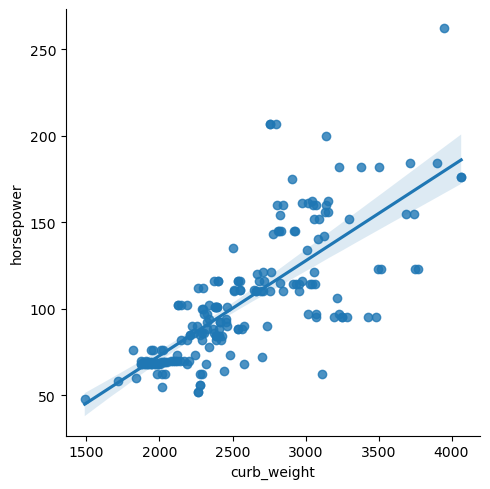

In [69]:
# lmplot gives scatterplot along with confidence interval
sns.lmplot(data =dv, x='curb_weight',y ='horsepower');

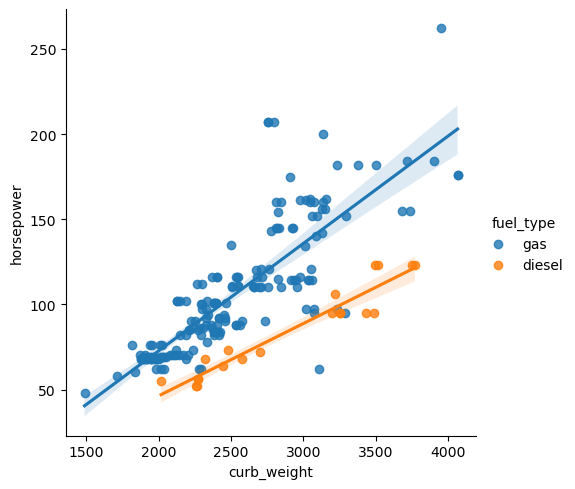

In [71]:
sns.lmplot(data=dv, x='curb_weight',y ='horsepower',hue='fuel_type' )

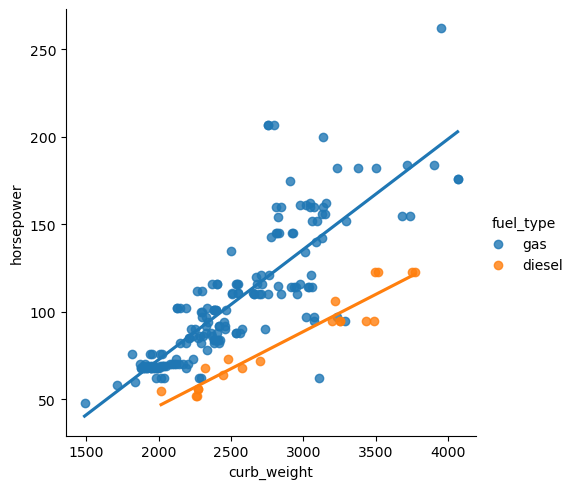

In [73]:
sns.lmplot(data=dv, x='curb_weight',y ='horsepower',hue='fuel_type' ,ci=False)

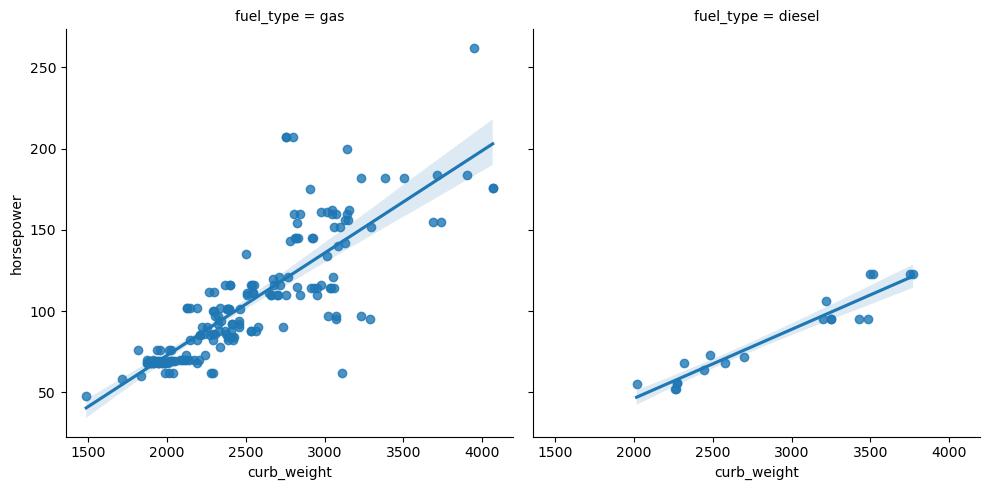

In [74]:
sns.lmplot(data=dv, x='curb_weight',y ='horsepower',col='fuel_type')

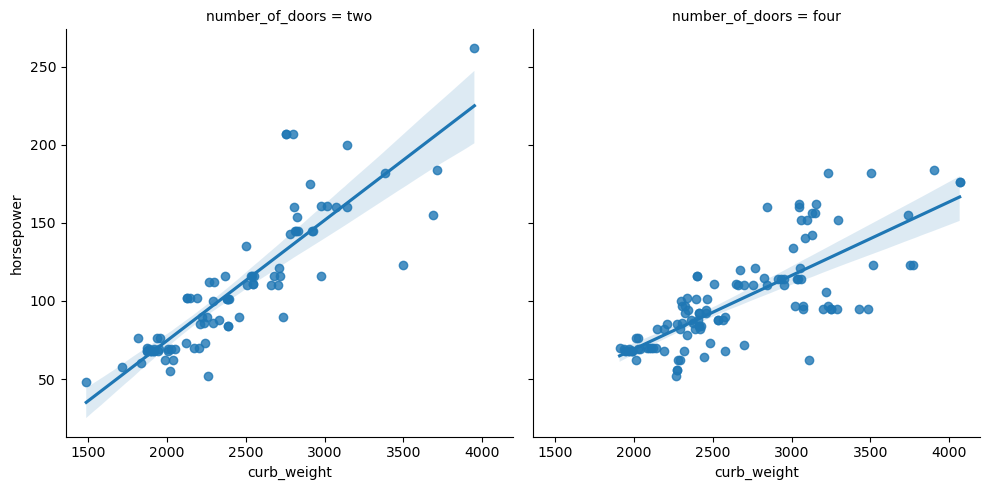

In [76]:
sns.lmplot(data=dv,  x='curb_weight',y ='horsepower',col='number_of_doors')

# Joint Plot

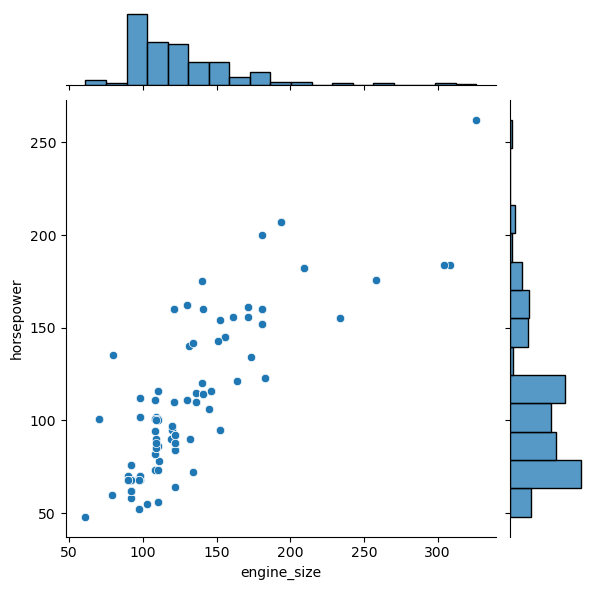

In [78]:
sns.jointplot(data=dv, x='engine_size', y='horsepower');

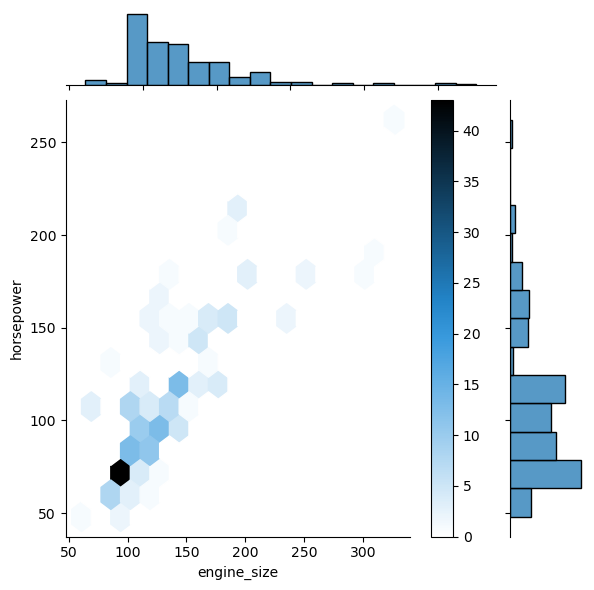

In [80]:
# we can create a hexbin plot by setting kind ='hex'
# it actually splits the window into sevral hexagons and the color of each hexagon denotes the number of datapoints in it
sns.jointplot(data=dv, x='engine_size', y='horsepower', kind='hex');
plt.colorbar(); # add a seperate axis indicating the color scale in the plot

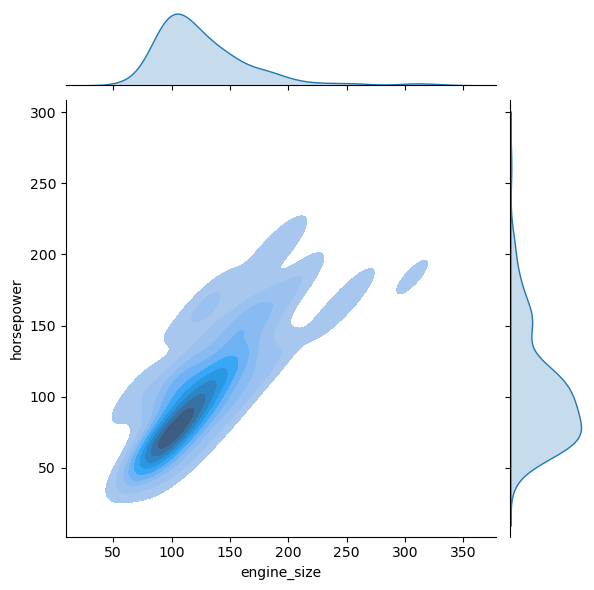

In [81]:
## We can also create a kde plot by setting kind ='kde'
# a kde joint plot uses color to determine where observations are most dense -> it creates a continues plot using probabilities of new data shoulbe introduced
sns.jointplot(data=dv, x='engine_size', y='horsepower', kind ='kde', fill=True);

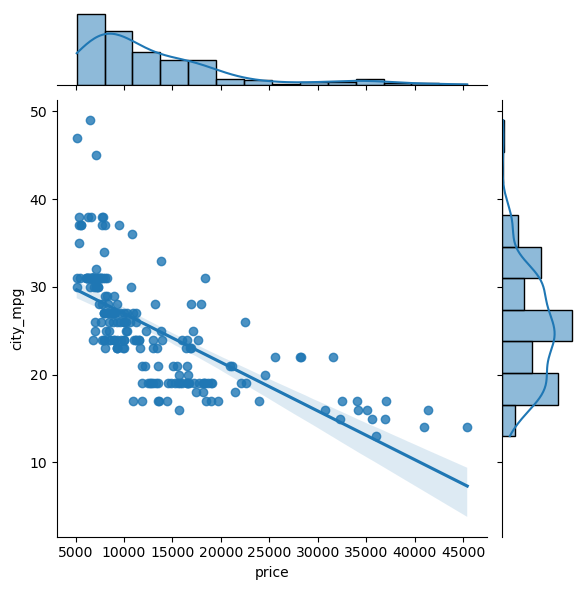

In [82]:
# by using kind ='reg', we can use the joint plot to find the best line or curve that firts the plot
sns.jointplot(data=dv, x='price', y='city_mpg', kind ='reg');

# A voilin plots combines a histogram and box plot, it i used to visualise the distribution of the numeric variable for several groups

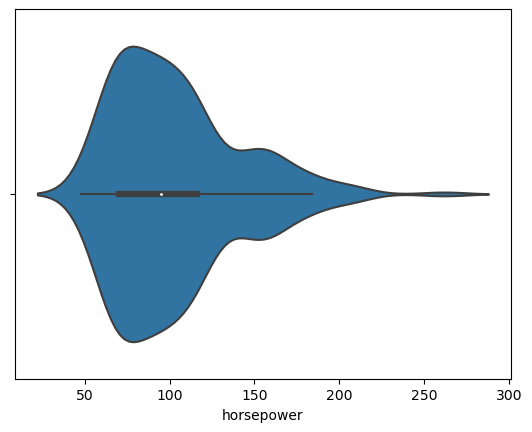

In [84]:
sns.violinplot(data=dv, x='horsepower');

<AxesSubplot:xlabel='fuel_type', ylabel='horsepower'>

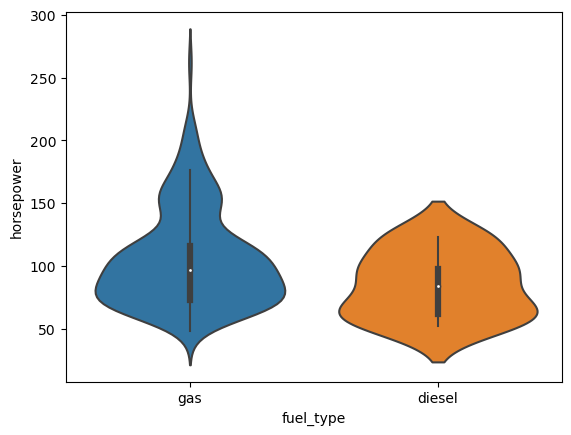

In [86]:
sns.violinplot(data=dv,x='fuel_type',y='horsepower')

<AxesSubplot:xlabel='engine_size', ylabel='fuel_type'>

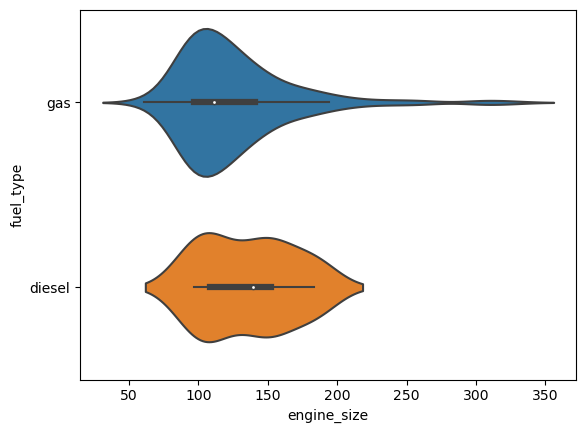

In [88]:
sns.violinplot(data=dv,x='engine_size',y='fuel_type')

<AxesSubplot:xlabel='body_style', ylabel='engine_size'>

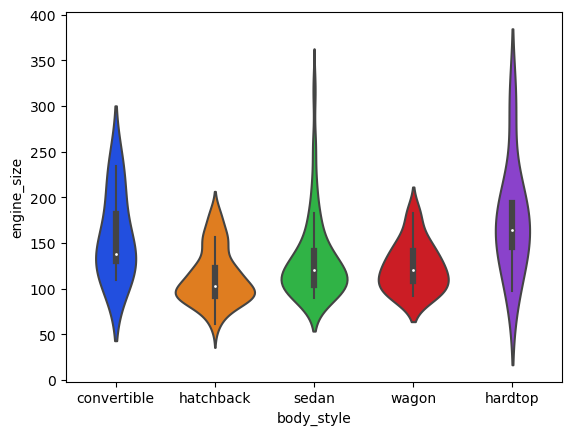

In [90]:
sns.violinplot(data=dv,x='body_style',y='engine_size', palette='bright')

<AxesSubplot:xlabel='engine_location', ylabel='price'>

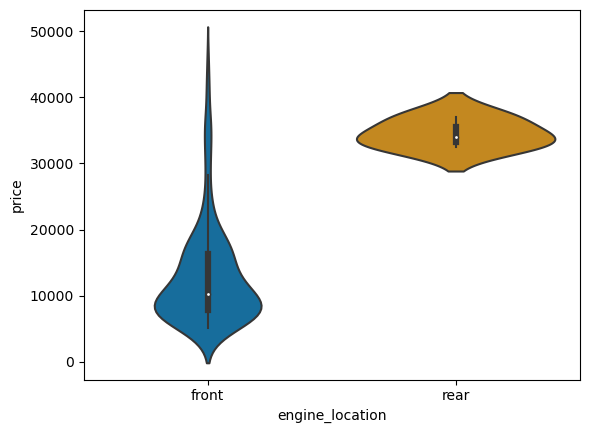

In [92]:
sns.violinplot(data=dv,x='engine_location',y='price', palette='colorblind')

# Stripplot is basically a scatter plot that differentiates different categeries sns.stripplot()

<AxesSubplot:xlabel='engine_size'>

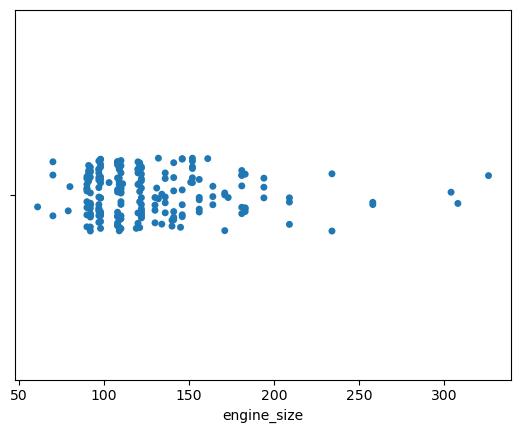

In [94]:
sns.stripplot(data=dv,x='engine_size')

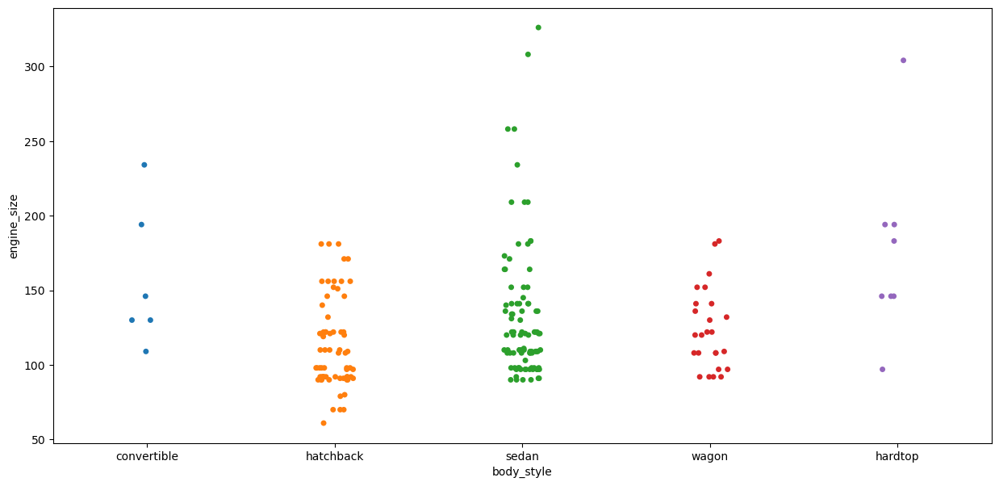

In [96]:
plt.figure(figsize=(15,7))
sns.stripplot(data=dv,x='body_style',y='engine_size');

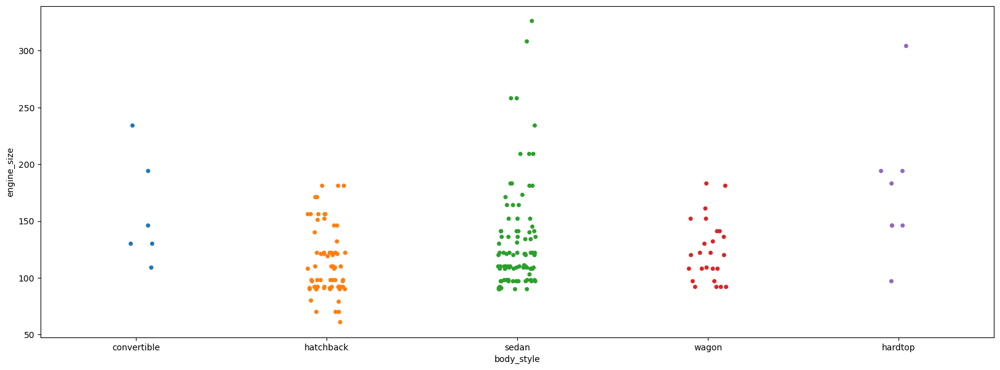

In [98]:
plt.figure(figsize=(20,7))
sns.stripplot(data=dv,x='body_style',y='engine_size',jitter=True);

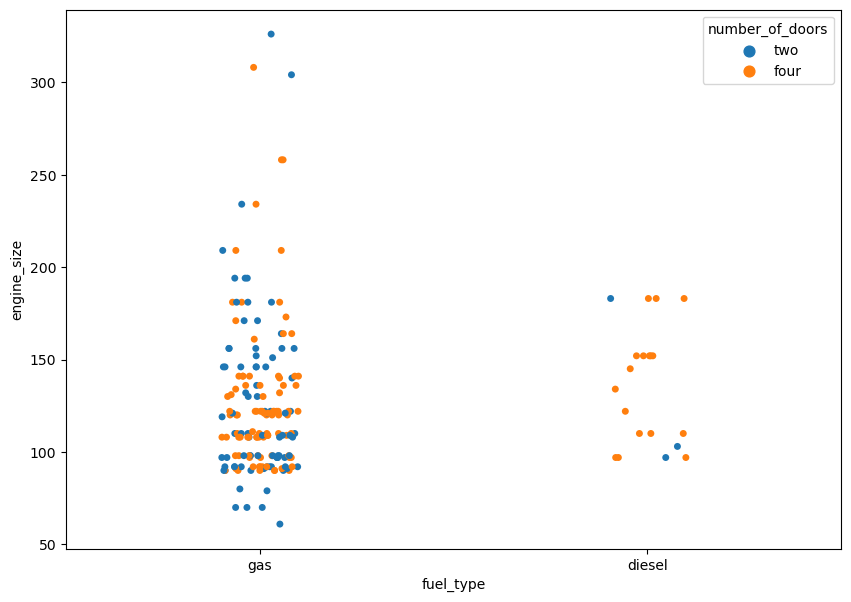

In [100]:
plt.figure(figsize=(10,7))
sns.stripplot(data=dv,x='fuel_type',y='engine_size',hue='number_of_doors',jitter=True);

# A Swarm plot is similar to strip plot but it avoids overlapping of points sns.swarmplot()

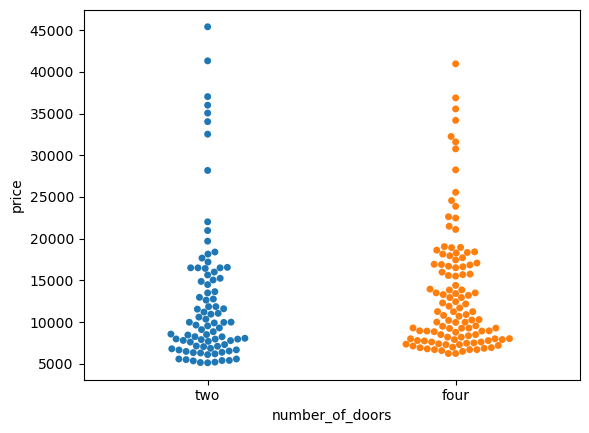

In [101]:
# InSwarmplot, dots are arranged in vertical column
# so we can estimate the distribution of data by looking at the width of the plot
sns.swarmplot(data=dv,x='number_of_doors',y='price');

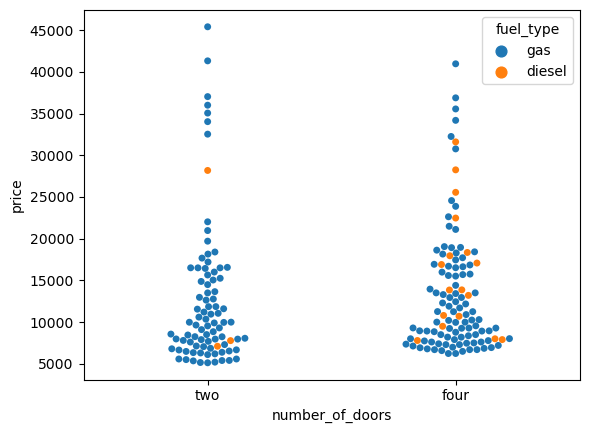

In [103]:
sns.swarmplot(data=dv,x='number_of_doors',y='price', hue='fuel_type');

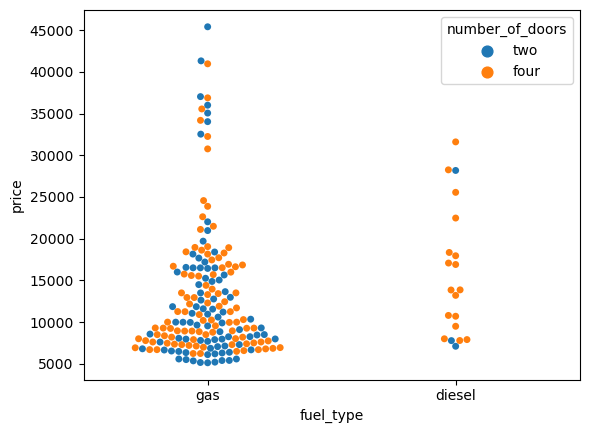

In [104]:
sns.swarmplot(data=dv,x='fuel_type',y='price', hue='number_of_doors');

# CATPLOT¶
the catplot function provides a new framework giving access to several types of plots that show relationship between numerical variable and one or more categorical variable. catplot supports 8 differenct plot inluding stripplot(), swarmplot(), boxplot() and more with default kind being strip

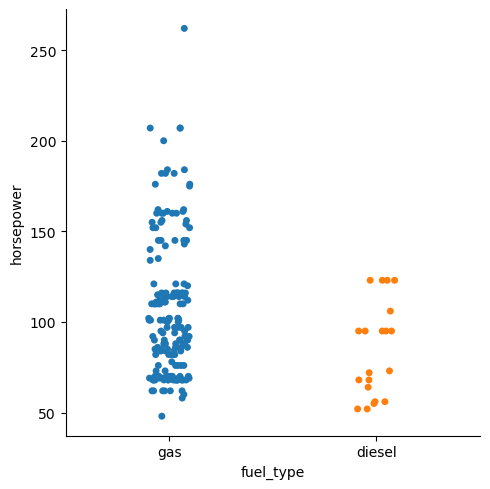

In [106]:
sns.catplot(data=dv, x='fuel_type', y='horsepower')

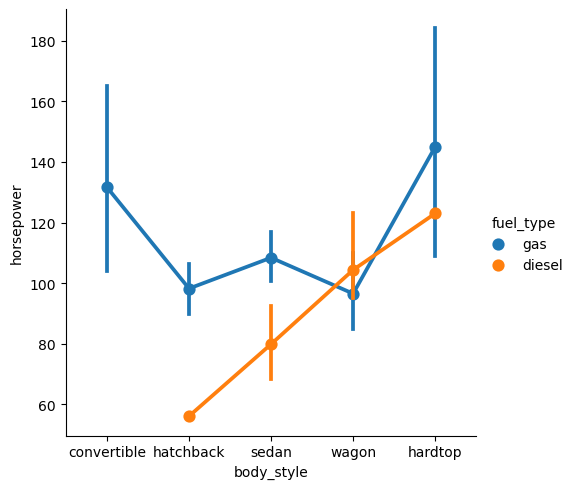

In [107]:
sns.catplot(data=dv, x='body_style', y='horsepower',hue='fuel_type', kind='point');

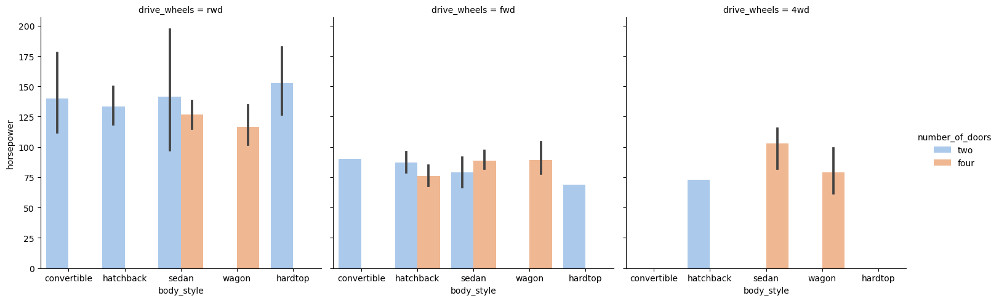

In [109]:
sns.catplot(data=dv, x='body_style', y='horsepower',hue='number_of_doors', kind='bar',col='drive_wheels',palette='pastel');

# A pairplot shows relationship between 2 numeric variables for each pair of columns in the dataset pairplot()

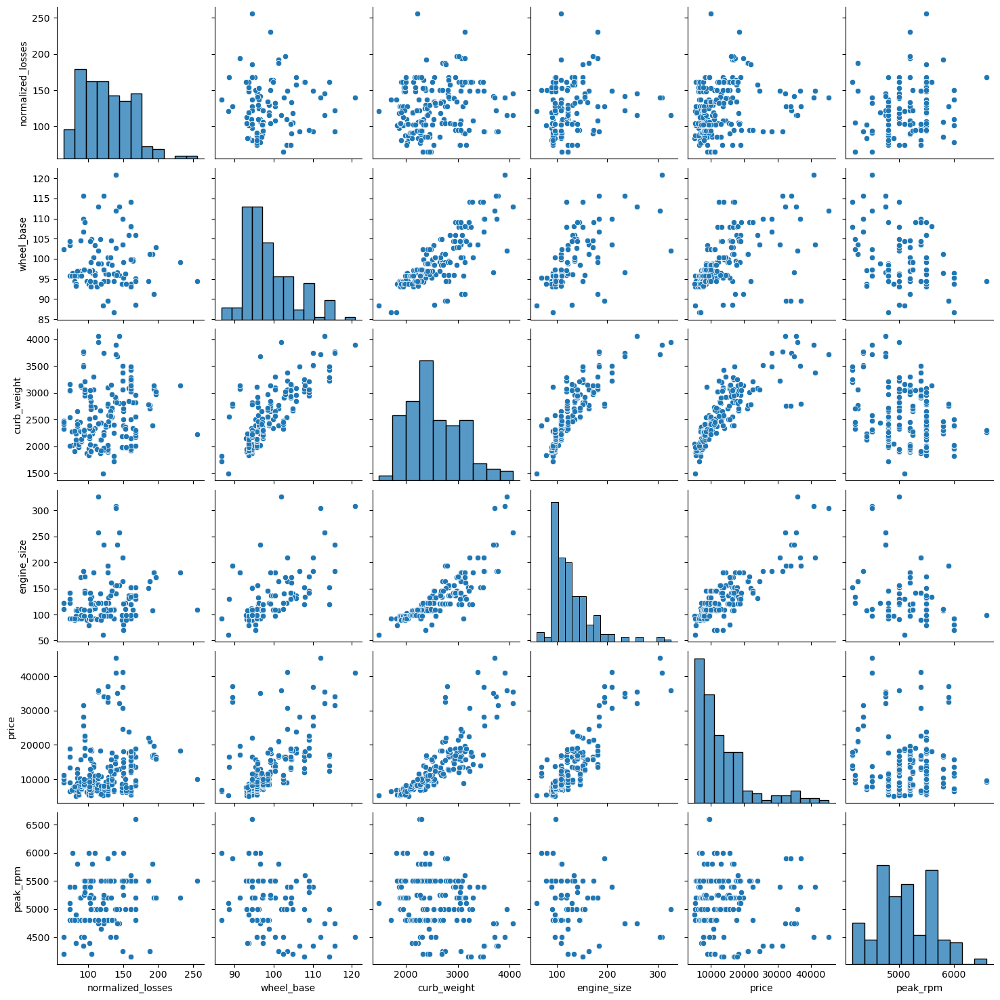

In [112]:
sns.pairplot(data=dv[['normalized_losses','wheel_base','curb_weight','engine_size','price','peak_rpm']])

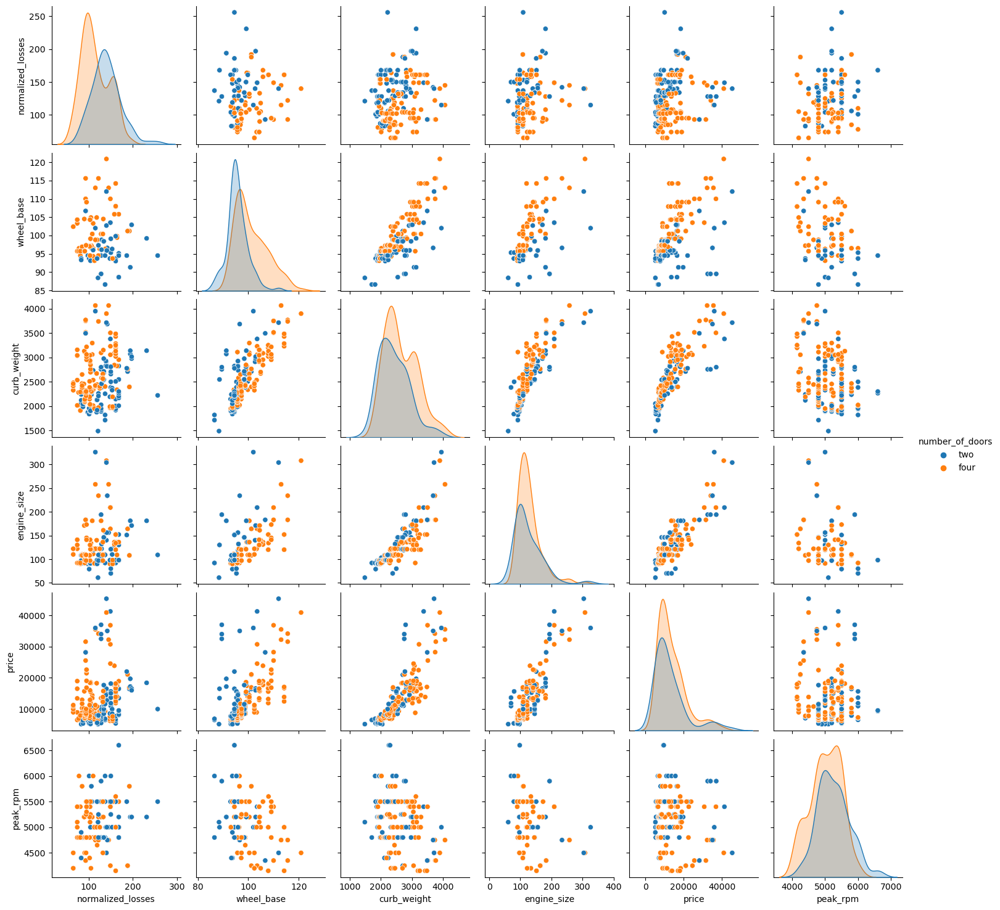

In [114]:
# we can add vars parameter
sns.pairplot(data=dv,vars=['normalized_losses','wheel_base','curb_weight','engine_size','price','peak_rpm'],hue='number_of_doors');

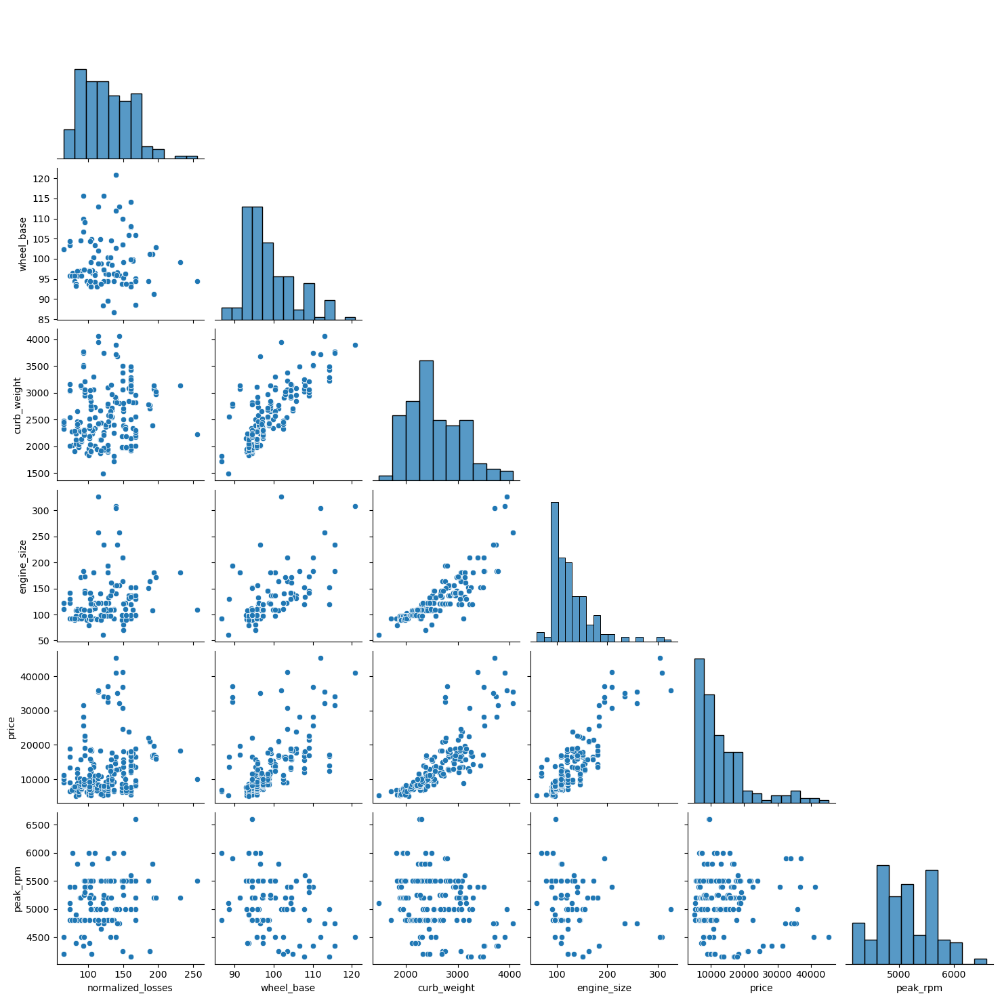

In [116]:
# corner=True to plot only the lower triangle to the pairplot
sns.pairplot(data=dv,vars=['normalized_losses','wheel_base','curb_weight','engine_size','price','peak_rpm'],corner=True);

# HEATMAP is a graphical represntation of data as a color-encoded matrix
it is a great way of representing the correlation for each pair of column in the data.

<AxesSubplot:>

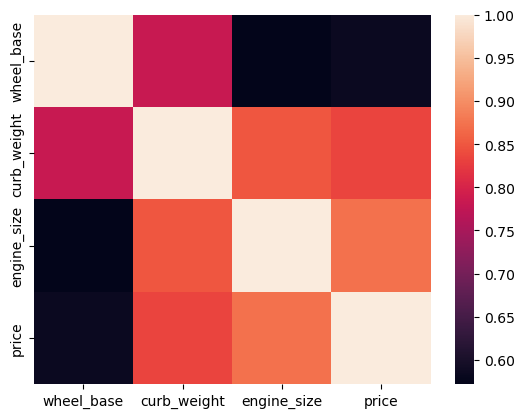

In [117]:
sns.heatmap (data=dv[['wheel_base','curb_weight','engine_size','price']].corr())

<AxesSubplot:>

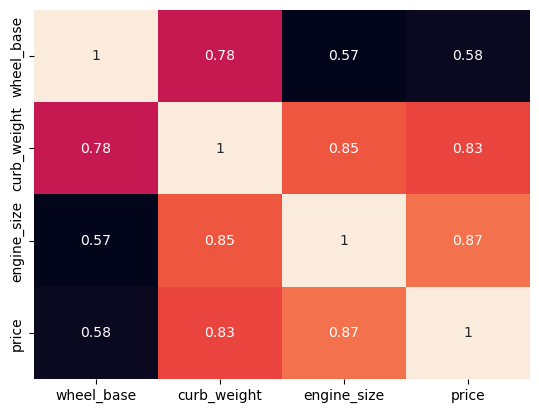

In [119]:
# Set annot parameter to True for displaying the numeric value in each cell
# to remove the color bar, the cbar parameter can be set to False
sns.heatmap (data=dv[['wheel_base','curb_weight','engine_size','price']].corr(), annot=True, cbar=False)

<AxesSubplot:>

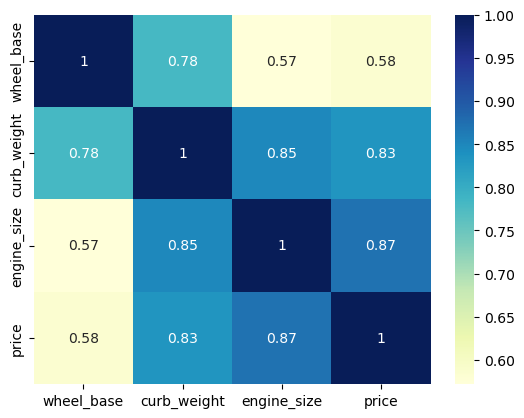

In [121]:
sns.heatmap (data=dv[['wheel_base','curb_weight','engine_size','price']].corr(), annot=True, cmap='YlGnBu')

# PLOTLY is an open source Python graphing library for building beautiful interactive visualizations

In [122]:
import plotly.express as px

In [123]:
his = px.histogram(dv,x='price')
his.show()

In [124]:
# Create an array of 8 eights
np.zeros(8)

array([0., 0., 0., 0., 0., 0., 0., 0.])

In [125]:
# Create an array for eight ones
np.ones(8)

array([1., 1., 1., 1., 1., 1., 1., 1.])

In [126]:
# Create an array for eight 7's
np.ones(8)*7

array([7., 7., 7., 7., 7., 7., 7., 7.])

In [127]:
#Create an array of the integers from 10 to 50
arr = np.arange(10,50)
arr

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49])

In [128]:
#  Create a 3x3 matrix with values ranging from 22 to 30
np.arange(22,31).reshape(3,3)

array([[22, 23, 24],
       [25, 26, 27],
       [28, 29, 30]])

# Indexing
Use below Array 'arr' for Questions below.

arr = np.arange(26,51).reshape(5,5)

In [129]:
arr =np.arange(26,51).reshape(5,5)
arr

array([[26, 27, 28, 29, 30],
       [31, 32, 33, 34, 35],
       [36, 37, 38, 39, 40],
       [41, 42, 43, 44, 45],
       [46, 47, 48, 49, 50]])

4. Use indexing on arr to get below output
   
   [[37, 38, 39, 40],
   
   [42, 43, 44, 45],
   
   [47, 48, 49, 50]]
   

In [130]:
arr[2:,1:]

array([[37, 38, 39, 40],
       [42, 43, 44, 45],
       [47, 48, 49, 50]])

# 5. Use indexing on arr to get below output
Output should be 50

In [131]:
arr[4,4]

50

# Use indexing on arr to get below output
  [[27],
  
   [32],
   
   [37]]

In [132]:
arr[0:3,1:2]

array([[27],
       [32],
       [37]])

# Use indexing on arr to get below output
  [46, 47, 48, 49, 50]
 

In [133]:
arr[4:,:]

array([[46, 47, 48, 49, 50]])

In [134]:
arr[-1]

array([46, 47, 48, 49, 50])

# Use indexing on arr to get below output
 [[41, 42, 43, 44, 45],
 
   [46, 47, 48, 49, 50]]

In [136]:
arr[3:]

array([[41, 42, 43, 44, 45],
       [46, 47, 48, 49, 50]])

# NumPy Stats Functions
Use below given array 'arr'

In [137]:
arr = np.arange(10,40).reshape(6,5)
arr

array([[10, 11, 12, 13, 14],
       [15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24],
       [25, 26, 27, 28, 29],
       [30, 31, 32, 33, 34],
       [35, 36, 37, 38, 39]])

# Find the sum of all the values in given array 'arr'

In [138]:
np.sum(arr)

735

In [140]:
# Find the standard deviation of the values in given array 'arr'
np.std(arr)

8.65544144839919

In [141]:
#  Find the mean of all the values in given array 'arr'
np.mean(arr)

24.5

In [146]:
df =pd.read_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\sales.csv')
df

,Observation,Dist_Taxi,Dist_Market,Dist_Metro,Store_Area,Items_Available,Parking,Coupon_Category,Daily_Customer_Count,Store_Sales
0,1,9796.0,5250.0,10703.0,1659.0,1961.0,Open,CAT B,530,66490
1,2,8294.0,8186.0,12694.0,1461.0,1752.0,Not Provided,CAT B,210,39820
2,3,11001.0,14399.0,16991.0,1340.0,1609.0,Not Provided,CAT A,720,54010
3,4,8301.0,11188.0,12289.0,1451.0,1748.0,Covered,CAT B,620,53730
4,5,10510.0,12629.0,13921.0,1770.0,2111.0,Not Provided,CAT B,450,46620
...,...,...,...,...,...,...,...,...,...,...
927,928,12176.0,8518.0,15673.0,1582.0,1910.0,Covered,CAT C,1080,66390
928,929,7214.0,8717.0,10553.0,1387.0,1663.0,Open,CAT A,850,82080
929,930,7423.0,11708.0,13220.0,1200.0,1436.0,Open,CAT A,1060,76440
930,931,15082.0,14700.0,19617.0,1299.0,1560.0,Open,CAT B,770,96610


In [147]:
# What are the unique values in the column "Parking"?
df["Parking"].value_counts()

Open            372
Not Provided    227
Covered         188
No Parking      145
Name: Parking, dtype: int64

In [148]:
# What is the mean store area of the given data?
df['Store_Area'].mean()

1511.862554112554

In [149]:
df['Coupon_Category'].unique()

array(['CAT B', 'CAT A', 'CAT C'], dtype=object)

In [150]:
# What are the different columns available in the dataset?
df.columns

Index(['Observation', 'Dist_Taxi', 'Dist_Market', 'Dist_Metro', 'Store_Area',
       'Items_Available', 'Parking', 'Coupon_Category', 'Daily_Customer_Count',
       'Store_Sales'],
      dtype='object')

In [151]:
# Create a new series (series1) with only the values of third row
series1 = df.loc[2:2]
series1

,Observation,Dist_Taxi,Dist_Market,Dist_Metro,Store_Area,Items_Available,Parking,Coupon_Category,Daily_Customer_Count,Store_Sales
2,3,11001.0,14399.0,16991.0,1340.0,1609.0,Not Provided,CAT A,720,54010


In [152]:
# Create a new dataframe(df_short which contain first 5 rows and two columns("Coupon_Category" and "Store_Sales")
df_short= df.loc[[0,1,2,3,4],['Coupon_Category','Store_Sales']]
df_short

,Coupon_Category,Store_Sales
0,CAT B,66490
1,CAT B,39820
2,CAT A,54010
3,CAT B,53730
4,CAT B,46620


In [156]:
# In dataframe df_short, replace the index with ["First Row","Second Row","Third Row", "Forth Row", "Fifth Row"]
df_short['Names'] = ["First Row","Second Row","Third Row", "Forth Row", "Fifth Row"]
df_short.set_index('Names',inplace=True)

In [157]:
df_short

,Coupon_Category,Store_Sales
Names,,
First Row,CAT B,66490
Second Row,CAT B,39820
Third Row,CAT A,54010
Forth Row,CAT B,53730
Fifth Row,CAT B,46620


In [159]:
# Create a dataframe df2 fulfilling the given conditions - Dist_Metro>18000 and Parking= Open
df2 = df[(df['Dist_Metro']>18000) & (df['Parking']=='Open')]
df2

,Observation,Dist_Taxi,Dist_Market,Dist_Metro,Store_Area,Items_Available,Parking,Coupon_Category,Daily_Customer_Count,Store_Sales
88,89,14306.0,12591.0,18029.0,1441.0,1723.0,Open,CAT B,330,57860
218,219,11195.0,16650.0,18762.0,1406.0,1677.0,Open,CAT A,480,61660
338,339,9308.0,18281.0,18532.0,1771.0,2147.0,Open,CAT C,430,62710
742,743,12973.0,15178.0,18836.0,1542.0,1844.0,Open,CAT B,680,51380
791,792,14470.0,14517.0,18178.0,1645.0,1963.0,Open,CAT C,900,47300
930,931,15082.0,14700.0,19617.0,1299.0,1560.0,Open,CAT B,770,96610


In [161]:
# What is the minimum store sales and the standard Deviation of store sales.
round(df['Store_Sales'].describe(),2)

count        932.00
mean       60846.95
std        50253.64
min          300.00
25%        46580.00
50%        58660.00
75%        71872.50
max      1500000.00
Name: Store_Sales, dtype: float64

In [162]:
print(df['Store_Sales'].min())
print (df['Store_Sales'].std())

300
50253.6390220453


In [163]:
# Group the dataset with respect to the variable 'Coupon_Category' using aggregation function mean()
df.groupby(['Coupon_Category']).mean()

,Observation,Dist_Taxi,Dist_Market,Dist_Metro,Store_Area,Items_Available,Daily_Customer_Count,Store_Sales
Coupon_Category,,,,,,,,
CAT A,476.079027,8312.645062,11332.546296,13253.390244,1471.070769,1762.845679,796.018237,73998.662614
CAT B,455.901370,8101.061453,10713.675978,12880.435616,1565.709945,1831.016760,782.958904,59191.479452
CAT C,469.512605,8310.729958,11050.603376,13116.163866,1485.552743,1784.170213,775.168067,45205.504202


In [164]:
# Drop the variable 'Parking' from the data.
df.drop('Parking',axis=1,inplace=True)

In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 932 entries, 0 to 931
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Observation           932 non-null    int64  
 1   Dist_Taxi             919 non-null    float64
 2   Dist_Market           919 non-null    float64
 3   Dist_Metro            931 non-null    float64
 4   Store_Area            924 non-null    float64
 5   Items_Available       917 non-null    float64
 6   Coupon_Category       932 non-null    object 
 7   Daily_Customer_Count  932 non-null    int64  
 8   Store_Sales           932 non-null    int64  
dtypes: float64(5), int64(3), object(1)
memory usage: 65.7+ KB


In [166]:
# Export the Q10 dataframe without the 'Parking' column into a csv file
df.to_csv('df.csv',index=False)

In [167]:
# How many rows and columns are present in the dataset? (Hint- Use function shape)
df.shape

(932, 9)

In [168]:
# What are the different data types of the variables in the given dataset? (Hint- Use function info())
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 932 entries, 0 to 931
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Observation           932 non-null    int64  
 1   Dist_Taxi             919 non-null    float64
 2   Dist_Market           919 non-null    float64
 3   Dist_Metro            931 non-null    float64
 4   Store_Area            924 non-null    float64
 5   Items_Available       917 non-null    float64
 6   Coupon_Category       932 non-null    object 
 7   Daily_Customer_Count  932 non-null    int64  
 8   Store_Sales           932 non-null    int64  
dtypes: float64(5), int64(3), object(1)
memory usage: 65.7+ KB


In [169]:
# Or you can use below command as well

df.dtypes

Observation               int64
Dist_Taxi               float64
Dist_Market             float64
Dist_Metro              float64
Store_Area              float64
Items_Available         float64
Coupon_Category          object
Daily_Customer_Count      int64
Store_Sales               int64
dtype: object

In [171]:
df = pd.read_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\Data.csv')
df.head()

,applicant_id,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,...,smoking_status,Year_last_admitted,Location,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost
0,5000,3,1,1,Salried,2,125 to 150,4866,28,1,...,Unknown,NaN,Chennai,67,N,Rare,Moderate,1,25,20978
1,5001,0,0,0,Student,4,150 to 175,6411,50,0,...,formerly smoked,NaN,Jaipur,58,N,Rare,Moderate,3,27,6170
2,5002,1,0,0,Business,4,200 to 225,4509,68,0,...,formerly smoked,NaN,Jaipur,73,N,Daily,Extreme,0,32,28382
3,5003,7,4,0,Business,2,175 to 200,6214,51,0,...,Unknown,NaN,Chennai,71,Y,Rare,No,3,37,27148
4,5004,3,1,0,Student,2,150 to 175,4938,44,0,...,never smoked,2004.0,Bangalore,74,N,No,Extreme,0,34,29616


In [172]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   applicant_id                    25000 non-null  int64  
 1   years_of_insurance_with_us      25000 non-null  int64  
 2   regular_checkup_lasy_year       25000 non-null  int64  
 3   adventure_sports                25000 non-null  int64  
 4   Occupation                      25000 non-null  object 
 5   visited_doctor_last_1_year      25000 non-null  int64  
 6   cholesterol_level               25000 non-null  object 
 7   daily_avg_steps                 25000 non-null  int64  
 8   age                             25000 non-null  int64  
 9   heart_decs_history              25000 non-null  int64  
 10  other_major_decs_history        25000 non-null  int64  
 11  Gender                          25000 non-null  object 
 12  avg_glucose_level               

### 1. Should the insurance cost depend on a person’s gender? What does the data tell you?

<AxesSubplot:xlabel='Gender', ylabel='insurance_cost'>

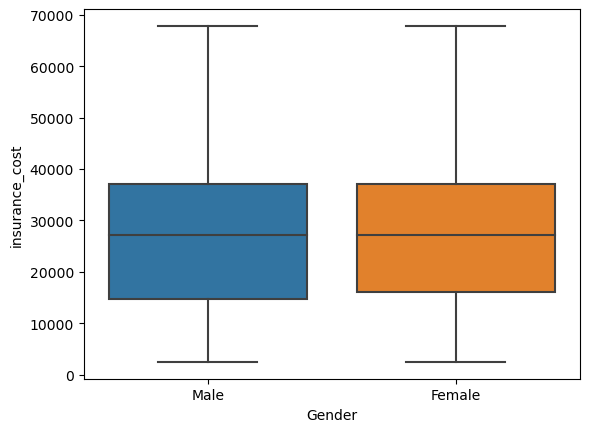

In [173]:
sns.boxplot(x=df['Gender'], y=df['insurance_cost'])

<AxesSubplot:xlabel='Gender', ylabel='insurance_cost'>

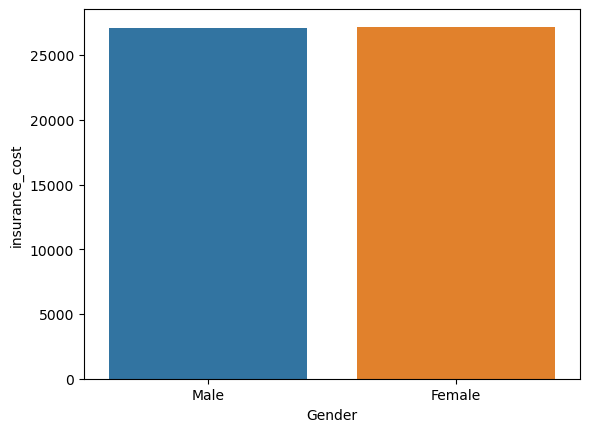

In [174]:
sns.barplot(x=df['Gender'], y=df['insurance_cost'], ci=False)

<AxesSubplot:xlabel='smoking_status', ylabel='insurance_cost'>

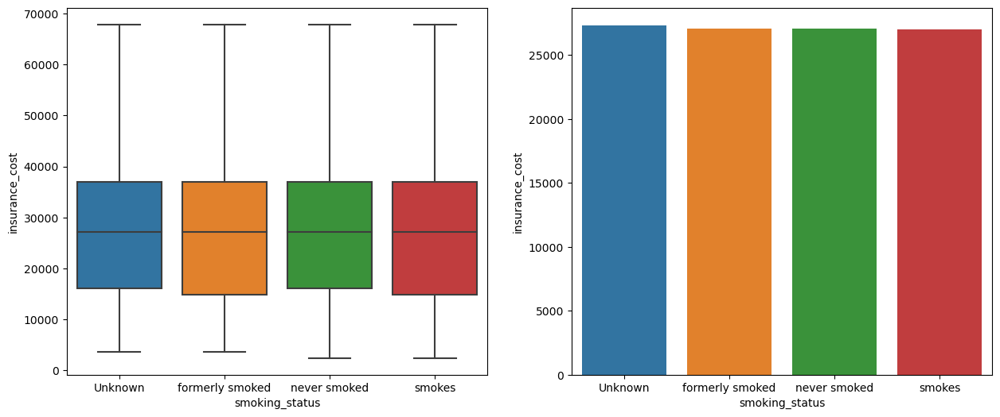

In [175]:
### 2. Do you think that “smoking_status” should affect the “insurance_cost”?
plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
sns.boxplot(x=df['smoking_status'], y=df['insurance_cost'])

plt.subplot(1,2,2)
sns.barplot(x=df['smoking_status'], y=df['insurance_cost'], ci=False)

<AxesSubplot:xlabel='adventure_sports', ylabel='insurance_cost'>

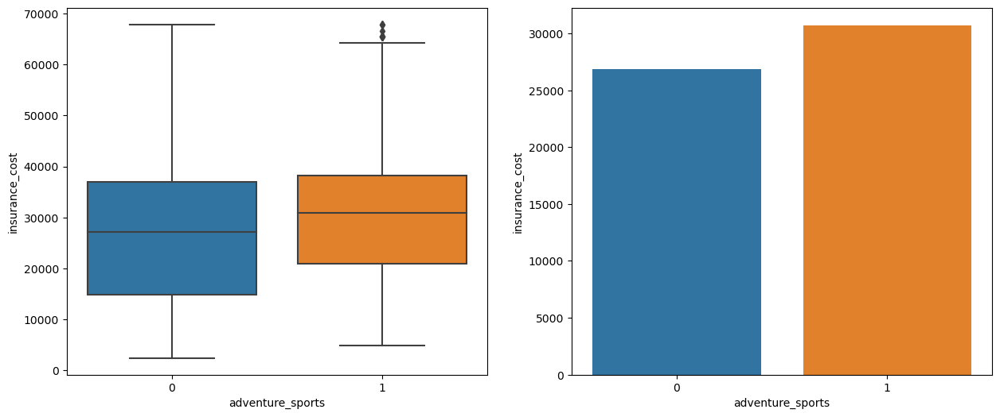

In [176]:
# Should people playing “adventure_sports” be charged a premium when it comes to the “insurance_cost” or should these people be not given insurance at all? Like, should they be considered in a different bracket as compared to the normal consumers?
plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
sns.boxplot(x=df['adventure_sports'], y=df['insurance_cost'])

plt.subplot(1,2,2)
sns.barplot(x=df['adventure_sports'], y=df['insurance_cost'], ci=False)

In [177]:
df['adventure_sports'].value_counts(normalize=True)

0    0.91828
1    0.08172
Name: adventure_sports, dtype: float64

<AxesSubplot:>

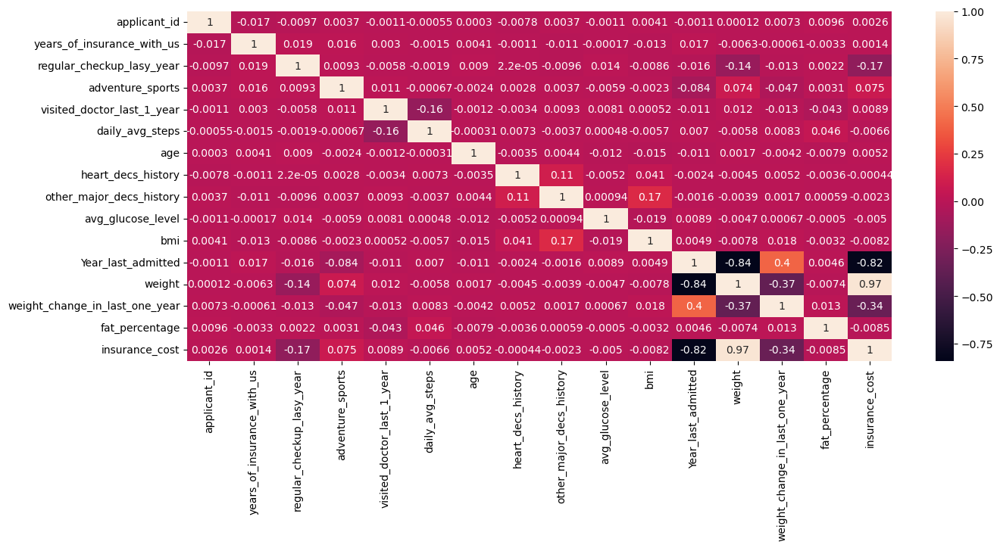

In [178]:
# Do Females pay more after adjusting for BMI?
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(), annot=True)

<AxesSubplot:xlabel='Gender', ylabel='premium_per_unit_bmi'>

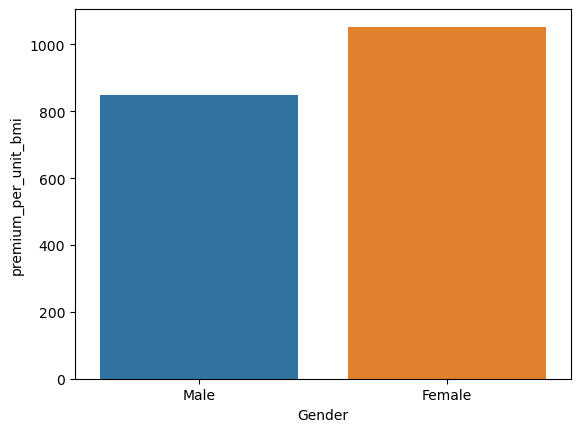

In [179]:
df['premium_per_unit_bmi'] = df['insurance_cost'] / df['bmi']
sns.barplot(x=df['Gender'], y=df['premium_per_unit_bmi'], ci=False)

<AxesSubplot:xlabel='regular_checkup_lasy_year', ylabel='insurance_cost'>

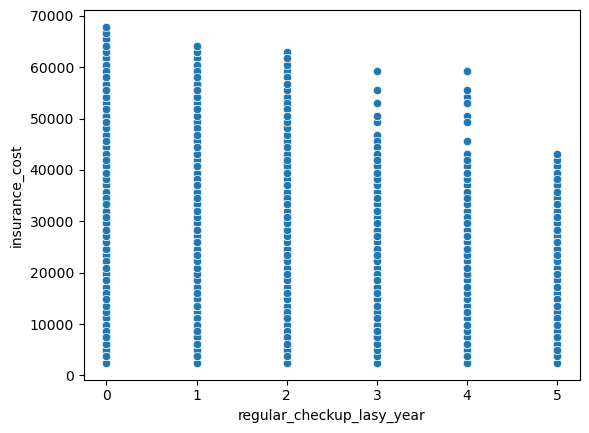

In [182]:
# Should the number of times that the person has had a checkup in the last year be responsible for
# the insurance that they pay?
sns.scatterplot(x=df['regular_checkup_lasy_year'], y=df['insurance_cost'])

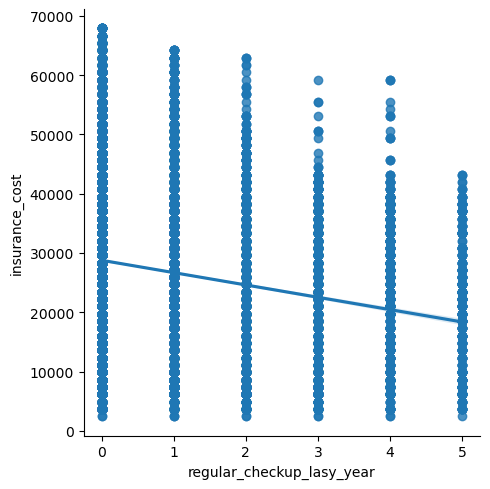

In [183]:
sns.lmplot(data=df, x='regular_checkup_lasy_year', y='insurance_cost')

<AxesSubplot:xlabel='regular_checkup_lasy_year', ylabel='insurance_cost'>

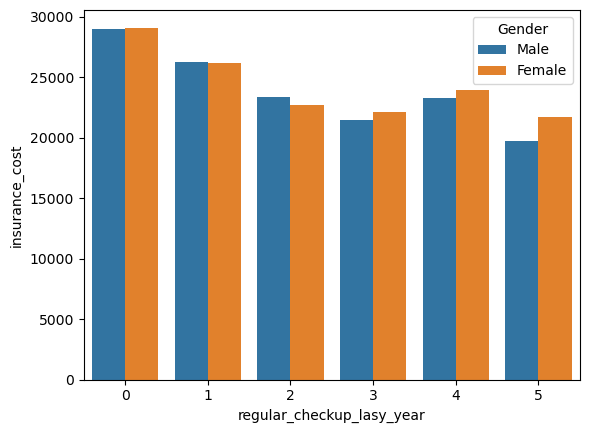

In [184]:
sns.barplot(x=df['regular_checkup_lasy_year'], y=df['insurance_cost'], ci=False, hue=df['Gender'])

<AxesSubplot:xlabel='regular_checkup_lasy_year', ylabel='insurance_cost'>

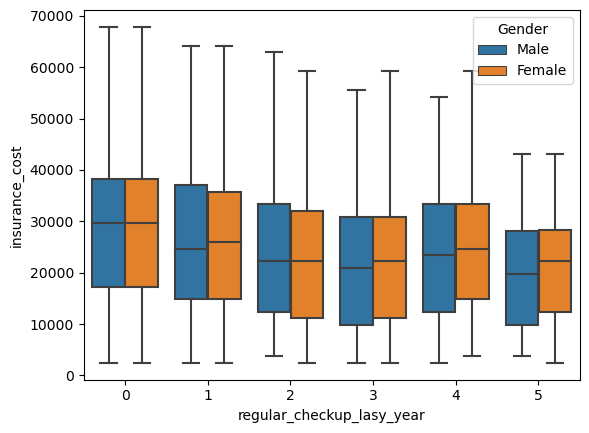

In [185]:
sns.boxplot(x=df['regular_checkup_lasy_year'], y=df['insurance_cost'], hue=df['Gender'])

<AxesSubplot:xlabel='regular_checkup_lasy_year'>

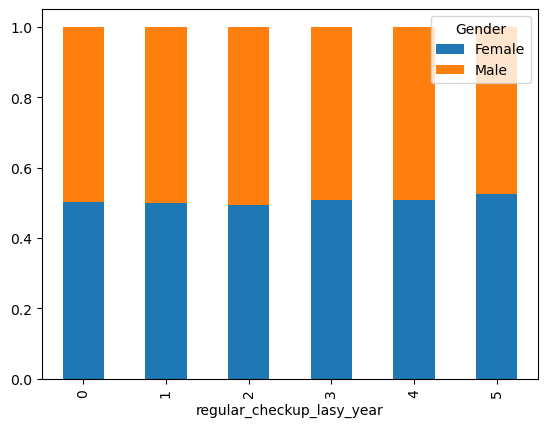

In [186]:
pd.crosstab(index=df['regular_checkup_lasy_year'], columns=df['Gender'], values = df['insurance_cost'], aggfunc = 'mean', 
           normalize='index').plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='heart_decs_history', ylabel='insurance_cost'>

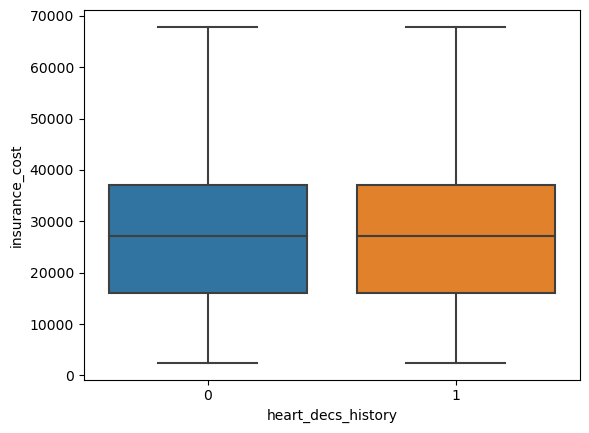

In [187]:
# A history of heart disease should in theory raise the insurance premium but is the premium going 
# to be offset by the daily average steps and cholesterol level?
sns.boxplot(x=df['heart_decs_history'], y=df['insurance_cost'])

In [188]:
pd.crosstab(df['cholesterol_level'], df['heart_decs_history'], values=df['premium_per_unit_bmi'], aggfunc='mean')

heart_decs_history,0,1
cholesterol_level,,
125 to 150,922.474198,834.620049
150 to 175,927.687834,835.781957
175 to 200,904.646004,914.258434
200 to 225,945.444141,845.327808
225 to 250,898.706426,932.023469


<AxesSubplot:xlabel='Alcohol', ylabel='insurance_cost'>

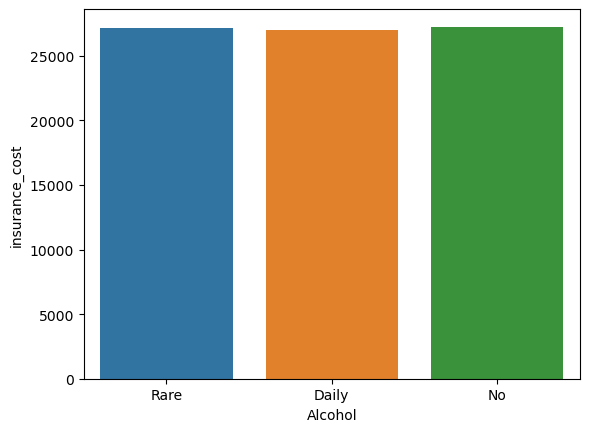

In [189]:
#  How would you want to decide the insurance premium for smokers and people who drink alcohol?
sns.barplot(x=df['Alcohol'], y=df['insurance_cost'], ci=False)

<AxesSubplot:xlabel='smoking_status'>

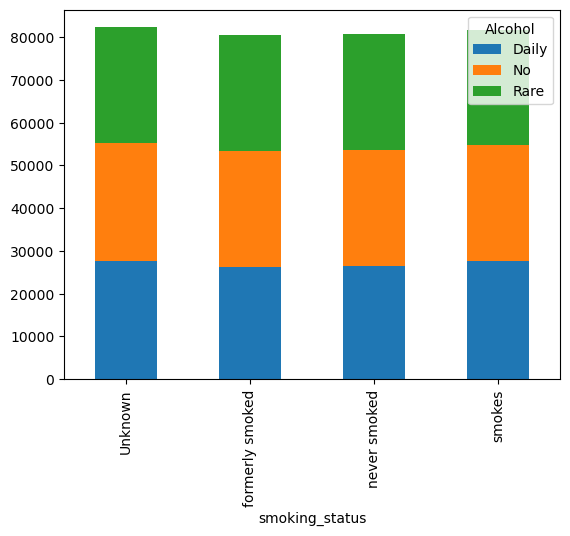

In [190]:
pd.crosstab(df['smoking_status'], df['Alcohol'], values=df['insurance_cost'], 
            aggfunc='mean').plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='years_of_insurance_with_us', ylabel='insurance_cost'>

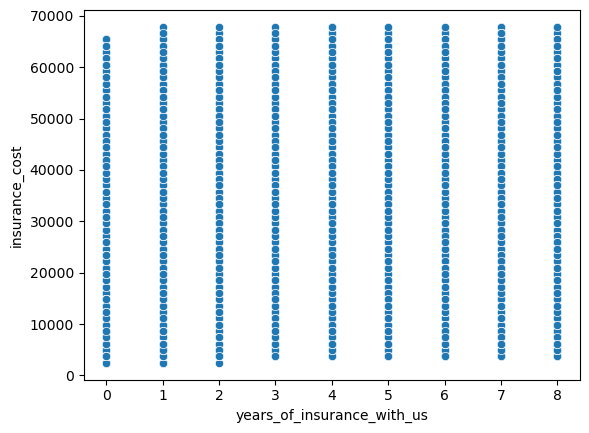

In [191]:
# Does a loyalty program with the insurance company affect the premium?
sns.scatterplot(x=df['years_of_insurance_with_us'], y=df['insurance_cost'])

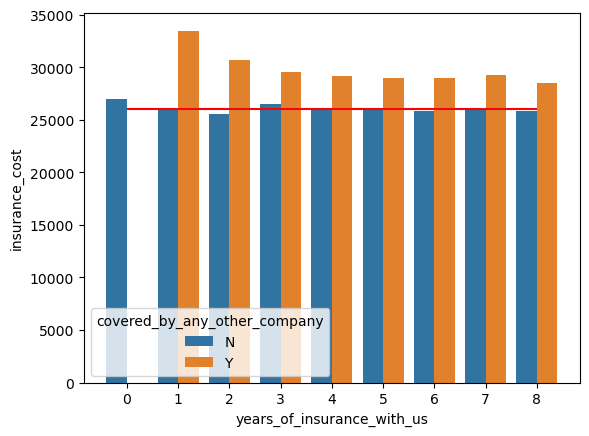

In [192]:
sns.barplot(x=df['years_of_insurance_with_us'], y=df['insurance_cost'], ci=False, hue=df['covered_by_any_other_company'])
plt.hlines(y=26000, xmin=0, xmax=8, color='red')

<AxesSubplot:xlabel='insurance_cost', ylabel='Location'>

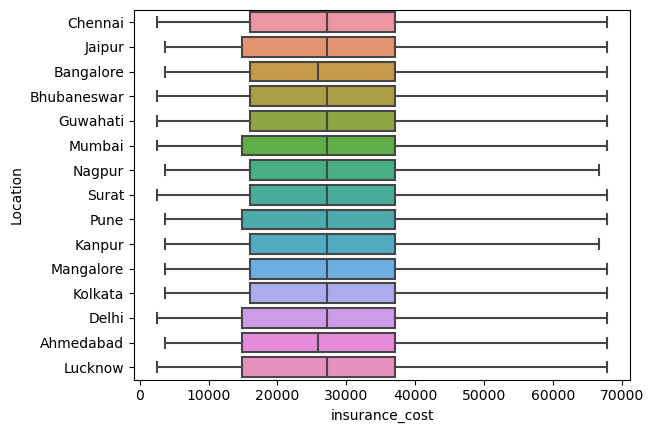

In [193]:
# Should Location and Occupation have an effect on the insurance premium?
sns.boxplot(y=df['Location'], x=df['insurance_cost'])

<AxesSubplot:xlabel='insurance_cost', ylabel='Occupation'>

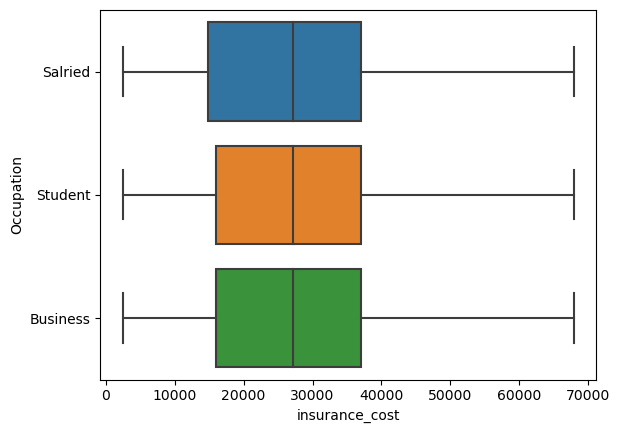

In [194]:
sns.boxplot(y=df['Occupation'], x=df['insurance_cost'])

<AxesSubplot:xlabel='Location'>

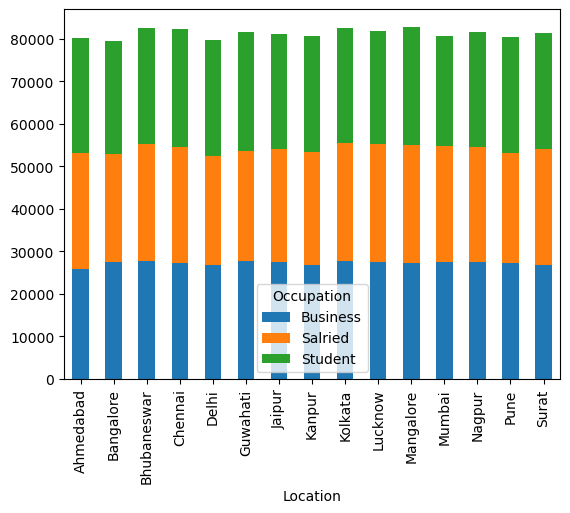

In [195]:
pd.crosstab(df['Location'], df['Occupation'], values=df['insurance_cost'], 
            aggfunc='mean').plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='age', ylabel='insurance_cost'>

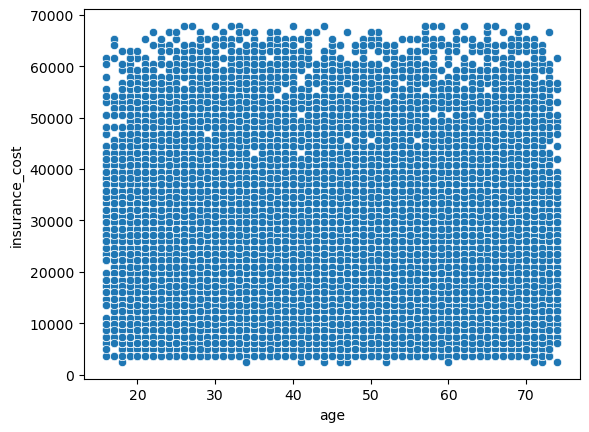

In [196]:
sns.scatterplot(x=df['age'], y=df['insurance_cost'])

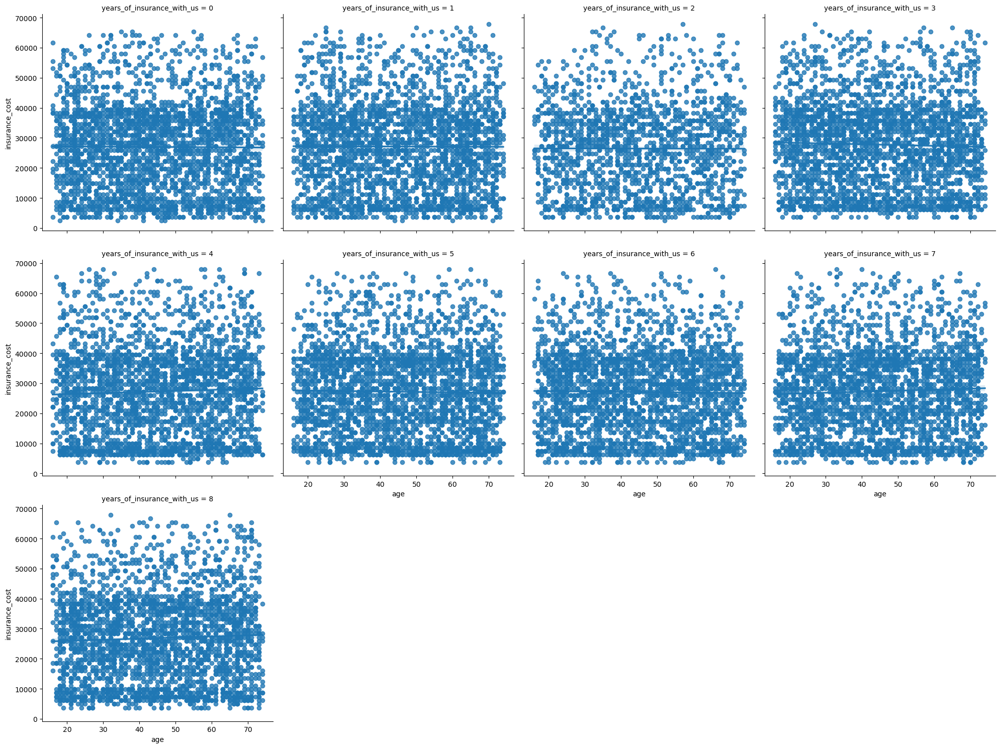

In [197]:
sns.lmplot(x='age', y='insurance_cost', data=df, col='years_of_insurance_with_us', col_wrap=4)

In [203]:
 # Load the Cardio Dataset

mydata = pd.read_csv(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\CardioGoodFitness.csv')

In [205]:
mydata.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,TM195,18,Male,14,Single,3,4,29562,112
1,TM195,19,Male,15,Single,2,3,31836,75
2,TM195,19,Female,14,Partnered,4,3,30699,66
3,TM195,19,Male,12,Single,3,3,32973,85
4,TM195,20,Male,13,Partnered,4,2,35247,47


In [206]:
mydata.describe(include="all")

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
count,180,180.000000,180,180.000000,180,180.000000,180.000000,180.000000,180.000000
unique,3,NaN,2,NaN,2,NaN,NaN,NaN,NaN
top,TM195,NaN,Male,NaN,Partnered,NaN,NaN,NaN,NaN
freq,80,NaN,104,NaN,107,NaN,NaN,NaN,NaN
mean,NaN,28.788889,NaN,15.572222,NaN,3.455556,3.311111,53719.577778,103.194444
std,NaN,6.943498,NaN,1.617055,NaN,1.084797,0.958869,16506.684226,51.863605
min,NaN,18.000000,NaN,12.000000,NaN,2.000000,1.000000,29562.000000,21.000000
25%,NaN,24.000000,NaN,14.000000,NaN,3.000000,3.000000,44058.750000,66.000000
50%,NaN,26.000000,NaN,16.000000,NaN,3.000000,3.000000,50596.500000,94.000000
75%,NaN,33.000000,NaN,16.000000,NaN,4.000000,4.000000,58668.000000,114.750000


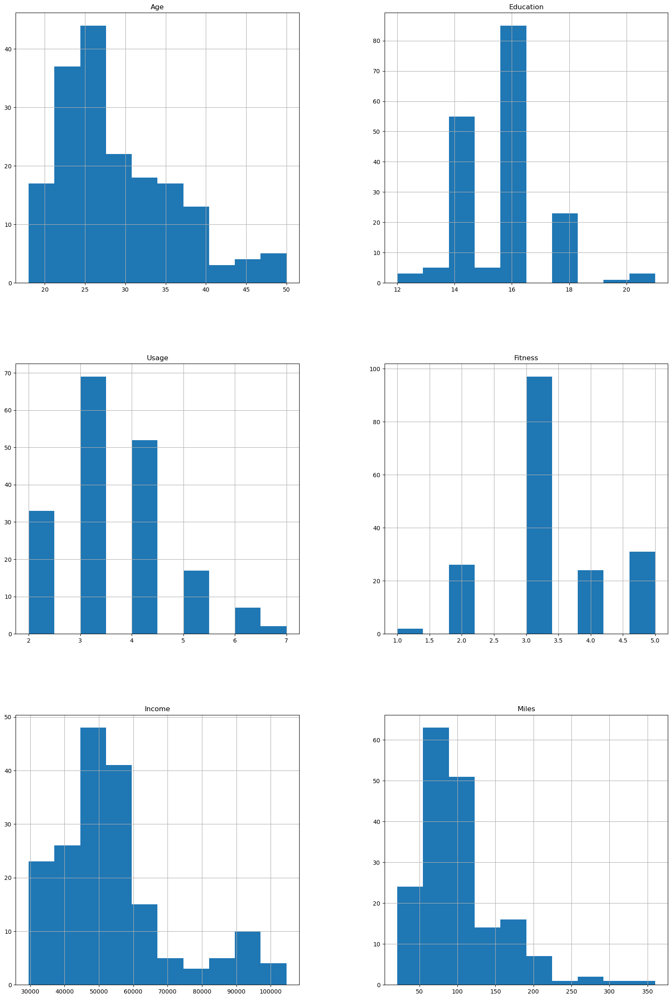

In [207]:
import matplotlib.pyplot as plt
%matplotlib inline

mydata.hist(figsize=(20,30));

<AxesSubplot:xlabel='Gender', ylabel='Age'>

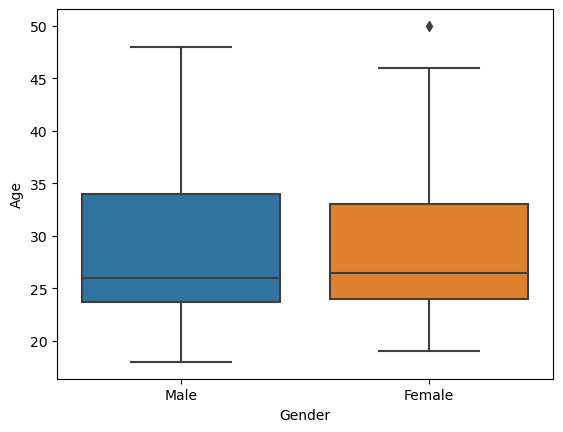

In [208]:
import seaborn as sns

sns.boxplot(x="Gender", y="Age", data=mydata)

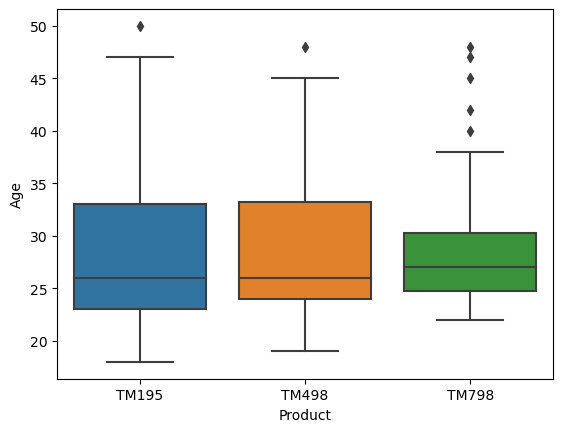

In [209]:
sns.boxplot(data=mydata , x='Product',y='Age');

In [210]:
pd.crosstab(mydata['Product'],mydata['Gender'])

Gender,Female,Male
Product,,
TM195,40,40
TM498,29,31
TM798,7,33


In [211]:
pd.crosstab(mydata['Product'],mydata['MaritalStatus'] )

MaritalStatus,Partnered,Single
Product,,
TM195,48,32
TM498,36,24
TM798,23,17


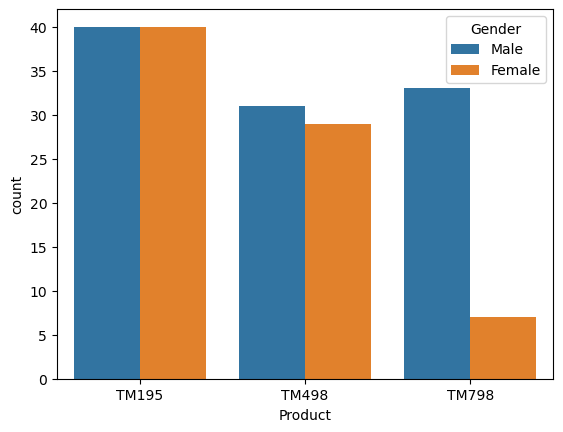

In [212]:
sns.countplot(data=mydata , x='Product', hue='Gender');

In [213]:
pd.pivot_table(mydata , index=['Product','Gender'],
              columns=['MaritalStatus'],aggfunc=len)

Age        Education          Fitness           Income  \
MaritalStatus  Partnered Single Partnered Single Partnered Single Partnered   
Product Gender                                                                
TM195   Female        27     13        27     13        27     13        27   
        Male          21     19        21     19        21     19        21   
TM498   Female        15     14        15     14        15     14        15   
        Male          21     10        21     10        21     10        21   
TM798   Female         4      3         4      3         4      3         4   
        Male          19     14        19     14        19     14        19   

                          Miles            Usage         
MaritalStatus  Single Partnered Single Partnered Single  
Product Gender                                           
TM195   Female     13        27     13        27     13  
        Male       19        21     19        21     19  
TM498   Female     14        15     14        15     14  
        Male       10        21     10        21     10  
TM798   Female      3         4      3         4      3  
        Male       14        19     14        19     14

In [214]:
pd.pivot_table(mydata,'Income', index=['Product', 'Gender'],
                     columns=[ 'MaritalStatus'])

MaritalStatus      Partnered        Single
Product Gender                            
TM195   Female  46153.777778  45742.384615
        Male    50028.000000  43265.842105
TM498   Female  49724.800000  48920.357143
        Male    49378.285714  47071.800000
TM798   Female  84972.250000  58516.000000
        Male    81431.368421  68216.428571

In [215]:
pd.pivot_table(mydata,'Miles', index=['Product', 'Gender'],
                     columns=[ 'MaritalStatus'])

MaritalStatus    Partnered      Single
Product Gender                        
TM195   Female   74.925926   78.846154
        Male     80.190476   99.526316
TM498   Female   94.000000   80.214286
        Male     87.238095   91.100000
TM798   Female  215.000000  133.333333
        Male    176.315789  147.571429

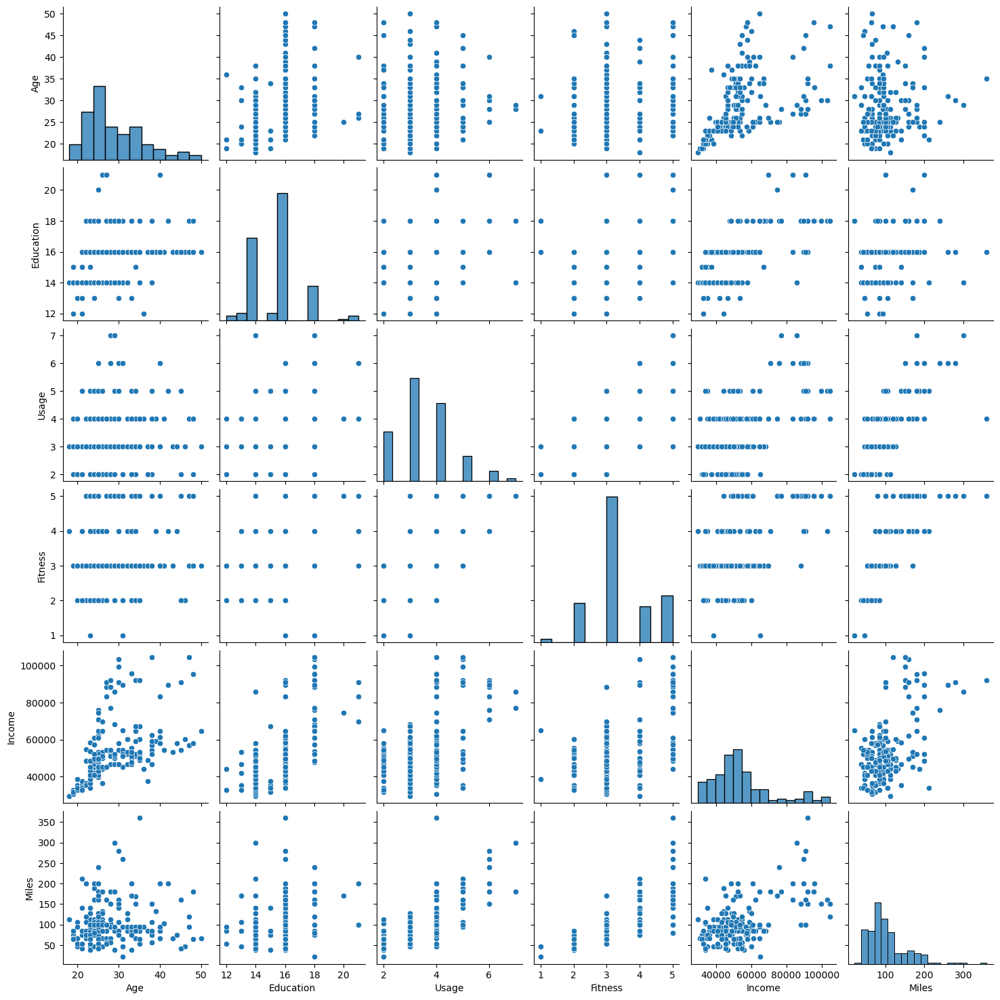

In [216]:
sns.pairplot(mydata);

In [217]:
mydata['Age'].std()

6.943498135399795

In [218]:
mydata['Age'].mean()

28.788888888888888

C:\Users\Nishu\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Age', ylabel='Density'>

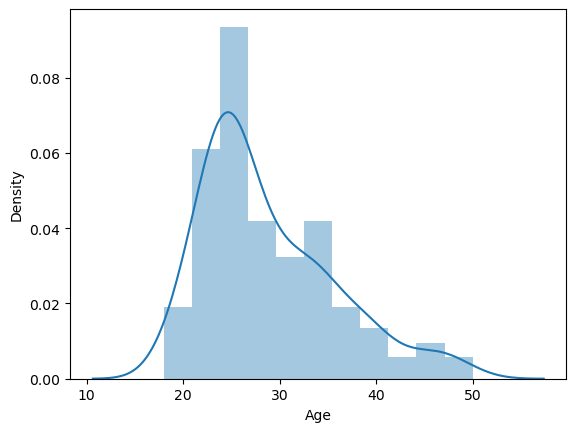

In [219]:
sns.distplot(mydata['Age'])

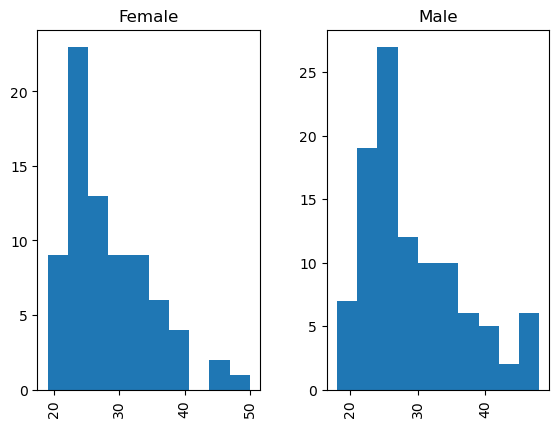

In [221]:
mydata.hist(by='Gender',column = 'Age');

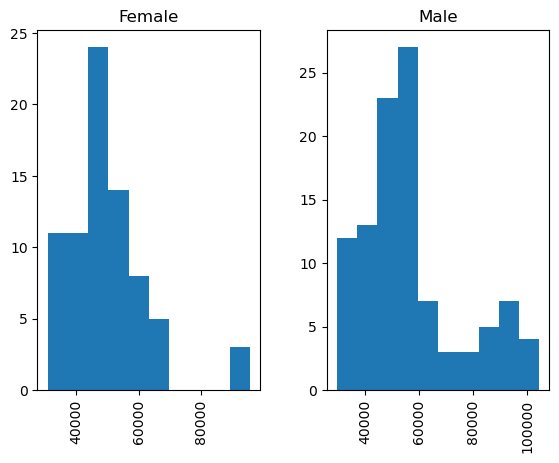

In [222]:
mydata.hist(by='Gender',column = 'Income');

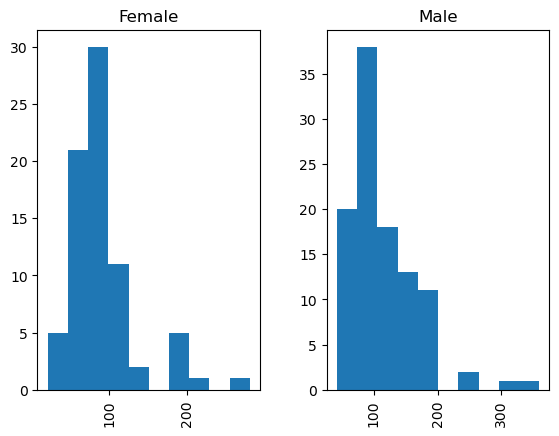

In [223]:
mydata.hist(by='Gender',column = 'Miles');

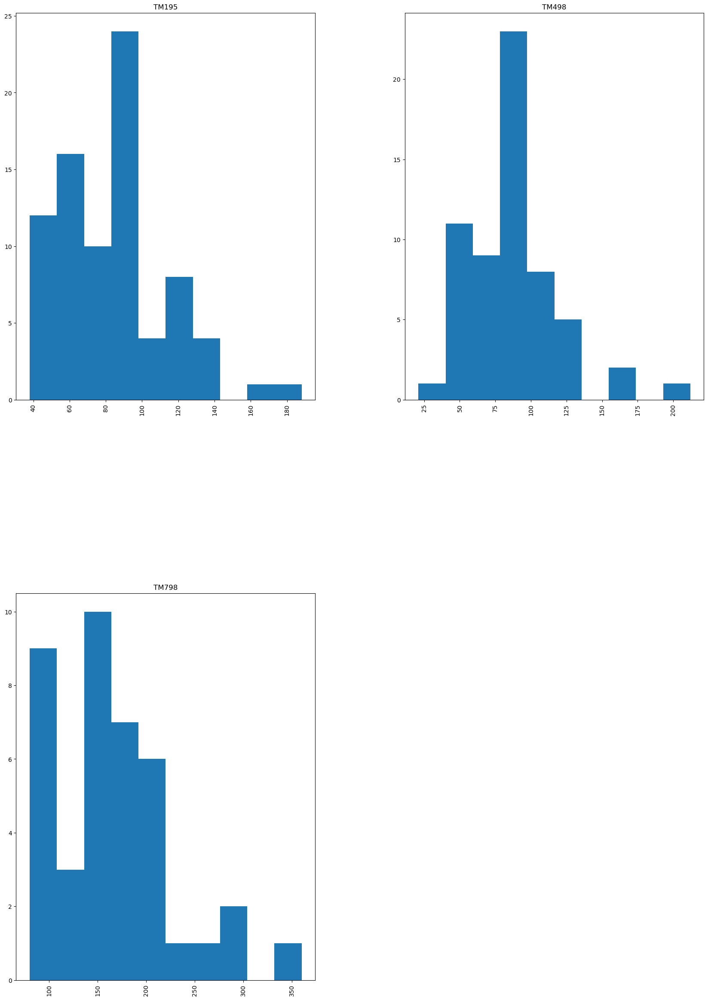

In [224]:
mydata.hist(by='Product',column = 'Miles', figsize=(20,30));

In [225]:
corr = mydata.corr()
corr

,Age,Education,Usage,Fitness,Income,Miles
Age,1.000000,0.280496,0.015064,0.061105,0.513414,0.036618
Education,0.280496,1.000000,0.395155,0.410581,0.625827,0.307284
Usage,0.015064,0.395155,1.000000,0.668606,0.519537,0.759130
Fitness,0.061105,0.410581,0.668606,1.000000,0.535005,0.785702
Income,0.513414,0.625827,0.519537,0.535005,1.000000,0.543473
Miles,0.036618,0.307284,0.759130,0.785702,0.543473,1.000000


In [226]:
cov = mydata.cov()
cov

,Age,Education,Usage,Fitness,Income,Miles
Age,48.212166,3.149410,0.113470,0.406828,5.884446e+04,13.186530
Education,3.149410,2.614867,0.693172,0.636623,1.670472e+04,25.770795
Usage,0.113470,0.693172,1.176785,0.695469,9.303043e+03,42.709808
Fitness,0.406828,0.636623,0.695469,0.919429,8.467925e+03,39.073246
Income,58844.463439,16704.717815,9303.042582,8467.925388,2.724706e+08,465265.361887
Miles,13.186530,25.770795,42.709808,39.073246,4.652654e+05,2689.833489


<AxesSubplot:>

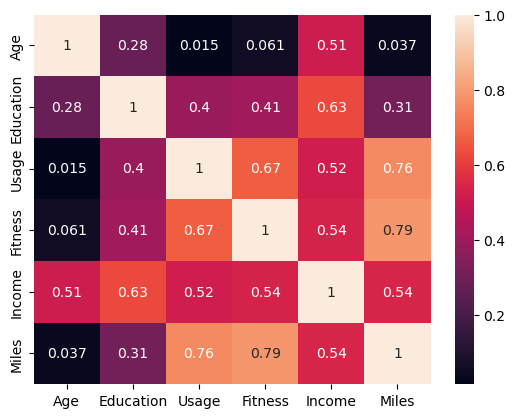

In [227]:
sns.heatmap(corr,annot=True)

In [228]:
# Simple Linear Regression


#Load function from sklearn
from sklearn import linear_model

# Create linear regression object
regr = linear_model.LinearRegression()

y = mydata['Miles']
x = mydata[['Usage','Fitness']]

# Train the model using the training sets
regr.fit(x,y)

LinearRegression()

In [229]:
regr.coef_

array([20.21486334, 27.20649954])

In [230]:
regr.intercept_

-56.74288178464862

In [231]:
# MilesPredicted = -56.74 + 20.21*Usage + 27.20*Fitness

In [232]:
regrn = linear_model.LinearRegression()
y = mydata['Miles']
x = mydata[['Usage','Fitness']]

regrn.fit(x,y)

LinearRegression()

In [233]:
regrn.coef_

array([20.21486334, 27.20649954])

In [234]:
regrn.intercept_

-56.74288178464862

In [2]:
ECom_Data=pd.read_csv(r"C:\Users\Nishu\OneDrive\Desktop\DSBA Program\data set\E-Commerce.csv")

In [3]:
ECom_Data.head()

,Customer_uniq_id,Region,Order_Date,Expected_Delivery_Date,Delivered_Date,product_name,product_main_category,product_subcategory,product_category_filter,product_category_subfilter,product_unique ID,retail_price,discounted_price,product_rating,Brand,product_specifications,description
0,e71017e224688489edfe856f2308806d,East,24-10-2021,25-10-2021,25-10-2021,Indcrown Net Embroidered Semi-stitched Lehenga...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEJX2NHNKCYHKA,999,699,4.0,INDCROWN,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Indcrown Net Embroidered Semi-...
1,6286847ee2da18f587503db49511c539,East,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8BEDTGGYY,499,275,1.0,SHOPMANIA,"{""product_specification""=>[{""key""=>""Ruling"", ""...",Specifications of Shopmania Music Band A5 Note...
2,0686fec9b70e5039583a38119ca0c835,West,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8KQFWDEGH,499,275,2.0,SHOPMANIA,"{""product_specification""=>[{""key""=>""Ruling"", ""...",Specifications of Shopmania Music Band A5 Note...
3,ea2406dc597bee2abb6b867fa668501f,West,24-10-2021,25-10-2021,25-10-2021,"Tiara Diaries 2016-2017 Designer LA Kaarta ""TA...",Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ8FGHZ3K86JU,1000,837,3.0,TIARA DIARIES,"{""product_specification""=>[{""key""=>""Ruling"", ""...",Specifications of Tiara Diaries 2016-2017 Desi...
4,5935ed077915347dc695744df68c565c,East,03-09-2021,04-09-2021,04-09-2021,KAJCI Embroidered Women's Waistcoat,Clothing,Women's Clothing,Formal Wear,Waistcoats,WSCEG2FYDYFDSVZ6,1200,699,5.0,KAJCI,"{""product_specification""=>[{""key""=>""Pattern"", ...",Specifications of KAJCI Embroidered Women's Wa...


In [4]:
ECom_Data.tail()

,Customer_uniq_id,Region,Order_Date,Expected_Delivery_Date,Delivered_Date,product_name,product_main_category,product_subcategory,product_category_filter,product_category_subfilter,product_unique ID,retail_price,discounted_price,product_rating,Brand,product_specifications,description
8901,90d30478255e23621e8929ed15c2f6e4,South,01-12-2020,04-12-2020,04-12-2020,Sinina Chanderi Embroidered Salwar Suit Dupatt...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEGGHHDFMY8BZU,2980,1490,3.0,SININA,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Sinina Chanderi Embroidered Sa...
8902,20a73e3f41490a73ceeba5f17658db8f,West,01-12-2020,04-12-2020,04-12-2020,Aarushi Fashion Chanderi Embroidered Salwar Su...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEG8GFDUWRSNU3,2600,1300,1.0,AARUSHI FASHION,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Aarushi Fashion Chanderi Embro...
8903,5c1554cd45f9d538c2c6947dbdd59c75,East,01-12-2020,04-12-2020,04-12-2020,"Ambika Lahenga Embroidered Lehenga, Choli and ...",Clothing,Women's Clothing,Ethnic Wear,Lehenga Cholis,LEHEGGEHYN4G2RPW,39992,24995,1.0,AMBIKA LAHENGA,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Ambika Lahenga Embroidered Leh...
8904,6b737a4deca1ed0e56c179e66036e994,West,01-12-2020,04-12-2020,04-12-2020,Sinina Chanderi Embroidered Salwar Suit Dupatt...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEGGHHGSVCHGFV,2000,1000,3.0,SININA,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Sinina Chanderi Embroidered Sa...
8905,a5235ac28d3d5487f54025f9d6b57433,North,01-12-2020,04-12-2020,04-12-2020,Aarushi Fashion Silk Striped Salwar Suit Dupat...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEG8GYDAABECZH,2800,1350,4.0,AARUSHI FASHION,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Key Features of Aarushi Fashion Silk Striped S...


In [5]:
ECom_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8906 entries, 0 to 8905
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Customer_uniq_id            8906 non-null   object 
 1   Region                      8906 non-null   object 
 2   Order_Date                  8906 non-null   object 
 3   Expected_Delivery_Date      8906 non-null   object 
 4   Delivered_Date              8906 non-null   object 
 5   product_name                8906 non-null   object 
 6   product_main_category       8906 non-null   object 
 7   product_subcategory         8906 non-null   object 
 8   product_category_filter     8906 non-null   object 
 9   product_category_subfilter  8906 non-null   object 
 10  product_unique ID           8906 non-null   object 
 11  retail_price                8906 non-null   int64  
 12  discounted_price            8906 non-null   int64  
 13  product_rating              8906 

In [8]:
ECom_Data.dtypes

Customer_uniq_id               object
Region                         object
Order_Date                     object
Expected_Delivery_Date         object
Delivered_Date                 object
product_name                   object
product_main_category          object
product_subcategory            object
product_category_filter        object
product_category_subfilter     object
product_unique ID              object
retail_price                    int64
discounted_price                int64
product_rating                float64
Brand                          object
product_specifications         object
description                    object
dtype: object

In [12]:
ECom_Data.drop(['product_specifications'], axis=1,inplace=True )

In [14]:
ECom_Data.drop(['description'], axis=1,inplace=True )

In [15]:
ECom_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8906 entries, 0 to 8905
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Customer_uniq_id            8906 non-null   object 
 1   Region                      8906 non-null   object 
 2   Order_Date                  8906 non-null   object 
 3   Expected_Delivery_Date      8906 non-null   object 
 4   Delivered_Date              8906 non-null   object 
 5   product_name                8906 non-null   object 
 6   product_main_category       8906 non-null   object 
 7   product_subcategory         8906 non-null   object 
 8   product_category_filter     8906 non-null   object 
 9   product_category_subfilter  8906 non-null   object 
 10  product_unique ID           8906 non-null   object 
 11  retail_price                8906 non-null   int64  
 12  discounted_price            8906 non-null   int64  
 13  product_rating              8906 

In [60]:
# How many unique Brand are there? (2 marks)
ECom_Data['Brand'].unique()
ECom_Data['Brand'].value_counts()

ALLURE AUTO       469
REGULAR           300
SLIM              267
THELOSTPUPPY      250
BLACK             147
                 ... 
WRITEFLO            1
JAZAM               1
RADIUS              1
I-STATIC            1
AMBIKA LAHENGA      1
Name: Brand, Length: 2484, dtype: int64

In [19]:
# Note that each Brand contains multiple products. Show the average product_rating within each Brand (2 marks)
round(ECom_Data.groupby(['Brand'])['product_rating'].mean(),2)

Brand
1OAK           1.50
3A AUTOCARE    3.27
3D MAT         3.00
3KFACTORY      2.00
4D             3.60
               ... 
ZORDEN         4.00
ZOSIGN         3.40
ZRESTHA        1.00
ZYXEL          3.33
 TARKAN        5.00
Name: product_rating, Length: 2484, dtype: float64

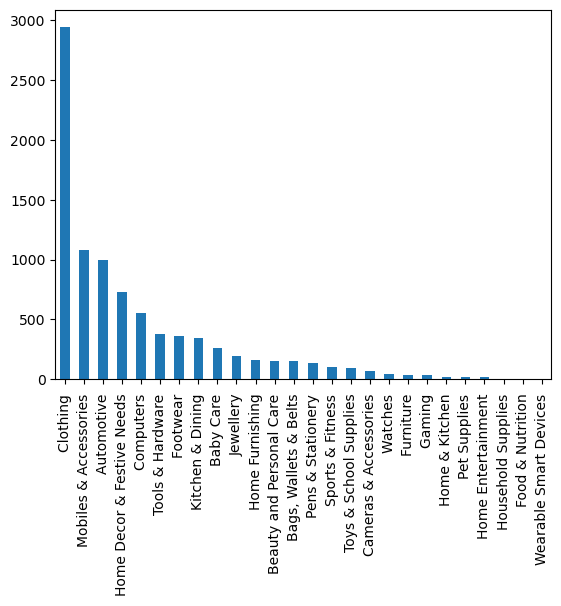

In [25]:
# Create an appropriate plot to show the count of items ordered for each product_main_category. (6 marks)
ECom_Data['product_main_category'].value_counts().plot(kind = 'bar');


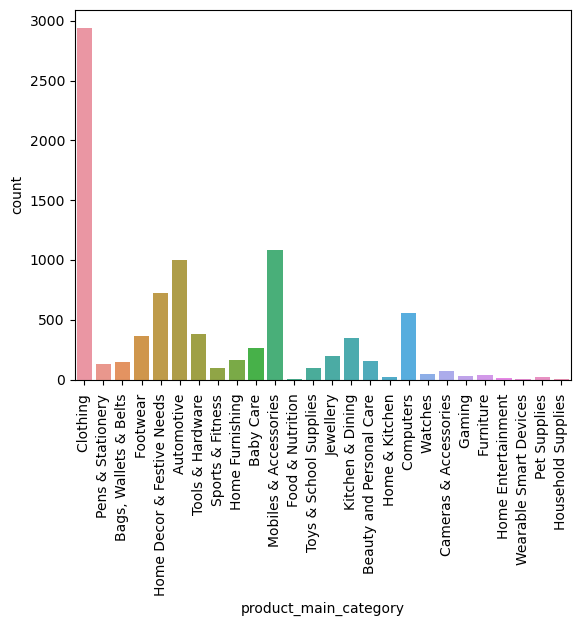

In [27]:
sns.countplot(data=ECom_Data, x = 'product_main_category');
plt.xticks(rotation =90);

In [35]:
#Write code to print out the top 5 product_main_category(s) in descending order? 
ECom_Data['product_main_category'].value_counts().head()

Clothing                       2943
Mobiles & Accessories          1084
Automotive                     1001
Home Decor & Festive Needs      727
Computers                       558
Name: product_main_category, dtype: int64

In E-commerce, both the retailers (here brands) and the company have to make profit to sustain in the business. The E-Commerce company has the following rule for computing their own revenue:

The company charges
(i) 25% on the orders having final price (discounted price) greater than 600

(ii) 15% on the orders having final price (discounted price) greater than 350 but less than or equal to 600

(iii) 10% on the orders having final price (discounted price) greater than 100 but less than or equal to 350

(iv) Otherwise, 5% on the final price (discounted price) </font>

Q 5. Find the Total Revenue generated by the E-Commerce company over all orders placed. (6 marks)
Hint: Calculate revenue of E-commerce company using the conditions mentioned above and then do the total (sum) of all to get total Revenue.

In [46]:
def compute_rev (x):
    if x >600:
        return x *0.25
    if x >350:
        return x * 0.15
    if x > 100:
        return x * 0.1
    else:
        return x * 0.05    
        

In [47]:
ECom_Data['Revenue'] = ECom_Data['discounted_price'].apply (compute_rev)

In [48]:
ECom_Data.head()

,Customer_uniq_id,Region,Order_Date,Expected_Delivery_Date,Delivered_Date,product_name,product_main_category,product_subcategory,product_category_filter,product_category_subfilter,product_unique ID,retail_price,discounted_price,product_rating,Brand,Revenue
0,e71017e224688489edfe856f2308806d,East,24-10-2021,25-10-2021,25-10-2021,Indcrown Net Embroidered Semi-stitched Lehenga...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEJX2NHNKCYHKA,999,699,4.0,INDCROWN,174.75
1,6286847ee2da18f587503db49511c539,East,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8BEDTGGYY,499,275,1.0,SHOPMANIA,27.50
2,0686fec9b70e5039583a38119ca0c835,West,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8KQFWDEGH,499,275,2.0,SHOPMANIA,27.50
3,ea2406dc597bee2abb6b867fa668501f,West,24-10-2021,25-10-2021,25-10-2021,"Tiara Diaries 2016-2017 Designer LA Kaarta ""TA...",Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ8FGHZ3K86JU,1000,837,3.0,TIARA DIARIES,209.25
4,5935ed077915347dc695744df68c565c,East,03-09-2021,04-09-2021,04-09-2021,KAJCI Embroidered Women's Waistcoat,Clothing,Women's Clothing,Formal Wear,Waistcoats,WSCEG2FYDYFDSVZ6,1200,699,5.0,KAJCI,174.75


In [61]:
ECom_Data['Revenue'].sum()

2217486.85

Q6.Calculate the total BrandRevenue and list the top 10 Brand having maximum revenue in descending order (6 marks)

Hint: Total BrandRevenue is BrandRevenue which is generated after all the deductions. Also, BrandRevenue is different from the E-Commerce company's revenue.

Brand Revenue is the discounted price minus the Revenue (generated using the conditions given above Q5)

In [50]:
ECom_Data['Brand_Revenue'] = ECom_Data['discounted_price'] - ECom_Data ['Revenue']

In [51]:
ECom_Data.head()

,Customer_uniq_id,Region,Order_Date,Expected_Delivery_Date,Delivered_Date,product_name,product_main_category,product_subcategory,product_category_filter,product_category_subfilter,product_unique ID,retail_price,discounted_price,product_rating,Brand,Revenue,Brand_Revenue
0,e71017e224688489edfe856f2308806d,East,24-10-2021,25-10-2021,25-10-2021,Indcrown Net Embroidered Semi-stitched Lehenga...,Clothing,Women's Clothing,Ethnic Wear,Fabric,FABEJX2NHNKCYHKA,999,699,4.0,INDCROWN,174.75,524.25
1,6286847ee2da18f587503db49511c539,East,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8BEDTGGYY,499,275,1.0,SHOPMANIA,27.50,247.50
2,0686fec9b70e5039583a38119ca0c835,West,24-10-2021,25-10-2021,25-10-2021,Shopmania Music Band A5 Notebook Spiral Bound,Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ6Z8KQFWDEGH,499,275,2.0,SHOPMANIA,27.50,247.50
3,ea2406dc597bee2abb6b867fa668501f,West,24-10-2021,25-10-2021,25-10-2021,"Tiara Diaries 2016-2017 Designer LA Kaarta ""TA...",Pens & Stationery,Diaries & Notebooks,Notebooks,Designer,DIAEJ8FGHZ3K86JU,1000,837,3.0,TIARA DIARIES,209.25,627.75
4,5935ed077915347dc695744df68c565c,East,03-09-2021,04-09-2021,04-09-2021,KAJCI Embroidered Women's Waistcoat,Clothing,Women's Clothing,Formal Wear,Waistcoats,WSCEG2FYDYFDSVZ6,1200,699,5.0,KAJCI,174.75,524.25


In [59]:
ECom_Data.groupby(['Brand'])['Brand_Revenue'].sum().sort_values(ascending=False).head(10)

Brand
ALLURE AUTO     498464.25
GAGA            237390.00
SLIM            212062.60
DAILYOBJECTS    181980.00
DIVINITI        143115.00
THELOSTPUPPY    127287.50
REGULAR         126536.50
ENTHOPIA        123146.25
ASUS             99241.50
SPRINGWEL        88978.50
Name: Brand_Revenue, dtype: float64

Q 8. Create a new dataframe to include the Brand specific information as stated:

i. total number of orders placed per Brand

ii. total retail_price per Brand

iii. total discounted_price per Brand, and

iv. total BrandRevenue generated per Brand.

Also, draw a pairplot using these four features.

In [62]:
#Total number of orders placed per brand
NoOfOrders=ECom_Data['Brand'].value_counts()
NoOfOrders

ALLURE AUTO       469
REGULAR           300
SLIM              267
THELOSTPUPPY      250
BLACK             147
                 ... 
WRITEFLO            1
JAZAM               1
RADIUS              1
I-STATIC            1
AMBIKA LAHENGA      1
Name: Brand, Length: 2484, dtype: int64

In [67]:
retailpriceperBrandwise = ECom_Data.groupby(['Brand'])['retail_price'].sum()
retailpriceperBrandwise

Brand
1OAK             1698
3A AUTOCARE    107059
3D MAT           7250
3KFACTORY         399
4D              17500
                ...  
ZORDEN           3999
ZOSIGN           6995
ZRESTHA          1999
ZYXEL           64742
 TARKAN          1999
Name: retail_price, Length: 2484, dtype: int64

In [71]:
# total discount_price per brand
discountPriceBrandWise= ECom_Data.groupby(['Brand'])['discounted_price'].sum()
discountPriceBrandWise

Brand
1OAK            1274
3A AUTOCARE    74134
3D MAT          6999
3KFACTORY        174
4D              7948
               ...  
ZORDEN          2799
ZOSIGN          6995
ZRESTHA          899
ZYXEL          35392
 TARKAN          349
Name: discounted_price, Length: 2484, dtype: int64

In [73]:
#total BrandRevenue generated per brand. 
totalBrandRevenue = ECom_Data.groupby(['Brand'])['Revenue'].sum().sort_values(ascending = False)
totalBrandRevenue

Brand
ALLURE AUTO          166154.75
GAGA                  79130.00
DAILYOBJECTS          60660.00
SLIM                  60114.40
DIVINITI              47705.00
                       ...    
DR. THAPAR'S             12.00
LAADLI BOUITIQUE         11.00
LAADLI BOUTIQUE          11.00
DIGITAL MARKETING        11.00
OBS                      11.00
Name: Revenue, Length: 2484, dtype: float64

In [75]:
DF_New = pd.DataFrame(columns=['NoOfOrders','retailpriceperBrandwise','discountPriceBrandWise','totalBrandRevenue'])
DF_New

,NoOfOrders,retailpriceperBrandwise,discountPriceBrandWise,totalBrandRevenue


In [78]:
DF_New['retailpriceperBrandwise']=retailpriceperBrandwise
DF_New['NoOfOrders']=NoOfOrders
DF_New['discountPriceBrandWise']=discountPriceBrandWise
DF_New['totalBrandRevenue']=totalBrandRevenue
DF_New

,NoOfOrders,retailpriceperBrandwise,discountPriceBrandWise,totalBrandRevenue
Brand,,,,
1OAK,2,1698,1274,258.60
3A AUTOCARE,41,107059,74134,18486.10
3D MAT,1,7250,6999,1749.75
3KFACTORY,1,399,174,17.40
4D,5,17500,7948,1987.00
...,...,...,...,...
ZORDEN,1,3999,2799,699.75
ZOSIGN,5,6995,6995,1748.75
ZRESTHA,1,1999,899,224.75


<Figure size 1600x1000 with 0 Axes>

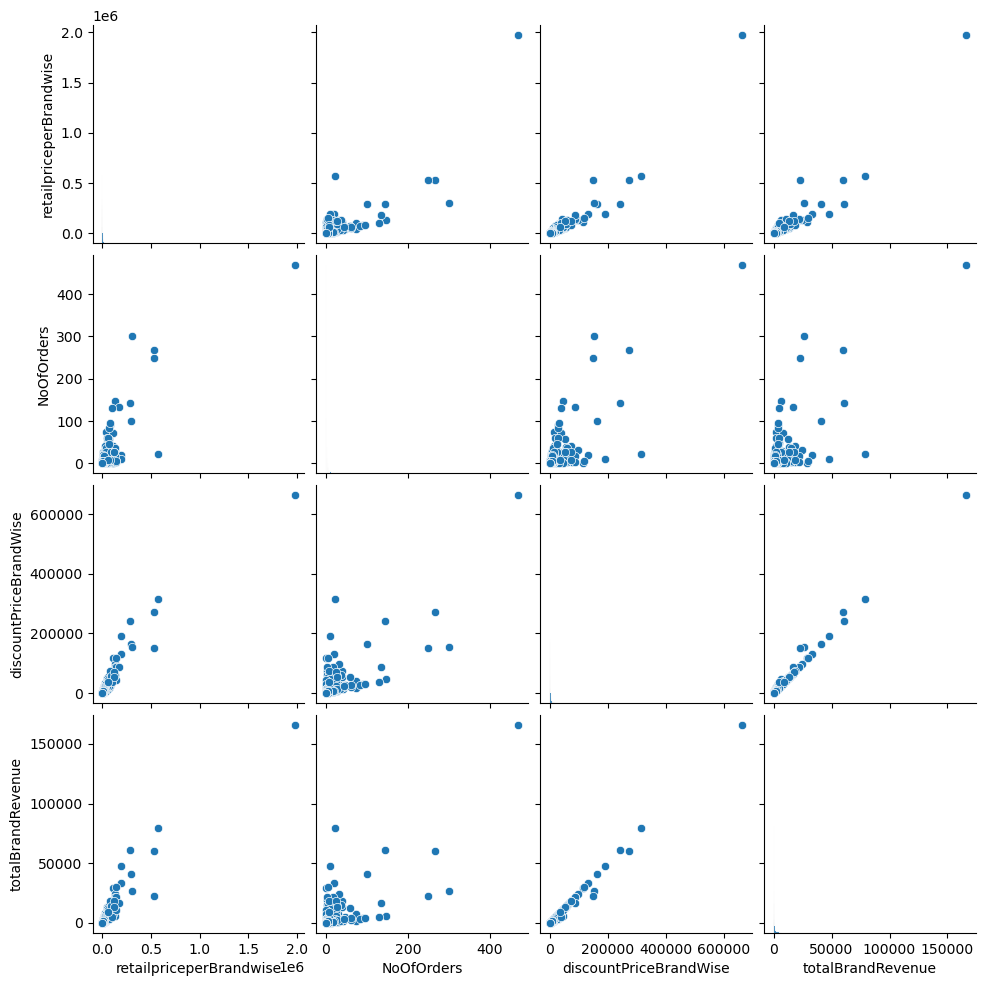

In [80]:
plt.figure(figsize=(16,10))
sns.pairplot(data=DF_New[['retailpriceperBrandwise','NoOfOrders','discountPriceBrandWise','totalBrandRevenue']])

Q 9.Compare performance regionwise
a) Draw a lineplot for the monthly Revenue of E-Commerce Company for each region in single plot. (4 marks)

b) Identify the best and the worst performing months for each region. (2 marks)

Note: Only those days with actual orders(Order_Date) placed are present in the dataset. Assuming there were no orders on other days. Also, show Month and Year on x-axis.

Ans 9 a)

In [81]:
ECom_data_Add = pd.DataFrame()
ECom_Data['Order_Date'] = pd.to_datetime(ECom_Data.Order_Date, format='%d-%m-%Y')
ECom_data_Add['Order_Month']=ECom_Data['Order_Date'].dt.strftime("%Y %m")
ECom_data_Add['Region']=ECom_Data['Region'].copy()
ECom_data_Add['Revenue']=ECom_Data['Revenue'].copy()
ECom_data_Add_New=pd.DataFrame(ECom_data_Add.groupby(['Region','Order_Month'])['Revenue'].sum())
ECom_data_Add_New

Revenue
Region Order_Month           
East   2020 12      363413.85
       2021 01      218740.60
       2021 02       14347.25
       2021 03      124934.10
       2021 04       56293.05
       2021 05       24230.50
       2021 06       54231.60
       2021 07         351.35
       2021 08         824.75
       2021 09         680.15
       2021 10         202.25
North  2020 12      195149.95
       2021 01       96015.10
       2021 02        7137.35
       2021 03       40733.95
       2021 04       29758.35
       2021 05       13106.50
       2021 06       29552.35
       2021 07         306.00
       2021 08         374.75
South  2020 12       95088.25
       2021 01       52815.80
       2021 02        4670.85
       2021 03       61932.15
       2021 04       18550.10
       2021 05        3708.75
       2021 06       19550.75
West   2020 12      302971.95
       2021 01      145593.75
       2021 02       15020.90
       2021 03      119632.50
       2021 04       46845.20
       2021 05       18631.85
       2021 06       40579.80
       2021 07         537.00
       2021 08         736.75
       2021 10         236.75

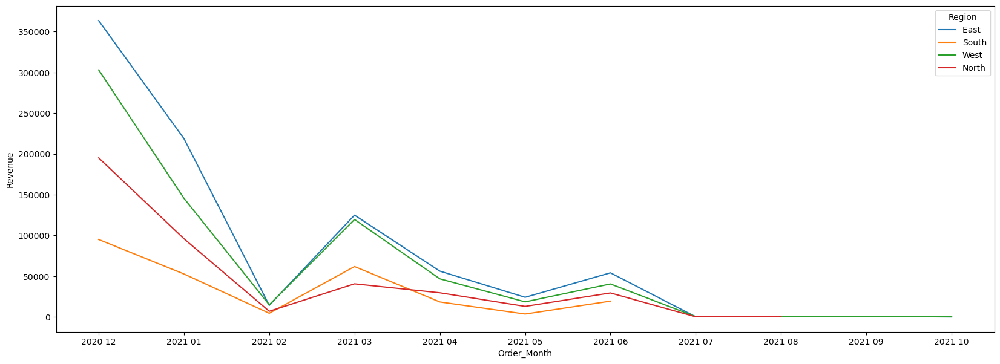

In [82]:
plt.figure(figsize = (20,7))
#plt.xticks(np.arange(0, len('months')+7, 1))
#plt.xlim(1, 12)
ECom_data_Add_New.sort_values(by='Order_Month', ascending=True, inplace=True)
plt.xticks(np.arange(0,14,1))
sns.lineplot(data=ECom_data_Add_New,x = 'Order_Month' , y = 'Revenue', ci = False ,hue='Region');
plt.show()

In [2]:
sat = pd.read_csv(r'Downloads/sat_score.csv')

In [3]:
sat.head()

,student_id,score
0,1,1018
1,2,1218
2,3,611
3,4,723
4,5,541


Caculating the mean and Standarded deivation (parameters) for the SAT score

In [5]:
#import the required function
from scipy.stats import norm

# estimate the mean and the standard deivation of the SAT scores data
mu= sat['score'].mean()
sigma = sat['score'].std()
print("The estimated mean is", round(mu, 2))
print("The estimated Standard deviation is ", round (sigma,2))


The estimated mean is 1007.46
The estimated Standard deviation is  204.43


# Plotting the Distribution

It helps to analyze the shape of the data and visiualise the PDF of normal distribution using the parameters (mean (mu) and standard deivation (sigma) from the data)

In [6]:
# Calculate the pdf (probablity density function) of the SAT score using norm.pdf
density = pd.DataFrame()
density ['x'] = np.linspace (
        sat['score'].min() - 0.01 , sat['score'].max() +0.01 ,100)

In [8]:
density ['pdf'] = norm.pdf(density['x'],mu,sigma)

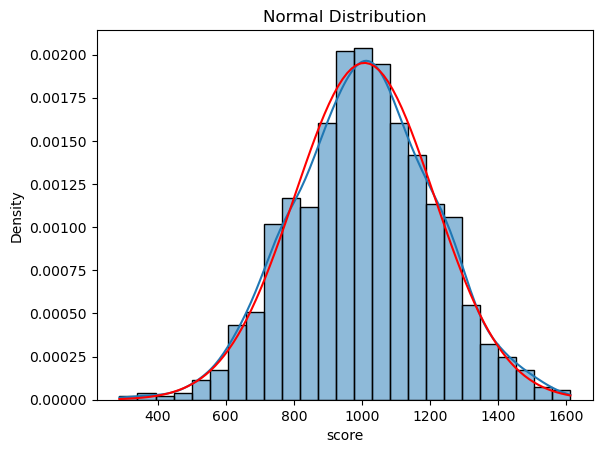

In [10]:
fig, ax =plt.subplots()
# plot the distribution of data using the histogram 
sns.histplot(sat['score'], ax=ax , kde=True , stat='density')
# Plot the pdf using the normal distribution
ax.plot(density['x'], density['pdf'], color = 'red')
plt.title ("Normal Distribution")
plt.show()

Insight : As you can see in the above plot , there are 2 curves  red and blue. blue represents the shape of the data distibution and the red curver representsthe PDF (Probablity density function). This data is approximately normal. Thus we can assume data distribution to be normal and perform our calculation based on normality assumptions.

# calculate the probablity that the student will score less than 800 in the SAT exam.


In [13]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality

prob_less_than_800 = norm.cdf(800,mu,sigma)
print (
      " The probability that a student will score less then 800 is",
       round(prob_less_than_800, 4),
)

 The probability that a student will score less then 800 is 0.1551


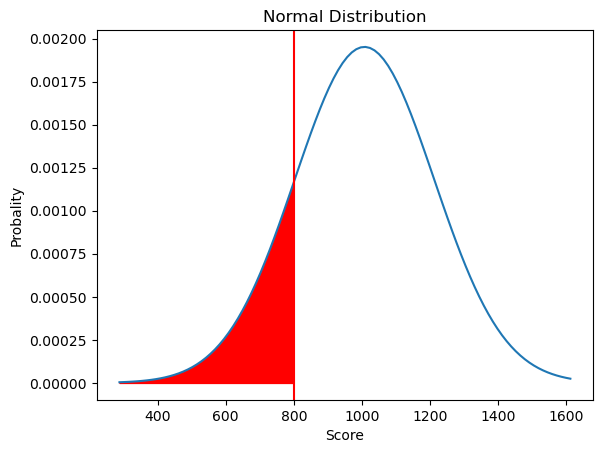

In [16]:
# Plot the probability distribution function
# we are plotting distributions here to better visualise the calculations.
plt.plot(density['x'] , density ['pdf'])
plt.axvline(x = 800 , c ='r')
x1 = np.linspace(density['x'].min(),800,50)
plt.fill_between(x1, norm.pdf(x1, mu,sigma),color='r')
plt.xlabel("Score")
plt.ylabel("Probality")
plt.title("Normal Distribution")
plt.show()

In [20]:
# calculate the probality that a student will score more then 1300 in SAT exam
prob_greater_then_1300 = 1 - norm.cdf(1300,mu,sigma)
print ("Probality that a student will score greater then 1300 is ",round(prob_greater_then_1300,4))

Probality that a student will score greater then 1300 is  0.0762


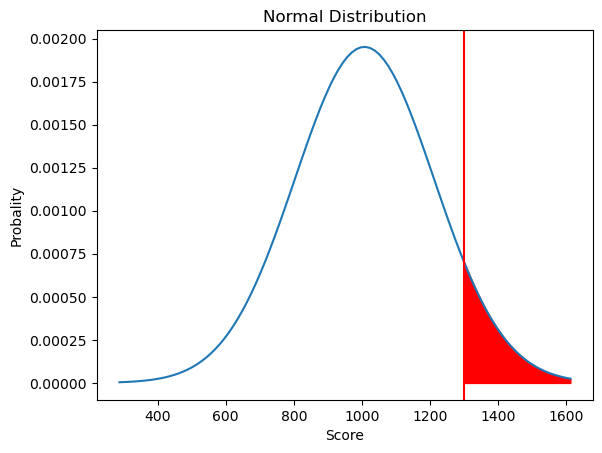

In [22]:
plt.plot(density['x'] , density ['pdf'])
plt.axvline(x = 1300, c ='r')
x1 = np.linspace(density['x'].max(),1300,50)
plt.fill_between(x1, norm.pdf(x1, mu,sigma),color='r')
plt.xlabel("Score")
plt.ylabel("Probality")
plt.title("Normal Distribution")
plt.show()

# Calculate the minimum marks a student must score in order to be in the 90th percentile

In [25]:
# Calculate the 90th percentile score using ppf() function
# norm.ppf calculates the percentile point
score_90th_percentile = norm.ppf(0.90 , mu , sigma)
print("The 90th Percentile score should be ", round(score_90th_percentile))

The 90th Percentile score should be  1269


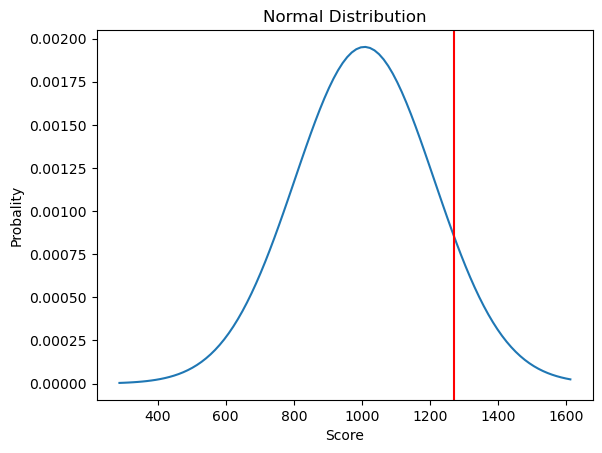

In [28]:
plt.plot(density['x'] , density ['pdf'])
plt.axvline(x = score_90th_percentile, c ='r')
plt.xlabel("Score")
plt.ylabel("Probality")
plt.title("Normal Distribution")
plt.show()

In [32]:
#Calculatee the probablity to scope top 5%
Score_Top_five_percent = norm.ppf(0.95, mu , sigma)
round(Score_Top_five_percent,2)

1343.71

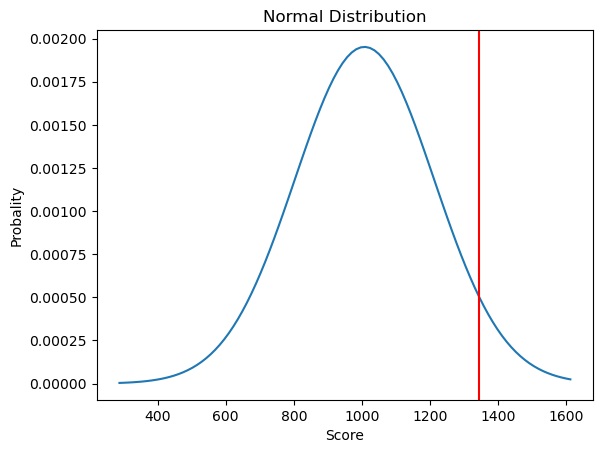

In [33]:
plt.plot(density['x'] , density ['pdf'])
plt.axvline(x = Score_Top_five_percent, c ='r')
plt.xlabel("Score")
plt.ylabel("Probality")
plt.title("Normal Distribution")
plt.show()

# Standardisation of Normal variables

Suppose we know that the SAT scores we normally distributed with mean 1000 and standard deviation 200 and ACT scores are normally distributed with mean 20 and standard deivation of 5

A college provides admission only on the basis of SAT and AC scores. The college admin decides to give the top performer fellowship to the student who has performed best among all the candidates. The highest score recieved from applicants who appeared for SAT is 1350 and the highest score recieved from applicants who appeared for ACT is 30

help the college choose the best fellowship

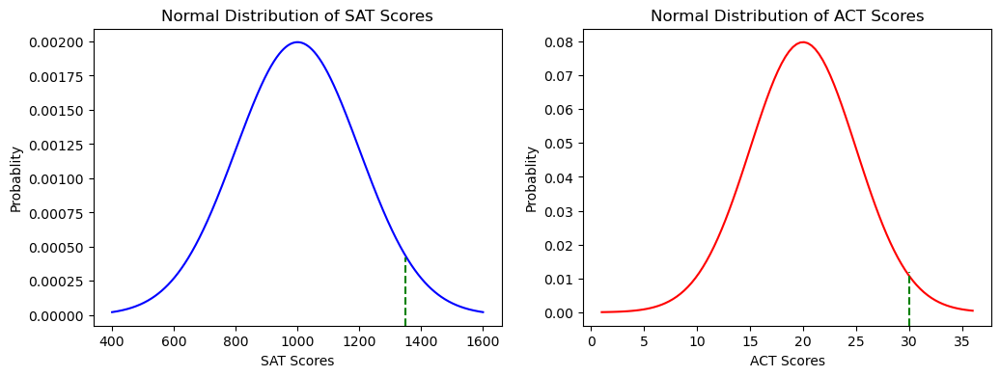

In [39]:
# plot the 2 distribution for SAT and ACT score
# we are plotting the distribution here to better visualize the calculations.
from scipy.stats import norm
fig, (ax1 , ax2) = plt.subplots(1,2 , figsize = (12,4))
x = np.linspace(400,1600,1000)
ax1.plot(x , norm.pdf(x , loc = 1000 , scale = 200 ),color ='b')
ax1.set_title('Normal Distribution of SAT Scores')
ax1.set_xlabel('SAT Scores')
ax1.set_ylabel('Probablity')
ax1.axvline(1350 , ymax=0.23 , linestyle = '--',color ='green')
x1 = np.linspace(1,36,100)
ax2.plot(x1 , norm.pdf(x1, loc = 20, scale = 5), color = 'r')
ax2.set_title('Normal Distribution of ACT Scores')
ax2.set_xlabel('ACT Scores')
ax2.set_ylabel('Probablity')
ax2.axvline(30 , ymax =0.18 , linestyle = '--', color = 'green')
plt.show()

In [40]:
# find the z score of highest scorer in SAT among all applicants
top_sat = (1350-1000)/200
print (top_sat)
# find the zscore of highest scorrer ACT among all the applicants
top_act = (30-20)/5
print (top_act)

1.75
2.0


lets plot the Standard normal distribution and visualize  the above standard scores

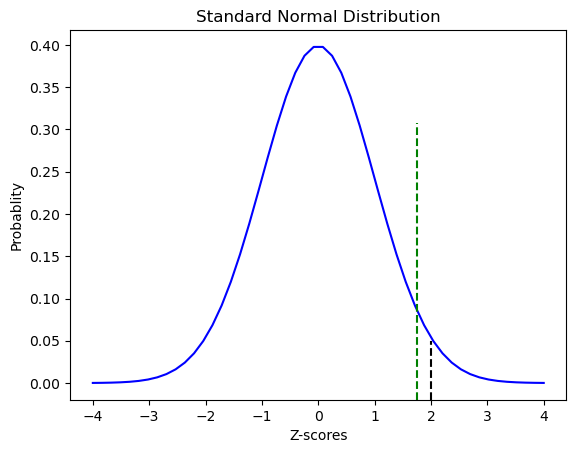

In [42]:
fig , ax = plt.subplots()
x = np.linspace(-4,4,50)
ax.plot(x, norm.pdf(x,loc = 0, scale =1),color = 'b')
ax.set_title('Standard Normal Distribution')
ax.set_xlabel('Z-scores')
ax.set_ylabel('Probablity')
ax.axvline(top_sat , ymax=0.75, linestyle='--',color ='green')
ax.axvline(top_act , ymax=0.16, linestyle='--',color ='black')
plt.show()

In [44]:
mun= 505
sigman = 115

In [48]:
prob_greater_then_590 = norm.cdf(590,mun,sigman)
prob_greater_then_590

0.770086101201602

In [49]:
prob_greater_then_400 = norm.cdf(400,mun,sigman)
prob_greater_then_400

0.18060983760704197

In [50]:
munn= 0.295
sigmann = 0.025

In [52]:
prob_greater_then = norm.cdf(0.26,munn,sigmann)
prob_greater_then

0.08075665923377118

In [27]:
uniform.cdfb(93, loc=90, scale=11)

0.2727272727272727

The intuitive approach is, to sum up, the probability of buying 90, 91, and 92 books. As the probability of each is 1/11, the cdf will be

How unifrom.cdf() works for discrete uniform distribution
1. To calculate continuous uniform distribution using uniform.cdf(), we included the x value to calculate the probability to the right i.e. 96  (96, loc=90, scale=11). But for the discrete uniform distribution, we took a step further to calculate the probability to the right i.e. 96 (93, loc=90, scale=11). What is the reason for doing so?

The cdf() function behaves differently for a continuous distribution and a discrete distribution. In the case of a continuous distribution, the cdf is a strictly monotonic increasing continuous function; whereas the cdf of a discrete distribution is a step function. Here, we are using the continuous uniform distribution to approximate the discrete uniform distribution. 

The question asks to find the probability that less than or equal to 92 books (refer to the problem statement) will be sold on a given day. Given that we are using the continuous uniform distribution, we will try to find the area under the uniform curve that is below 93. The correct code to find the same is

# Central Limit Theorem (CLT)

Central Limit Theorem states that if we independently draw multiple samples from a population, take the mean of each sample and plot these (sample means), then the plot will tend to normal distribution as the size of samples increases, **regardless** of the shape of the population distribution.

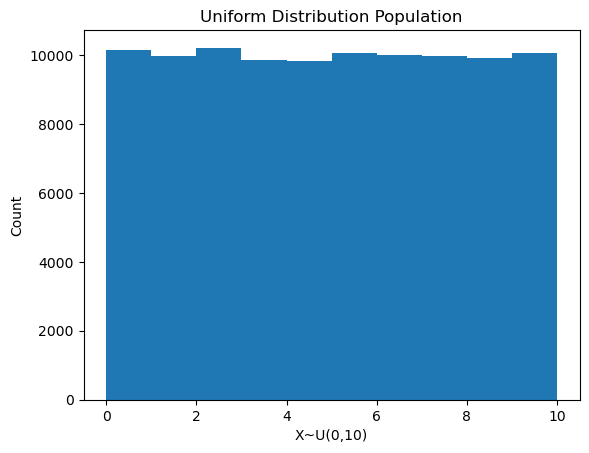

In [2]:
# import the required function
from scipy.stats import uniform

#setting the seed for reproductiblity
np.random.seed(1)
# Create a uniform distribution population of size 100000
uniform_pop = uniform.rvs(0,10 , size = 100000)
# visiualing the uniform distribution
plt.hist(uniform_pop)
plt.title("Uniform Distribution Population")
plt.xlabel("X~U(0,10)")
plt.ylabel("Count")
plt.show()


In [7]:
print(uniform_pop)

[4.17022005e+00 7.20324493e+00 1.14374817e-03 ... 8.18045836e+00
 5.67853567e+00 6.13057425e+00]


Let's create a sampling distribution from this population (sample size=5, number of samples = 500)
draw a sample of size 5, so n=5, we draw 5 independent observations
get the mean of these 5 observations, i.e - sample mean
repeat the above 2 steps 500 times, so that we get 500 sample means, where n=5
Now, let's observe the shape of this sampling distribution.

<function matplotlib.pyplot.show(close=None, block=None)>

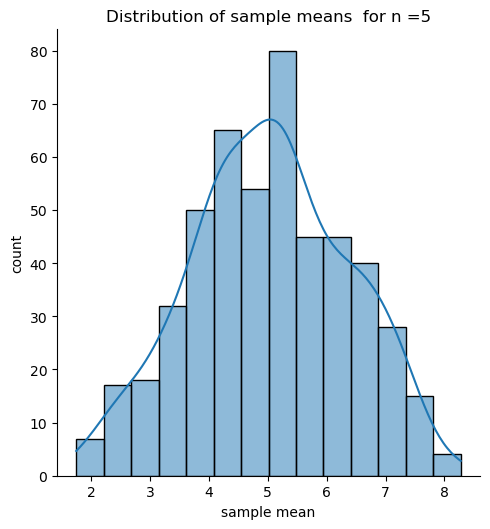

In [8]:
# set the seed for reproductiblity 
np.random.seed(1)
# set the sample size to 5
n= 5
#List to store sample means
sample_means =[]
# iterate the loop to draw multiple samples
for j in range (500):
    # draw a sample of size n
    sample = np.random.choice(uniform_pop , size =n)
    # calculate sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample_means
sns.displot(sample_means , kde = True)
plt.title("Distribution of sample means  for n =" + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show

lets create another sampling distribution from this population increase the sample size to 15 (n=15)

<function matplotlib.pyplot.show(close=None, block=None)>

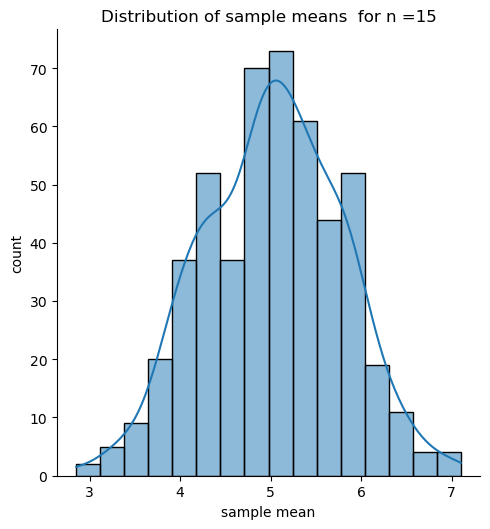

In [10]:
# set the seed for reproductiblity 
np.random.seed(1)
# set the sample size to 15
n= 15
#List to store sample means
sample_means =[]
# iterate the loop to draw multiple samples
for j in range (500):
    # draw a sample of size n
    sample = np.random.choice(uniform_pop , size =n)
    # calculate sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample_means
sns.displot(sample_means , kde = True)
plt.title("Distribution of sample means  for n =" + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

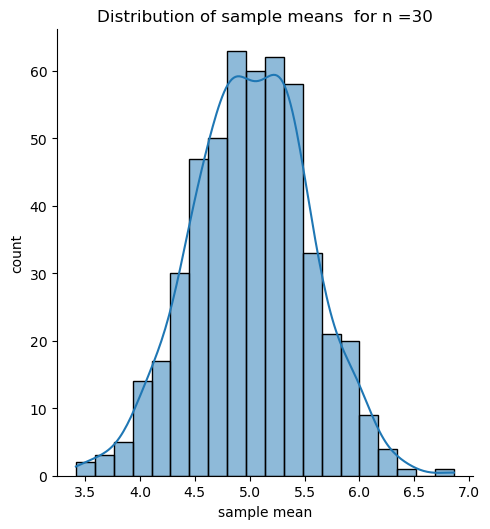

In [11]:
# set the seed for reproductiblity 
np.random.seed(1)
# set the sample size to 30
n= 30
#List to store sample means
sample_means =[]
# iterate the loop to draw multiple samples
for j in range (500):
    # draw a sample of size n
    sample = np.random.choice(uniform_pop , size =n)
    # calculate sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample_means
sns.displot(sample_means , kde = True)
plt.title("Distribution of sample means  for n =" + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show

Increase the sample size to 50

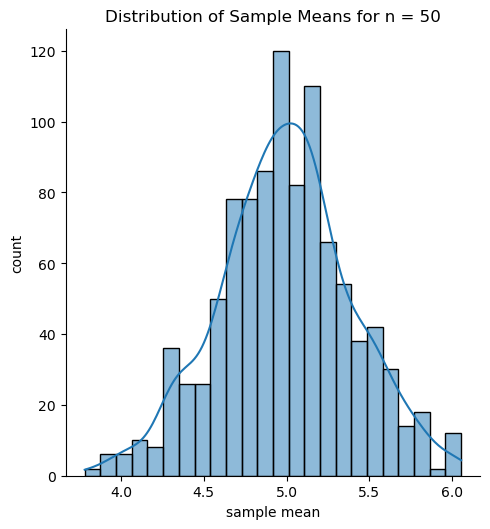

In [14]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 50
n = 50
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(uniform_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

Insight
Observe how the sampling distribution moves closer to normality as the sample size increases.

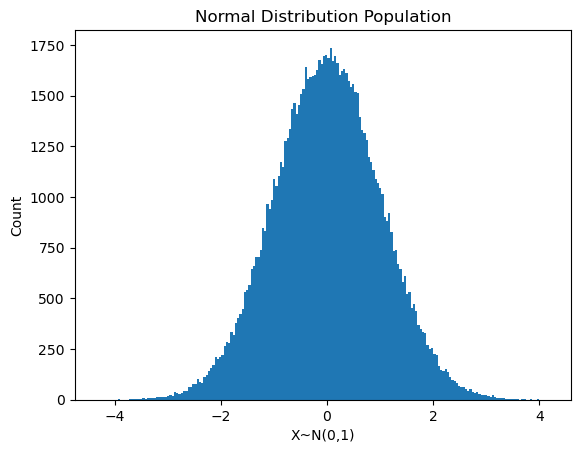

In [15]:
# import the required function
from scipy.stats import norm

# set the seed for reproducibility
np.random.seed(1)
# create a normal distribution population of size 100000
normal_pop = norm.rvs(0, 1, size=100000)
# visualize the normal distribution
plt.hist(normal_pop, 200)
plt.title("Normal Distribution Population")
plt.xlabel("X~N(0,1)")
plt.ylabel("Count")
plt.show()

### Let's create a sampling distribution from this population (sample size=5, number of samples = 500)
draw a sample of size 5, so n=5, we draw 5 independent observations
get the mean of these 5 observations, i.e - sample mean
repeat the above 2 steps 500 times, so that we get 500 sample means, where n=5
Now, let's observe the shape of this sampling distribution.

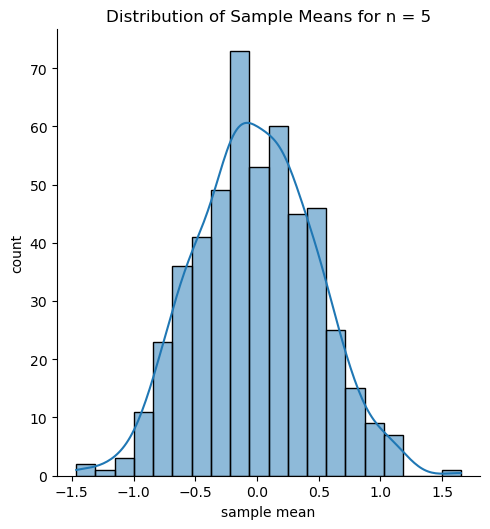

In [16]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 5
n = 5
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
  # draw a sample of size n
  sample = np.random.choice(normal_pop, size = n)
  # calculate the sample mean
  sample_mean = np.mean(sample)
  # append the sample mean to the sample_means list
  sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde = True)
plt.title('Distribution of Sample Means for n = ' + str(n))
plt.xlabel('sample mean')
plt.ylabel('count')
plt.show()

Insight
When the population distribution is Normal, sampling distribution is close to normal for even the smaller sampling sizes like n = 5

### Let's check sampling distribution for sample size n = 15

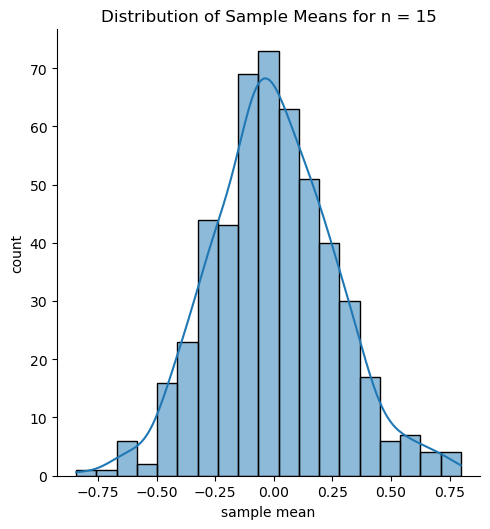

In [17]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 15
n = 15
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(normal_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

### Sampling Distribution when Sample Size n = 30

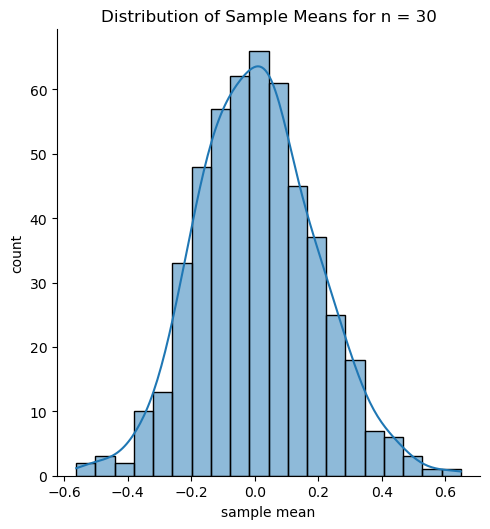

In [18]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 30
n = 30
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(normal_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

### Let's see if CLT works if the population distribution is Exponential Distribution (which again is clearly not Normal)

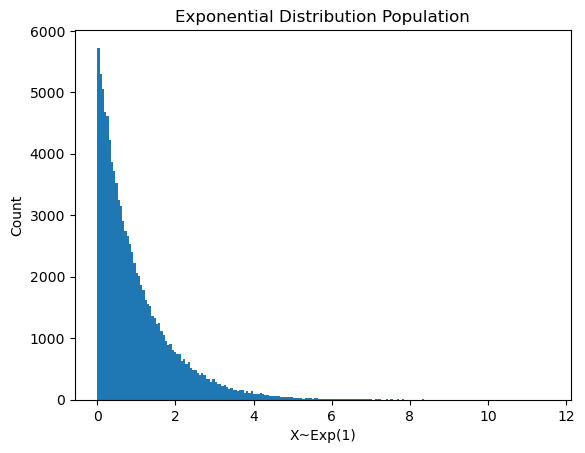

In [19]:
# import the required function
from scipy.stats import expon

# set the seed for reproducibility
np.random.seed(1)
# create a exponential distribution population of size 100000
exp_pop = expon.rvs(size=100000)
# visualize the exponential distribution
plt.hist(exp_pop, 200)
plt.title("Exponential Distribution Population")
plt.xlabel("X~Exp(1)")
plt.ylabel("Count")
plt.show()

### Sampling Distribution for Sample Size n = 5

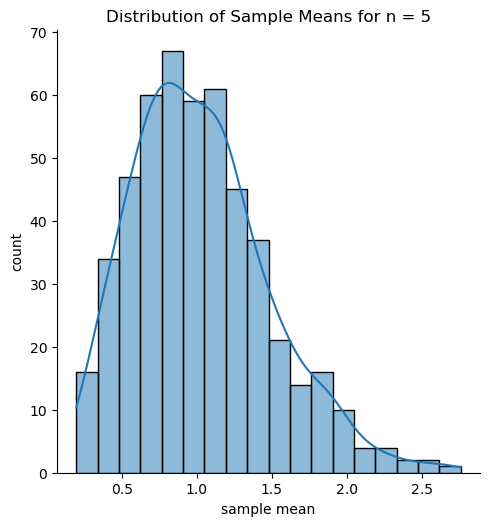

In [20]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 5
n = 5
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
  # draw a sample of size n
  sample = np.random.choice(exp_pop, size = n)
  # calculate the sample mean
  sample_mean = np.mean(sample)
  # append the sample mean to the sample_means list
  sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde = True)
plt.title('Distribution of Sample Means for n = ' + str(n))
plt.xlabel('sample mean')
plt.ylabel('count')
plt.show()

### Sampling Distribution for Sample Size n = 15

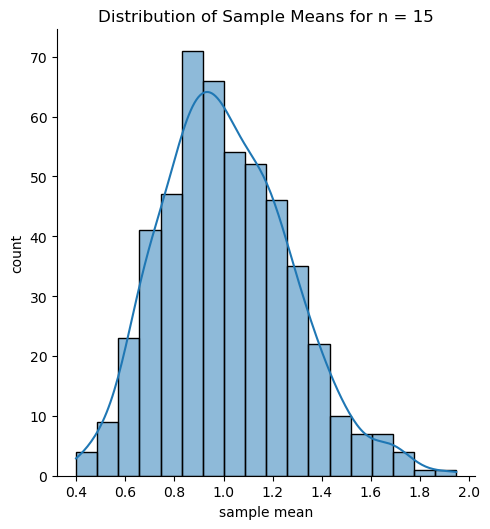

In [21]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 15
n = 15
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(exp_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

### Sampling Distribution for Sample Size n = 30

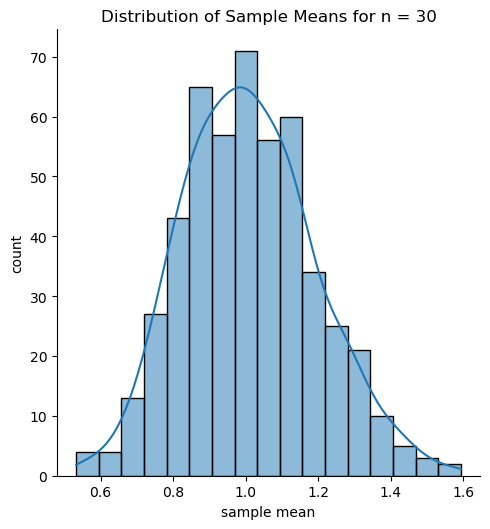

In [23]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 30
n = 30
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(exp_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

### Sampling Distribution for Sample Size n = 50

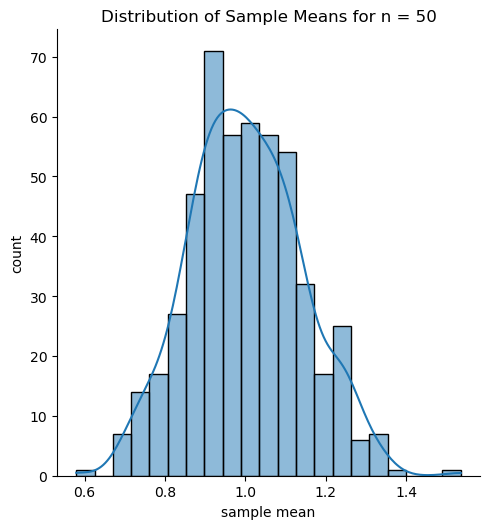

In [25]:
# set the seed for reproducibility
np.random.seed(1)
# set the sample size to 50
n = 50
# list to store sample means
sample_means = []
# iterate the loop to draw multiple samples
for j in range(500):
    # draw a sample of size n
    sample = np.random.choice(exp_pop, size=n)
    # calculate the sample mean
    sample_mean = np.mean(sample)
    # append the sample mean to the sample_means list
    sample_means.append(sample_mean)
# plot the histogram of sample means
sns.displot(sample_means, kde=True)
plt.title("Distribution of Sample Means for n = " + str(n))
plt.xlabel("sample mean")
plt.ylabel("count")
plt.show()

### Key Takeaway

We have tried different distributions to simulate the fundamental idea of CLT. We can see that no matter what the shape of the population distribution is, the plot of samples means approximately tends to normal distribution as sample size increases.

# Point Estimation

Let's see how population mean is estimated by the sample mean
A non-profit organization sampled the files of the local forest department to come up with the following amounts (in thousands of dollars) of damages for 10 wildfire incidents:

120, 55, 60, 10, 8, 150, 44, 58, 62, 123

What is the estimate of the average amount of damage in wildfires, in that area?

In [31]:
# to get the sample data
sample = np.array([120, 55, 60, 10, 8, 150, 44, 58, 62, 123])

# to find the mean of the sample
x_bar = np.mean(sample)
x_bar

69.0

Insight :- The estimate of the average amount of damages in wildfires in that area is $69000.

Usually, point estimate of an unknown population parameter is the corresponding sample statistic.

For example:

a. Population mean μ is estimated by the sample mean x̅.

b. Population median is estimated by the sample median x̃.

c. Population proportion of success π is estimated by the sample proportion of success p.

# Confidence Interval

### Let's see how confidence interval is constructed for the population mean when std dev is known

It is rarely the case when you know the population standard deviation and not the mean. However, it may not be as unlikely an assumption as it seems. For a tight manufacturing process which is in place for a long time, the variability in the process may be controlled, but with small changes in temperature or humidity, the mean may change.

Let's construct the confidence interval for an example where the population mean is unknown and the standard deviation is known.

The caffeine content (in mg) was examined for a random sample of 50 cups of black coffee dispensed by a new coffee machine. The mean of the sample is found to be 110 mg. It is known that the standard deviation from all the machines of that manufacturer is 7 mg. Construct a 95% confidence interval for μ, the mean caffeine content for cups dispensed by the machine.

In [33]:
# import the required function
from scipy.stats import norm

# sethe values of sample mean and sigma
x_bar  , sigma = 110 ,7

# Set the value of sample size
n= 50

# construct the confidence interval
np.round(norm.interval(0.95 , loc =x_bar , scale = sigma / np.sqrt(n)),2)

array([108.06, 111.94])

Insight :-  95% of the time, the mean caffeine content for cups of coffee dispensed by the machine will be between 108.06 mg and 111.94 mg.

### Let's see how confidence interval is constructed for the population mean when std dev is unknown¶
The example discussed above is based on the assumption that the population standard deviation is known. However, in the majority of cases, that assumption will not be satisfied.

When we do not know the population standard deviation, it can be estimated from the sample. In this case, the sample mean follows Student's t distribution with (n-1) degrees of freedom.

Just like the normal distribution, t-distribution is also very useful in statistical inference. It is a symmetric distribution around 0. For a very large d.f., the t distribution is almost identical to the standard normal distribution.The parameter of t-distribution is known as degrees of freedom.

Below is the graph of t-distribution for various degrees of freedom(k). We can notice that the distribution approximates to normal as the value of k increases.

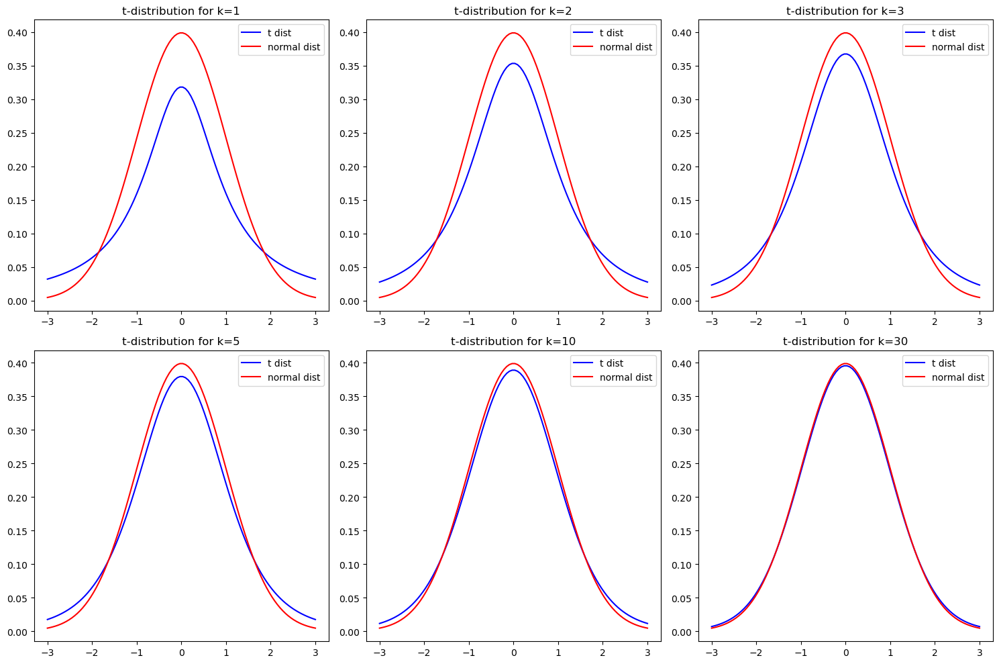

In [34]:
# Import the required function
from scipy.stats import t
from scipy.stats import norm

# set the values for x
x = np.linspace(-3,3,100)

# plot the t distribution for different values of k
fig,axes =plt.subplots(2,3,sharex= False,sharey=False,figsize=(15,10))
axes =axes.ravel()

for i, k in zip(range(6), [1,2,3,5,10,30]):
    ax = axes[i]
    ax.plot(x, t.pdf(x,df=k), color="blue", label="t dist")
    ax.plot(x, norm.pdf(x), color="red", label="normal dist")
    ax.set_title("t-distribution for k={0}".format(k))
    ax.legend(loc="upper right", fontsize=10)
plt.tight_layout()

Let's use the t-distribution to construct the confidence interval for the mean when population standard deviation is unknown.

The caffeine content (in mg) was examined for a random sample of 50 cups of black coffee dispensed by a new machine. The mean of the sample is found to be 110 mg and the sample standard deviation is estimated to be 7 mg. Construct a 95% confidence interval for μ, the mean caffeine content for cups dispensed by the machine.

In [36]:
# import the required function
from scipy.stats import t

# set the values of sample mean and standard deviation
x_bar , s = 110,7

# set the value of sample size and degree of freedom
n=50
k =n - 1

# contruct the confidence interval
np.round(t.interval (0.95 , df =k ,loc =x_bar, scale =s / np.sqrt(n)),2)


array([108.01, 111.99])

Insight
95% of the time, the mean caffeine content for cups of coffee dispensed by the machine will be between 108.01 mg and 111.99 mg.

### Key Takeaways

The confidence interval for the population mean can be constructed for both cases when the population standard deviation is known and when it is unknown. The latter case is more common which demands the application of t-distribution with appropriate degrees of freedom.

The general approach to the construction of confidence interval is to use the appropriate sample statistic to estimate the population parameter and use the proper percentile point of the sampling distribution.

In [40]:
np.round(norm.interval(0.95, loc=180, scale=6 / np.sqrt(100)), 2)

array([178.82, 181.18])

In [41]:
np.round(norm.interval(0.95, loc=1000, scale=200 / np.sqrt(100)), 2)

array([ 960.8, 1039.2])

In [42]:
# set the values of sample mean and standard deviation
x_bar , s = 160.9,6

# set the value of sample size and degree of freedom
n=50
k =n - 1

# contruct the confidence interval
np.round(t.interval (0.95 , df =k ,loc =x_bar, scale =s / np.sqrt(n)),2)


array([159.19, 162.61])

# Hypothesis test for the mean population μ 

It is known from experience that for a certain E-commerce company the mean delivery time
of the products is 5 days with a standard deviation of 1.3 days.
The new customer service manager of the company is afraid that the company is slipping
and collects a random sample of 45 orders. The mean delivery time of these samples comes
out to be 5.25 days.
Is there enough statistical evidence for the manager’s apprehension that the mean delivery
time of products is greater than 5 days.

In [44]:
# set the values of population mean and population standard deviation to 5 and 1.3 respectively

mu , sigma = 5,1.3

# set the value of sample mean to 5.25
x_bar = 5.25

# Calculate the test statistic
test_stat = (x_bar - mu) / (sigma/np.sqrt(45))
test_stat


1.2900392177883402

### The Z Statistic follows a standard normal distribution
lets plot the distrubution of Z statistic and see where the computed test statistic lies in the plot

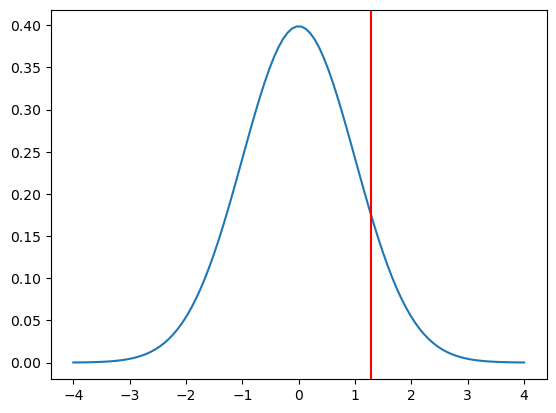

In [60]:
# import the required function
from scipy.stats import norm
 
# Plotting the distribution of Z statistic along with the test statistic
# we are plotting the distributions here to better visiualise the calculations
n= np.linspace(-4,4,100)
plt.plot(x,norm.pdf(x,0,1))
plt.axvline (x = test_stat, c = 'r')
plt.show()

What is the probablity of getting the calculated values of test statistic or bigger in the above distribution 

In [48]:
1 - norm.cdf(test_stat) 

0.09851852092578695

### Though the probablity is very small, is it small enough to reject the null hypothesis in favour of althernate hypothesis ?

### Introduction of Rejection Acceptance Region/ p-value

Though the probablity is very small, we cannot conlcude that the evidence is significant enough to reject the null hypothesis in the favour of the alternate hyptothesis or not. To determine it, we use either of the 2 approaches

1 - Rejection region approach

2 p-value approach

 Rejection region approach

For this approach we need to follow the following steps

1. We choose a value of significance (α)
 (α is the probablity of rejecting the null hypothesis if its true)
2. Then we find the rejection region the graph
3. We reject the null hypothesis if the test statistic falls in the rejection region. Else we dont reject the null hypothesis

in the given sample, the Z statistic follows a standard normal distribution as shown in the above plot. the Z value lying the right of the distribution gives a strong evidence against the null hypothesis.To find the rejection region, we will find the value of Z (called critical value) that gives an area  of α to the right end



In [50]:
# Import the required function
from scipy.stats import norm

# find the crtical value
critical_val = norm.ppf(1-0.05)
critical_val

1.6448536269514722

Crtical value  that seperates the region which will be rejected v/s which will be not rejected

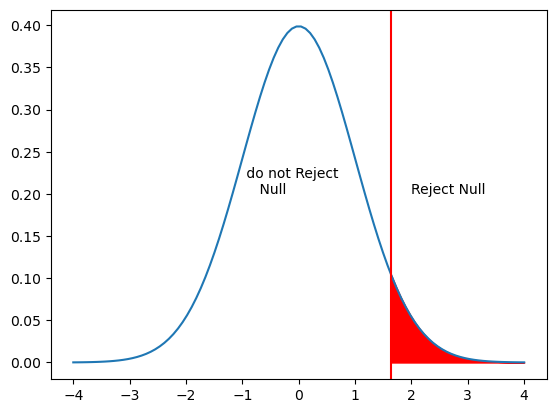

In [52]:
# Plotting the test statstic distribution and indicating the rejection and acceptance region 
# We are plotting the distributions here to better visiualise the calculations
x = np.linspace(-4,4,100)
plt.plot(x,norm.pdf(x,0,1))
plt.axvline( x= critical_val , c ='r')
x1 = np.linspace(critical_val , 4 , 50)
plt.fill_between (x1, norm.pdf(x1,0,1),color = 'r')
plt.annotate('Reject Null',(2,0.2))
plt.annotate(" do not Reject\n    Null",(-1,0.2))
plt.show()

### Insight
As our test statistic (~1.29) does not lie in the rejection region, we cannot reject null hypothesis. Thus, we do not have statistical evidence to say that the mean delivery time of a product is greater then 5 days.


### p-value Approach

Though the rejection region approach gives us the desired conclusion, it does not say anything about the strength of the evidence. Hence, statisticians prefer p-value approach which measures the strength of the evidence against the null hypothesis.

For this approach, we need to follow the below steps.

We choose a level of significance ( 𝛼
 )

Then, we calculate the p-value.

We reject the null hypothesis if p-value  ≤𝛼
 . Else, we fail to reject the null hypothesis.

The p-value is the probability of finding the observed test statistic or more extreme results, under the null hypothesis.

In the given example, p-value is the area right to the test statistic under the standard normal curve.

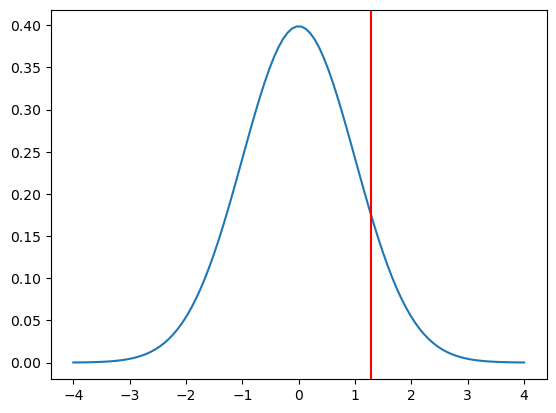

In [53]:
# Plotting the test statistic distribution along the computed test statistic
# we are plotting the distribution here to better visiualise the calculations
x = np.linspace(-4,4,100)
plt.plot(x,norm.pdf(x,0,1))
plt.axvline(x=test_stat , c='r')
x1 = np.linspace(test_stat,4,50)

In [54]:
# calculate the p-value
1 - norm.cdf(test_stat)

0.09851852092578695

### Insight

As the p-value ~0.098 is greater than the level of significance, we cannot reject the null hypothesis. Thus, we do not have statistica evidence to say that the mean delivery time of a product is greater 5 days.

### Key Takeaway

 We get the same result by using both the Rejection region and p-value approach that the manager does not have enough statitical evidence to say that the mean delivery time of a product is greater then 5 days.


# One-tailed and Two-tailed Tests

Let's see an example
Suppose a soft-drink manufacturer's most selling product is 600 ml coke with a standard deviation of 50 ml.

A customer would like to test whether there is at least 600 ml coke in the bottle. He doubts that the amount of coke in the bottle is less than 600 ml.

The null hypothesis formed by the customer is

𝐻0:𝜇=600
 
against the alternative hypothesis

𝐻𝑎:𝜇<600
 
However, the quality control team wants exactly 600 ml coke in the bottle. The team wants to ensure that the amount of coke in the bottle is not different from 600 ml.

The null hypothesis formed by the quality control team is

𝐻0:𝜇=600
 
against the alternative hypothesis

𝐻𝑎:𝜇≠600
 
Thus, the choice of one-sided vs two-sided alternative hypothesis depends on the nature of the problem.

### Two-tailed Test Example
Suppose you work on the quality control team of the company. It is known from experience that the mean amount of coke in a bottle is 600 ml with a standard deviation of 50 ml.

You have collected 36 randomly sampled bottles. The mean amount of coke in the 36 samples is 580 ml.

You intend to test whether the amount of coke in the bottle is different from 600 ml using 0.05 level of significance. Do you have enough Statistical evidence for it?

### Are the assumptions of Z-test satisfied?

Samples are drawn from a normal distribution - Since the sample size is 36(which is > 30), Central Limit Theorem states that the distribution of sample means will be normal. If the sample size was less than 30, we would have been able to apply Z test on if we knew that the population distribution was normal.

Observations are from a simple random sample - we are informed that you have collected a simple random sample.

Standard deviation is known - Yes

Voila! We can use Z-test for this problem.

### The next step is to find the test statistic

In [62]:
# set the values of population mean and standard deviation to 600 and 50 respectively
mu , sigma = 600 , 50

# set the value sample mean to 580
x_bar = 580

# calculate the test statistic
test_stat = (x_bar - mu) /(sigma/np.sqrt(36))
test_stat

-2.4

### Let's use the rejection region approach for two-tailed test

In the given example, the Z test statistic follows a standard normal distribution. The Z values lying in the left and right end of the distribution gives strong evidence against the null hypothesis. To find the rejection region, we will find the values of Z (called critical values) that give an area of  𝛼/2
  to both the left and right end.

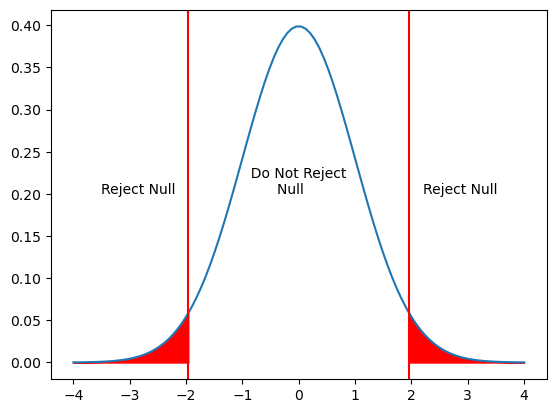

In [63]:
# import the required function
from scipy.stats import norm

# find the critical values
critical_val1 = norm.ppf(1-(0.05/2))
critical_val2 = norm.ppf(0.05/2)

# plot the rejection and acceptance region
# We are plotting the distributions here to better visualize the calculations
x = np.linspace(-4, 4, 100) # create an array of 100 numbers starting from -4 and ending at 4
plt.plot(x, norm.pdf(x, 0, 1)) # plot the pdf of the normal distribution
plt.axvline(x = critical_val1, c = 'r') # draw a vertical red line through the mentioned point
x1 = np.linspace(critical_val1, 4, 50) # create an array of 50 numbers starting from the critical value and ending at 4
plt.fill_between(x1, norm.pdf(x1, 0, 1), color='r') # fill the area under the curve after the critical value with red color
plt.axvline(x = critical_val2, c = 'r') # draw a vertical red line through the mentioned point
x1 = np.linspace(-4, critical_val2, 50) # create an array of 50 numbers starting from -4 and ending at the critical value
plt.fill_between(x1, norm.pdf(x1, 0, 1), color='r') # fill the area under the curve before the critical value with red color
plt.annotate('Reject Null', (2.2, 0.20)) # annotate the mentioned text at the mentioned location
plt.annotate('Reject Null', (-3.5, 0.20)) # annotate the mentioned text at the mentioned location
plt.annotate('  Do Not Reject\n        Null', (-1, 0.20)) # annotate the mentioned text at the mentioned location
plt.show() # display the plot

As our test statistic (~-2.4) lies in the rejection region, we can reject the null hypothesis. Thus, we have enough statistical evidence to say that the amount of coke in the bottle is different from 600 ml.

### One-tailed Test Example

It is known that the mean amount of coke in a bottle is 600 ml with a standard deviation of 50 ml. Suppose you are a customer who wants to test whether the amount of coke in the bottle is less than 600 ml.

You have collected 36 randomly sampled bottles. The mean amount of coke in the 36 samples is 580 ml.

Do you have enough Statistical evidence for it?

### Are the assumptions of Z-test satisfied?

1. Samples are drawn from a normal distribution - Since the sample size is 36(which is > 30), Central Limit Theorem states that the distribution of sample means will be normal. If the sample size was less than 30, we would have been able to apply Z test on if we knew that the population distribution was normal.
2. Observations are from a simple random sample - we are informed that you have collected a simple random sample.
3. Standard deviation is known - Yes

Voila! We can use Z-test for this problem.

### The next step is to find the test statistic

In [64]:
# set the values of population mean and standard deviation to 600 and 50 respectively
mu, sigma = 600, 50

# set the value sample mean to 580
x_bar = 580

# calculate the test statistic
test_stat = (x_bar - mu) / (sigma/np.sqrt(36))
test_stat

-2.4

### Let's use the rejection region approach for one-tailed test

In the given example, the Z test statistic follows a standard normal distribution. The Z values lying in the left end of the distribution gives strong evidence against the null hypothesis. To find the rejection region, we will find the value of Z (called critical value) that give an area of  𝛼
  to both the left end.

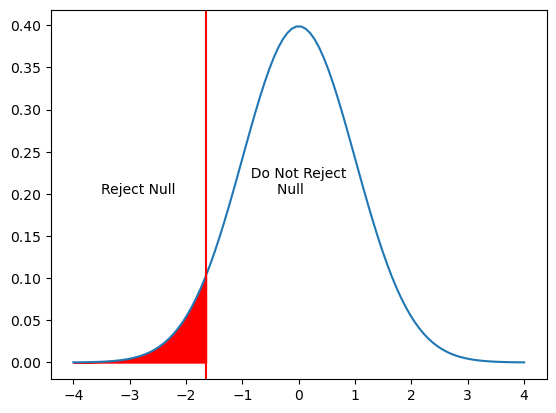

In [65]:
# import the required function
from scipy.stats import norm

# find the critical value
critical_val = norm.ppf(0.05)

# plot the rejection and acceptance region
# We are plotting the distributions here to better visualize the calculations
x = np.linspace(-4, 4, 100) # create an array of 100 numbers starting from -4 and ending at 4
plt.plot(x, norm.pdf(x, 0, 1)) # plot the pdf of the normal distribution
plt.axvline(x = critical_val, c = 'r') # draw a vertical red line through the mentioned point
x1 = np.linspace(-4, critical_val, 50) # create an array of 50 numbers starting from -4 and ending at the critical value
plt.fill_between(x1, norm.pdf(x1, 0, 1), color='r') # fill the area under the curve before the critical value with red color
plt.annotate('Reject Null', (-3.5, 0.20)) # annotate the mentioned text at the mentioned location
plt.annotate('  Do Not Reject\n        Null', (-1, 0.20)) # annotate the mentioned text at the mentioned location
plt.show() # display the plot

As our test statistic (~-2.4) lies in the rejection region, we can reject the null hypothesis. Thus, we have enough statistical evidence to say that the amount of coke in the bottle is less than from 600 ml.

Key Takeaways

In one-sided test, we consider the difference only in one direction. However, in two-sided tests we are interested to know the direction of the difference.
Depending on the nature of the problem choose one!

### One sample testing

In one sample test, we compare the population parameter such as mean of a single sample of data collected from a single population.

### Very rarely we know the variance of the population.
A common strategy to assess hypothesis is to conduct a t test. A t test can tell whether two groups have the same mean. A t test can be estimated for:

1) One sample t test
2) Two sample t test (including paired t test)
We assume that the samples are randomly selected, independent and come from a normally distributed population with unknown but equal variances.

### Example 1: T-test (sigma of the population is unknown)

Experian Marketing Services reported that the typical American spends a mean of 144 minutes (2.4 hours) per day accessing the Internet via a mobile device. (Source: The 2014 Digital Marketer, available at ex.pn/IkXJjfX.) In order to test the validity of this statement, you select a sample of 30 friends and family. The results for the time spent per day accessing the Internet via mobile device (in minutes) are stored in InternetMobileTime

a. Is there evidence that the population mean time spent per day accessing the Internet via mobile device is different from 144 minutes? Use the p-value approach and a level of significance of 0.05.

b. What assumption about the population distribution is needed in order to conduct the t test in (a)? Problem 9.35 from the Textbook adapted for Classroom Discussion(Chapter 9-page 314)

In [70]:
import numpy as np
import pandas as pd
import math
from scipy import stats
from scipy.stats import   ttest_1samp

In [73]:
mydata = pd.read_csv('InternetMobileTime.csv')
mydata.head()

,Minutes
0,72
1,144
2,48
3,72
4,36


Step 1: Define null and alternative hypotheses
In testing the average minutes spent on the internet.

Null hypothesis states that mean internet usage time, 𝜇
 is equals to 144.
Alternative hypothesis states that the mean mean internet usage time,

𝜇
 is unequal to 144.
 
𝐻0
: 𝜇
 = 144
 
𝐻𝐴
: 𝜇
 ≠
 144

### Step 2: Decide the significance level
Here we select 𝛼
 = 0.05.

In [75]:
print("The sample size for this problem is",len(mydata))

The sample size for this problem is 30


### Step 3: Identify the test statistic
We do not know the population standard deviation and n = 30. So we use the t distribution and the 𝑡𝑆𝑇𝐴𝑇
 test statistic.

### Step 4: Calculate the p - value and test statistic
scipy.stats.ttest_1samp calculates the t test for the mean of one sample given the sample observations and the expected value in the null hypothesis. This function returns t statistic and the two-tailed p value.

In [76]:
# one sample t-test
# null hypothesis: expected value = 144
t_statistic, p_value = ttest_1samp(mydata, 144)
print('One sample t test \nt statistic: {0} p value: {1} '.format(t_statistic, p_value))

One sample t test 
t statistic: [1.22467437] p value: [0.23055327] 


### Let us calculate at the value of the test statistic manually
Here, we see that the values of test statistic and the p-value is same as that we calculated from the function of the Scipy library.

### Step 5 Decide to reject or accept null hypothesis

In [77]:

# p_value < 0.05 => alternative hypothesis:

alpha_value = 0.05 # Level of significance
print('Level of significance: %.2f' %alpha_value)
if p_value < alpha_value: 
    print('We have evidence to reject the null hypothesis since p value < Level of significance')
else:
    print('We have no evidence to reject the null hypothesis since p value > Level of significance') 

print ("Our one-sample t-test p-value=", p_value)

Level of significance: 0.05
We have no evidence to reject the null hypothesis since p value > Level of significance
Our one-sample t-test p-value= [0.23055327]


In this example, p value is 0.23055327 and it is greater than 5% level of significance

So the statistical decision is failing to reject the null hypothesis at 5% level of significance.

So at 95% confidence level, there is sufficient evidence to prove that mean time spent on the internet is equal to 144 minutes.

### Two sample t test

## Two sample t test (Snedecor and Cochran 1989) is used to determine if two population means are equal. A common application is to test if a new treatment or approach or process is yielding better results than the current treatment or approach or process.

1) Data is paired - For example, a group of students are given coaching classes and effect of coaching on the marks scored is determined.
2) Data is not paired - For example, find out whether the miles per gallon of cars of Japanese make is superior to cars of Indian make.

In [80]:
import numpy                     as     np
import pandas                    as     pd
from   scipy.stats               import ttest_1samp, ttest_ind
import matplotlib.pyplot         as     plt
import matplotlib
import seaborn as sns
import scipy.stats as stats
import statsmodels.stats.api as sm

## Example 1 - Independent Two Sample T-Test

A hotel manager looks to enhance the initial impressions that hotel guests have when they check in. Contributing to initial impressions is the time it takes to deliver a guest’s luggage to the room after check-in. A random sample of 20 deliveries on a particular day were selected in Wing A of the hotel, and a random sample of 20 deliveries were selected in Wing B. The results are stored in Luggage . Analyze the data and determine whether there is a difference between the mean delivery times in the two wings of the hotel. (Use 𝛼
 = 0.05)
Problem 10.83 from the Textbook adapted for Classroom Discussion(Chapter 10-page 387)

In [82]:
mydata = pd.read_csv('Luggage.csv')
mydata.head()

,WingA,WingB
0,10.70,7.20
1,9.89,6.68
2,11.83,9.29
3,9.04,8.95
4,9.37,6.61


## Step 1: Define null and alternative hypotheses
In testing whether the mean time of deliveries of the luggages are same in both the wings of the hotel, the null hypothesis states that the mean time to deliver the luggages are the same, 𝜇𝐴
 equals 𝜇𝐵
. The alternative hypothesis states that the mean time to deliver the luggages are different, 𝜇𝐴
 is not equal to 𝜇𝐵
.

𝐻0
: 𝜇𝐴
 - 𝜇𝐵
 = 0 i.e 𝜇𝐴
 = 𝜇𝐵
𝐻𝐴
: 𝜇𝐴
 - 𝜇𝐵
 ≠
 0 i.e 𝜇𝐴
 ≠
 𝜇𝐵

## Step 2: Decide the significance level
Here we select  𝛼
  = 0.05 and the population standard deviation is not known.

## Step 3: Identify the test statistic
We have two samples and we do not know the population standard deviation.
Sample sizes for both samples are same.
The sample is not a large sample, n < 30. So you use the t distribution and the  𝑡𝑆𝑇𝐴𝑇
  test statistic for two sample unpaired test.

## Step 4: Calculate the p - value and test statistic
** We use the scipy.stats.ttest_ind to calculate the t-test for the means of TWO INDEPENDENT samples of scores given the two sample observations. This function returns t statistic and two-tailed p value.**

** This is a two-sided test for the null hypothesis that 2 independent samples have identical average (expected) values. This test assumes that the populations have identical variances.**

For this exercise, we are going to first assume that the variance is equal and then compute the necessary statistical values.

In [83]:
t_statistic, p_value  = ttest_ind(mydata['WingA'],mydata['WingB'])
print('tstat',t_statistic)    
print('P Value',p_value)    

tstat 5.16151166403543
P Value 8.007988032535588e-06


## Step 5: Decide to reject or accept null hypothesis

In [85]:
# p_value < 0.05 => alternative hypothesis:
# they don't have the same mean at the 5% significance level
print ("two-sample t-test p-value=", p_value)

alpha_level = 0.05

if p_value < alpha_level:
    print('We have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that the mean time to deliver luggages in of both the wings of the hotel are not same.')
else:
    print('We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that mean time to deliver luggages in of both the wings of the hotel are same.')

two-sample t-test p-value= 8.007988032535588e-06
We have enough evidence to reject the null hypothesis in favour of alternative hypothesis
We conclude that the mean time to deliver luggages in of both the wings of the hotel are not same.


Let us now go ahead and check the confidence intervals at a specific  𝛼
  value.

## Example 2 - Paired T-Test¶
The file Concrete contains the compressive strength, in thousands of pounds per square inch (psi), of 40 samples of concrete taken two and seven days after pouring. (Data extracted from O. Carrillo-Gamboa and R. F. Gunst, “Measurement-Error-Model Collinearities,” Technometrics, 34 (1992): 454–464.)

At the 0.01 level of significance, is there evidence that the mean strength is lower at two days than at seven days?

Problem 10.26 from the Textbook adapted for Classroom Discussion(Chapter 10-page 353)

In [87]:
mydata = pd.read_csv('Concrete.csv')
mydata.head()

,Sample,Two Days,Seven Days
0,1,2.830,3.505
1,2,3.295,3.430
2,3,2.710,3.670
3,4,2.855,3.355
4,5,2.980,3.985


## Step 1: Define null and alternative hypotheses
In testing whether the number of days has any effect on the lowering the compressive strength of the concrete,

the null hypothesis states that the compressive strength of the cement is not lower at 2 days than at 7 days, 𝜇2
 ≥
 𝜇7
.

The alternative hypthesis states that the compressive strength of the cement is lower at 2 days than at 7 days, 𝜇2
 < 𝜇7
𝐻0
: 𝜇2
 - 𝜇7
 ≥
 0

𝐻𝐴
: 𝜇2
 - 𝜇7
 < 0

Here, 𝜇2
 denotes the mean compressive strenght of the cement after two days and 𝜇7
 denotes the mean compressive strength of the cement after seven days.

## Step 2: Decide the significance level
Here we select  𝛼
  = 0.01 as given in the question.

## Step 3: Identify the test statistic
Sample sizes for both samples are same.
We have two paired samples and we do not know the population standard deviation.
The sample is not a large sample, n < 30. So you use the t distribution and the  𝑡𝑆𝑇𝐴𝑇
  test statistic for two sample paired test

## Step 4: Calculate the p - value and test statistic
We use the scipy.stats.ttest_rel to calculate the T-test on TWO RELATED samples of scores. This is a two-sided test for the null hypothesis that 2 related or repeated samples have identical average (expected) values. Here we give the two sample observations as input. This function returns t statistic and two-tailed p value.

In [89]:
# paired t-test: doing two measurments on the same experimental unit
# e.g., before and after a treatment
t_statistic, p_value  =  stats.ttest_rel(mydata['Two Days'],mydata['Seven Days'])
print('tstat  %1.3f' % t_statistic)    
print("p-value for one-tail:", p_value/2)

tstat  -9.372
p-value for one-tail: 7.768158524368871e-12


## Step 5: Decide to reject or accept null hypothesis

In [90]:
# p_value < 0.05 => alternative hypothesis:
# they don't have the same mean at the 5% significance level
print ("Paired two-sample t-test p-value=", p_value/2)

alpha_level = 0.01

if (p_value/2) < alpha_level:
    print('We have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    
else:
    print('We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis')

Paired two-sample t-test p-value= 7.768158524368871e-12
We have enough evidence to reject the null hypothesis in favour of alternative hypothesis



Paired two-sample t-test p-value= 7.768158524368873e-12

We have enough evidence to reject the null hypothesis in favour of alternative hypothesis

In [1]:
import numpy              as        np
import pandas             as        pd
import matplotlib.pyplot  as        plt
from   scipy.stats        import    chi2_contingency

In [2]:
df = pd.DataFrame({'Promoted':[15,16],'Not-promoted':[9,15]},index=['Company A','Company B'])

In [3]:
df

,Promoted,Not-promoted
Company A,15,9
Company B,16,15


## Define Null and Alternate Hypothesis

H0: There is no influence of background on promotions  H1: Promotions are biased

## Step 2: Decide the significance level

Here we select α= 0.05 as per 95% Confidence Level requirement in the question.

## Step 3: Identify the test statistic

This is a Chi-sq Test where categorical data has been reported in raw frequencies

## Step 4: Calculate the p - value and test statistic

In [4]:
chi2, pval, dof, exp_freq = chi2_contingency(df, correction = False)

In [5]:
pval

0.41943105261448455

## Step 5: Decide to reject or accept null hypothesis

Since the pvalue is > 0.05, therefore, at 95% confidence we fail to reject the null hypothesis which implies the management is not biased in favor of employees originally belonging to company A.

### ANOVA

In [3]:
DF= pd.read_csv('paul-newfood.csv')

In [5]:
DF.head()

,Sales,PriceLevel,AdLevel,StoreSize
0,620,1,1,34
1,774,1,1,41
2,955,1,2,32
3,669,1,2,28
4,623,1,1,34


In [6]:
DF.describe()

,Sales,PriceLevel,AdLevel,StoreSize
count,24.000000,24.000000,24.000000,24.000000
mean,571.416667,2.000000,1.500000,32.333333
std,212.629279,0.834058,0.510754,6.424590
min,294.000000,1.000000,1.000000,19.000000
25%,393.250000,1.000000,1.000000,28.750000
50%,550.000000,2.000000,1.500000,32.000000
75%,677.000000,3.000000,2.000000,37.000000
max,1208.000000,3.000000,2.000000,43.000000


In [7]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Sales       24 non-null     int64
 1   PriceLevel  24 non-null     int64
 2   AdLevel     24 non-null     int64
 3   StoreSize   24 non-null     int64
dtypes: int64(4)
memory usage: 896.0 bytes


In [4]:
DF.PriceLevel = pd.Categorical(DF.PriceLevel)

In [9]:
DF.PriceLevel.value_counts()

1    8
2    8
3    8
Name: PriceLevel, dtype: int64

In [5]:
DF.AdLevel = pd.Categorical(DF.AdLevel)

In [11]:
DF.AdLevel.value_counts()

1    12
2    12
Name: AdLevel, dtype: int64

In [6]:
formula = 'Sales ~ C(PriceLevel) + C(AdLevel)'
model = ols(formula,DF).fit()
aov_table = anova_lm(model)
print(aov_table)

                 df         sum_sq        mean_sq          F    PR(>F)
C(PriceLevel)   2.0  600412.583333  300206.291667  13.663982  0.000182
C(AdLevel)      1.0      32.666667      32.666667   0.001487  0.969624
Residual       20.0  439412.583333   21970.629167        NaN       NaN


<AxesSubplot:xlabel='PriceLevel', ylabel='Sales'>

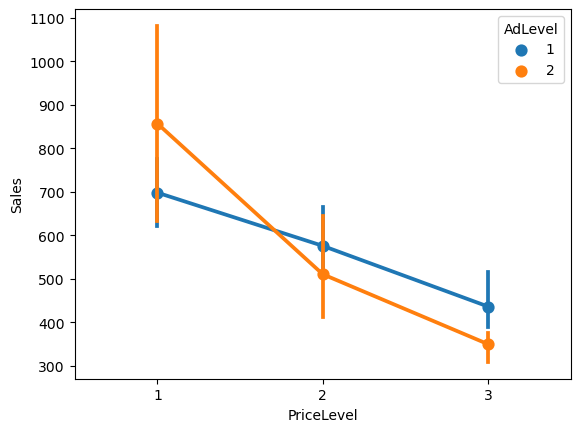

In [8]:
sns.pointplot(data=DF , x='PriceLevel',y = 'Sales',hue='AdLevel')

<AxesSubplot:xlabel='PriceLevel', ylabel='Sales'>

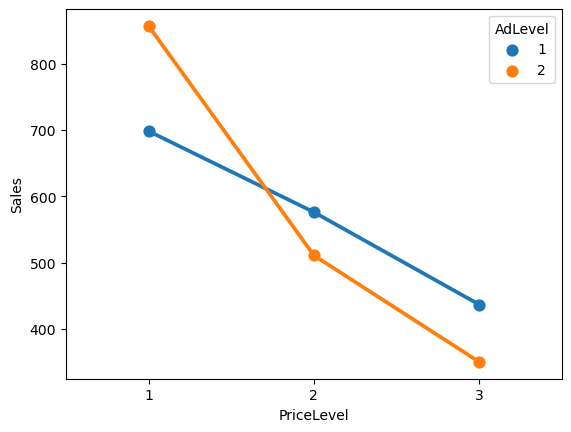

In [10]:
# Point plot without the confidence interval
sns.pointplot(data=DF , x= 'PriceLevel',y = 'Sales',hue='AdLevel',ci=None)

In [12]:
# adding the calliberation of price an advertisement level to the formula
formula = 'Sales ~ C(PriceLevel) + C(AdLevel) + C(PriceLevel):C(AdLevel)'
model = ols(formula, DF).fit()
aov_table = anova_lm(model)
print(aov_table)

                            df         sum_sq        mean_sq          F  \
C(PriceLevel)              2.0  600412.583333  300206.291667  14.781913   
C(AdLevel)                 1.0      32.666667      32.666667   0.001608   
C(PriceLevel):C(AdLevel)   2.0   73850.083333   36925.041667   1.818159   
Residual                  18.0  365562.500000   20309.027778        NaN   

                            PR(>F)  
C(PriceLevel)             0.000159  
C(AdLevel)                0.968450  
C(PriceLevel):C(AdLevel)  0.190898  
Residual                       NaN  


In [13]:
# adding store size to the formula
formula = 'Sales ~ C(PriceLevel) + C(AdLevel) + StoreSize + C(PriceLevel):C(AdLevel)'
model = ols(formula, DF).fit()
aov_table = anova_lm(model,type=2)
print(aov_table)

                            df         sum_sq        mean_sq          F  \
C(PriceLevel)              2.0  600412.583333  300206.291667  29.483426   
C(AdLevel)                 1.0      32.666667      32.666667   0.003208   
C(PriceLevel):C(AdLevel)   2.0   73850.083333   36925.041667   3.626429   
StoreSize                  1.0  192465.010526  192465.010526  18.902095   
Residual                  17.0  173097.489474   10182.205263        NaN   

                            PR(>F)  
C(PriceLevel)             0.000003  
C(AdLevel)                0.955492  
C(PriceLevel):C(AdLevel)  0.048790  
StoreSize                 0.000438  
Residual                       NaN  


In [3]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_less_then_3_17 = norm.cdf(3.17 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength less than 3.17 kg per sq cm is",
       round(Prob_less_then_3_17, 4),
)

 The probability that a gunny bags have a breaking strength less than 3.17 kg per sq cm is 0.1112


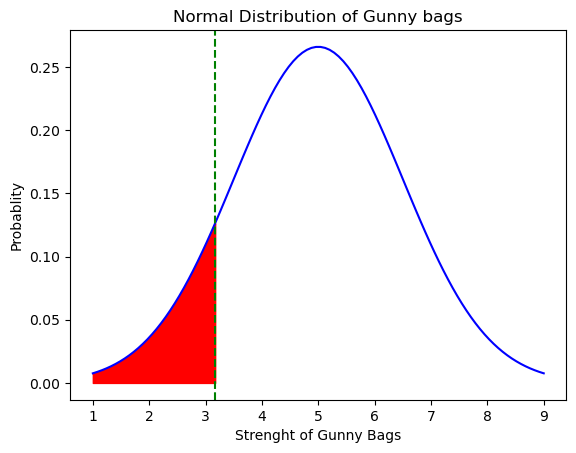

In [4]:
from scipy.stats import norm
fig, ax = plt.subplots()
x = np.linspace(1,9,100)
x1 = np.linspace(1,3.17,100)
ax.plot(x , norm.pdf(x , loc = 5 , scale = 1.5 ),color ='b')
plt.fill_between(x1, norm.pdf(x1, 5,1.5),color='r')
ax.set_title('Normal Distribution of Gunny bags')
ax.set_xlabel('Strenght of Gunny Bags')
ax.set_ylabel('Probablity')
ax.axvline(3.17 , ymax=5 , linestyle = '--',color ='green')

In [5]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_less_then_3_6 = norm.cdf(3.6 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength atlea 3.6 kg per sq cm is",
       round(Prob_less_then_3_6, 4),
)

 The probability that a gunny bags have a breaking strength atlea 3.6 kg per sq cm is 0.1753


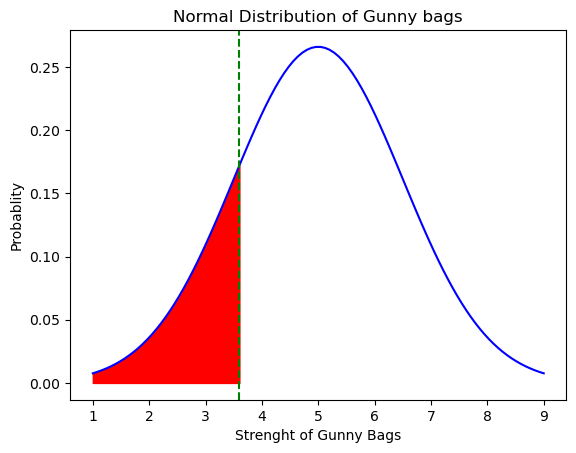

In [6]:
from scipy.stats import norm
fig, ax = plt.subplots()
x = np.linspace(1,9,100)
x1 = np.linspace(1,3.6,100)
ax.plot(x , norm.pdf(x , loc = 5 , scale = 1.5 ),color ='b')
plt.fill_between(x1, norm.pdf(x1, 5,1.5),color='r')
ax.set_title('Normal Distribution of Gunny bags')
ax.set_xlabel('Strenght of Gunny Bags')
ax.set_ylabel('Probablity')
ax.axvline(3.6 , ymax=5 , linestyle = '--',color ='green')

In [7]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_less_then_5_5 = norm.cdf(5.5 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength atleast 5.5 kg per sq cm is",
       round(Prob_less_then_5_5, 4),
)

 The probability that a gunny bags have a breaking strength atleast 5.5 kg per sq cm is 0.6306


In [8]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_less_then_5 = norm.cdf(5 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength atleast 5.5 kg per sq cm is",
       round(Prob_less_then_5, 4),
)

 The probability that a gunny bags have a breaking strength atleast 5.5 kg per sq cm is 0.5


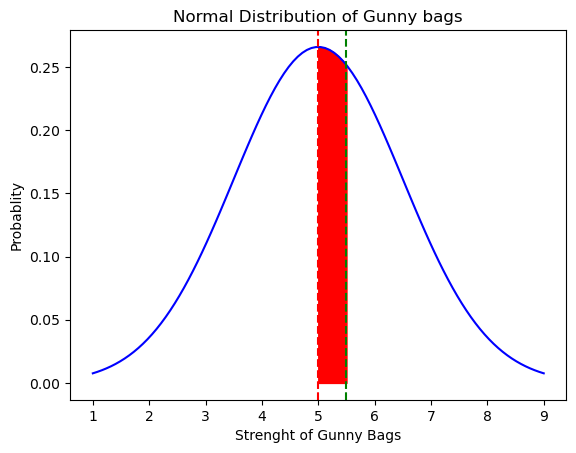

In [9]:
from scipy.stats import norm
fig, ax = plt.subplots()
x = np.linspace(1,9,100)
x1 = np.linspace(5,5.5,100)
ax.plot(x , norm.pdf(x , loc = 5 , scale = 1.5 ),color ='b')
plt.fill_between(x1, norm.pdf(x1, 5,1.5),color='r')
ax.set_title('Normal Distribution of Gunny bags')
ax.set_xlabel('Strenght of Gunny Bags')
ax.set_ylabel('Probablity')
ax.axvline(5.5, ymax=5 , linestyle = '--',color ='green')
ax.axvline(5 , ymax=5 , linestyle = '--',color ='red')

In [10]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_less_then_3 = norm.cdf(3 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength atleast 3 kg per sq cm is",
       round(Prob_less_then_3, 4),
)

 The probability that a gunny bags have a breaking strength atleast 3 kg per sq cm is 0.0912


In [11]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mu = 5
sigma = 1.5
Prob_greater_then_7_5 = 1-norm.cdf(7.5 , mu,sigma)
print (
      " The probability that a gunny bags have a breaking strength greater then 7.5 kg per sq cm is",
       round(Prob_greater_then_7_5, 4),
)

 The probability that a gunny bags have a breaking strength greater then 7.5 kg per sq cm is 0.0478


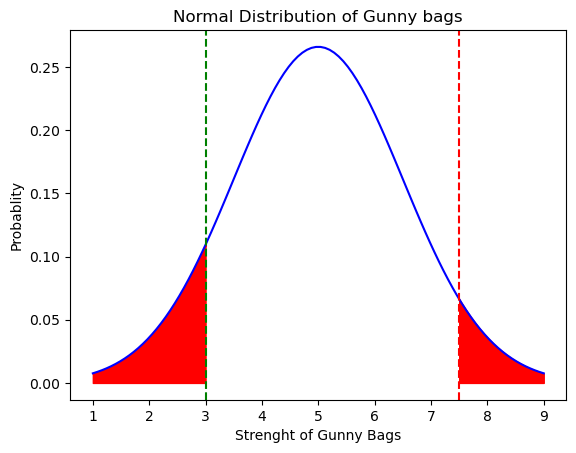

In [12]:
from scipy.stats import norm
fig, ax = plt.subplots()
x = np.linspace(1,9,100)
x1 = np.linspace(1,3,100)
x2 = np.linspace(7.5,9,100)
ax.plot(x , norm.pdf(x , loc = 5 , scale = 1.5 ),color ='b')
plt.fill_between(x1, norm.pdf(x1, 5,1.5),color='r')
plt.fill_between(x2, norm.pdf(x2, 5,1.5),color='r')
ax.set_title('Normal Distribution of Gunny bags')
ax.set_xlabel('Strenght of Gunny Bags')
ax.set_ylabel('Probablity')
ax.axvline(3, ymax=5 , linestyle = '--',color ='green')
ax.axvline(7.5 , ymax=5 , linestyle = '--',color ='red')

In [13]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mean = 77
sigma = 8.5
Prob_less_then_85 = norm.cdf(85 , mean,sigma)
print (
      " The probability that a students gets below 85 on this exam",
       round(Prob_less_then_85, 4),
)

 The probability that a students gets below 85 on this exam 0.8267


In [14]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mean = 77
sigma = 8.5
Prob_more_then_87 = 1-norm.cdf(87 , mean,sigma)
print (
      " The probability that a students gets above 87 on this exam",
       round(Prob_more_then_87, 4),
)

 The probability that a students gets above 87 on this exam 0.1197


In [15]:
# find the cumalative probablity
# norm.cdf() calculates the cumalative probality
mean = 77
sigma = 8.5
Prob_less_then_65 = norm.cdf(65 , mean,sigma)
print (
      " The probability that a students gets below 65 on this exam",
       round(Prob_less_then_65, 4),
)

 The probability that a students gets below 65 on this exam 0.079


In [16]:
    print (
      " The probability that a students gets a score between 65 and 87  on this exam",
   1-(0.1197+0.079),
)

 The probability that a students gets a score between 65 and 87  on this exam 0.8013


In [17]:
# Calculate the 75th percentile score using ppf() function
# norm.ppf calculates the percentile point
mean = 77
sigma = 8.5
score_75th_percentile = norm.ppf(0.75 , mean , sigma)
print("The 75th Percentile score should be ", round(score_75th_percentile))

The 75th Percentile score should be  83


In [18]:
df = pd.read_csv ('Zingaro_Company.csv')

In [19]:
# one sample t-test
# null hypothesis: expected value = 150
t_statistic, p_value = ttest_1samp(df['Unpolished '], 150)
print('One sample t test \nt statistic: {0} p value: {1} '.format(t_statistic, p_value))

One sample t test 
t statistic: -4.164629601426757 p value: 8.342573994839304e-05 


In [20]:

# p_value < 0.05 => alternative hypothesis:

alpha_value = 0.05 # Level of significance
print('Level of significance: %.2f' %alpha_value)
if p_value < alpha_value: 
    print('We have evidence to reject the null hypothesis since p value < Level of significance')
else:
    print('We have no evidence to reject the null hypothesis since p value > Level of significance') 

print ("Our one-sample t-test p-value=", p_value)

Level of significance: 0.05
We have evidence to reject the null hypothesis since p value < Level of significance
Our one-sample t-test p-value= 8.342573994839304e-05


In [21]:
t_statistic, p_value  = ttest_ind(df['Unpolished '],df['Treated and Polished'])
print('tstat',t_statistic)    
print('P Value',p_value)

tstat -3.2422320501414053
P Value 0.0014655150194628353


In [22]:
# p_value < 0.05 => alternative hypothesis:
# they don't have the same mean at the 5% significance level
print ("two-sample t-test p-value=", p_value)

alpha_level = 0.05

if p_value < alpha_level:
    print('We have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that the mean hardness of Polished and unpolished Stone is not the same.')
else:
    print('We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that the mean hardness of Polished and unpolished Stone is  the samee.')

two-sample t-test p-value= 0.0014655150194628353
We have enough evidence to reject the null hypothesis in favour of alternative hypothesis
We conclude that the mean hardness of Polished and unpolished Stone is not the same.


In [23]:
de = pd.read_csv('Aquarius_gym.csv')
de.head()

,Sr no.,Before,After
0,1,39,44
1,2,25,25
2,3,39,39
3,4,6,13
4,5,40,44


In [24]:
# paired t-test: doing two measurments on the same experimental unit
# e.g., before and after a treatment
t_statistic, p_value  =  stats.ttest_rel(de['Before'],de['After'])
print('tstat  %1.3f' % t_statistic)    
print("p-value for one-tail:", p_value/2)

tstat  -19.323
p-value for one-tail: 1.1460209626255983e-35


In [25]:
# p_value < 0.05 => alternative hypothesis:
# they don't have the same mean at the 5% significance level
print ("Paired two-sample t-test p-value=", p_value/2)

alpha_level = 0.01

if (p_value/2) < alpha_level:
    print('We have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    
else:
    print('We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis')

Paired two-sample t-test p-value= 1.1460209626255983e-35
We have enough evidence to reject the null hypothesis in favour of alternative hypothesis


# Data Mining¶
Principal Component Analyses (PCA)

In [48]:
df = pd.read_excel('Delhi_Pollution_data.xlsx')
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Delhi,2020-07-01,54.01,128.66,6.33,21.05,16.81,29.06,0.97,11.15,29.73,2.03,23.57,0.65,101,Moderate
1,Delhi,2020-06-30,39.80,91.98,5.99,17.96,15.44,28.48,0.84,10.51,37.29,1.57,16.37,0.49,114,Moderate
2,Delhi,2020-06-29,44.86,184.12,10.50,21.57,21.94,27.97,0.88,11.58,26.61,2.13,23.80,1.13,233,Poor
3,Delhi,2020-06-28,59.52,308.65,12.67,21.60,23.86,29.27,0.94,10.70,18.05,1.71,25.13,1.74,196,Moderate
4,Delhi,2020-06-27,39.80,155.94,10.88,21.46,22.47,31.43,0.87,10.38,18.88,1.69,19.99,0.43,112,Moderate


In [49]:
#Check the appropriateness of datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2009 entries, 0 to 2008
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        2009 non-null   object        
 1   Date        2009 non-null   datetime64[ns]
 2   PM2.5       2009 non-null   float64       
 3   PM10        2009 non-null   float64       
 4   NO          2009 non-null   float64       
 5   NO2         2009 non-null   float64       
 6   NOx         2009 non-null   float64       
 7   NH3         2009 non-null   float64       
 8   CO          2009 non-null   float64       
 9   SO2         2009 non-null   float64       
 10  O3          2009 non-null   float64       
 11  Benzene     2009 non-null   float64       
 12  Toluene     2009 non-null   float64       
 13  Xylene      2009 non-null   float64       
 14  AQI         2009 non-null   int64         
 15  AQI_Bucket  2009 non-null   object        
dtypes: datetime64[ns](1), fl

In [50]:
# Check for duplicate values
df.duplicated().sum()

0

In [51]:
# Check for Null values
df.isnull().sum()

City          0
Date          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO            0
SO2           0
O3            0
Benzene       0
Toluene       0
Xylene        0
AQI           0
AQI_Bucket    0
dtype: int64

In [52]:
#Note: AQI and AQI_Bucket are dependent features
#Drop all columns other than the ones suitable for PCA
df_pca = df.drop(['City', 'Date', 'AQI', 'AQI_Bucket'], axis = 1)

In [53]:
df_pca

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
0,54.01,128.66,6.33,21.05,16.81,29.06,0.97,11.15,29.73,2.03,23.57,0.65
1,39.80,91.98,5.99,17.96,15.44,28.48,0.84,10.51,37.29,1.57,16.37,0.49
2,44.86,184.12,10.50,21.57,21.94,27.97,0.88,11.58,26.61,2.13,23.80,1.13
3,59.52,308.65,12.67,21.60,23.86,29.27,0.94,10.70,18.05,1.71,25.13,1.74
4,39.80,155.94,10.88,21.46,22.47,31.43,0.87,10.38,18.88,1.69,19.99,0.43
...,...,...,...,...,...,...,...,...,...,...,...,...
2004,146.60,219.13,14.01,34.92,38.25,122.88,9.20,3.33,23.20,2.80,6.21,2.96
2005,151.84,241.84,25.01,36.91,48.62,130.36,11.54,4.63,25.36,4.26,9.71,3.34
2006,87.18,131.90,25.73,30.31,47.95,69.55,10.61,2.65,19.71,3.91,10.23,1.99
2007,186.18,269.55,62.09,32.87,88.14,31.83,9.54,6.65,29.97,10.55,20.09,4.29


In [36]:
# check the len of the number of feature
len(df_pca.columns)

12

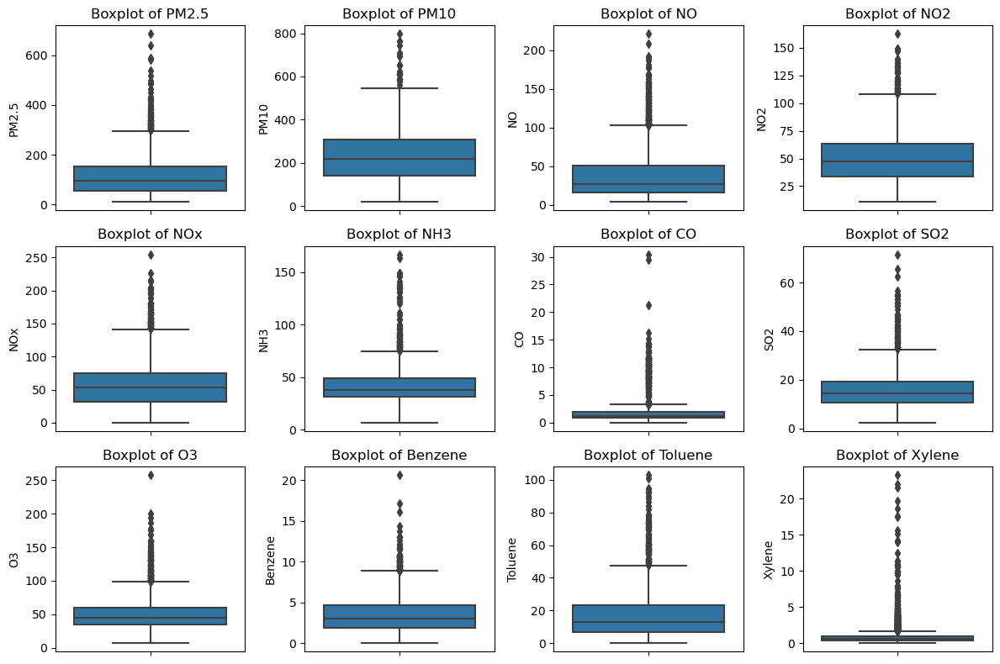

In [54]:
#Check for presence of outliers in each feature
plt.figure(figsize = (12,8))
feature_list = df_pca.columns
for i in range(len(feature_list)):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(y = df_pca[feature_list[i]], data = df_pca)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()    

In [55]:
#Define a function which returns the Upper and Lower limit to detect outliers for each feature
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range  

In [56]:
#Cap & floor the values beyond the outlier boundaries
for i in feature_list:
    LL, UL = remove_outlier(df_pca[i])
    df_pca[i] = np.where(df_pca[i] > UL, UL, df_pca[i])
    df_pca[i] = np.where(df_pca[i] < LL, LL, df_pca[i])

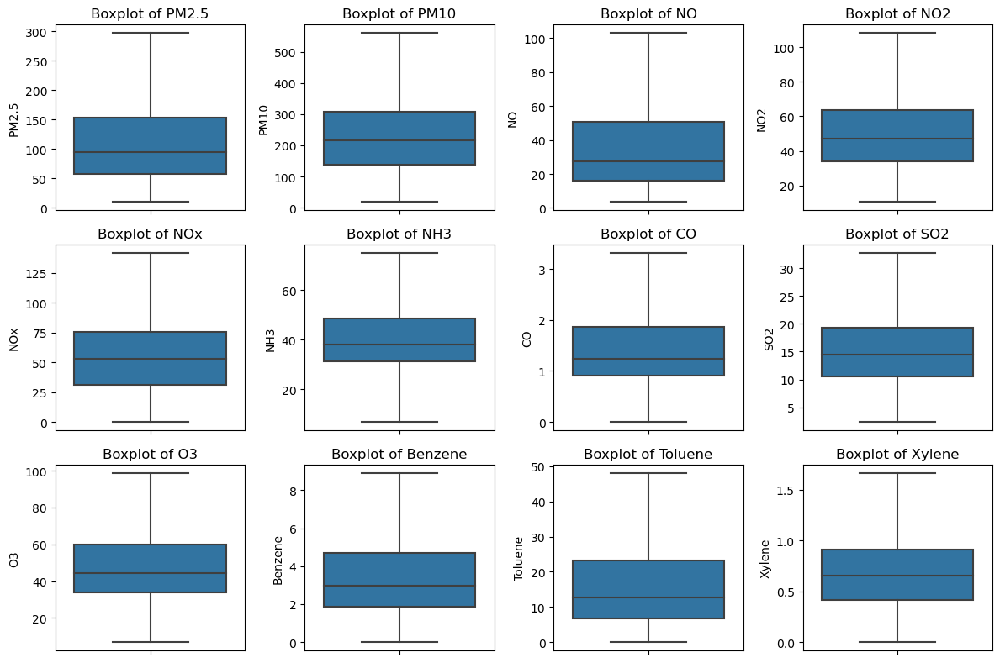

In [57]:
#Check to verify if outliers have been treated
plt.figure(figsize = (12,8))
feature_list = df_pca.columns
for i in range(len(feature_list)):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(y = df_pca[feature_list[i]], data = df_pca)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [58]:
#Check the descriptive stats to observe scale issues between the variables
df_pca.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
count,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000
mean,114.304358,231.283146,37.080572,50.418793,57.594064,41.004778,1.457427,15.465983,49.570667,3.480214,16.358808,0.736013
std,73.207550,116.454530,27.868734,21.533088,34.831204,13.629083,0.856552,6.480297,20.892250,2.228740,12.623484,0.522847
min,10.240000,18.590000,3.570000,10.630000,0.000000,6.780000,0.000000,2.340000,6.940000,0.000000,0.000000,0.000000
25%,57.100000,138.810000,15.900000,33.900000,31.150000,31.220000,0.910000,10.460000,34.080000,1.870000,6.650000,0.410000
50%,94.620000,216.730000,27.200000,47.150000,52.750000,38.040000,1.240000,14.450000,44.440000,2.960000,12.750000,0.650000
75%,152.990000,307.380000,50.720000,63.570000,75.360000,48.680000,1.870000,19.360000,59.880000,4.680000,23.200000,0.910000
max,296.825000,560.235000,102.950000,108.075000,141.675000,74.870000,3.310000,32.710000,98.580000,8.895000,48.025000,1.660000


In [59]:
#Scale the data
from scipy.stats import zscore
df_pca_scaled = df_pca.apply(zscore)

In [60]:
#Check the data post scaling
df_pca_scaled.head()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
0,-0.823814,-0.881449,-1.103682,-1.364231,-1.171197,-0.876637,-0.569198,-0.666182,-0.949903,-0.650850,0.571394,-0.164550
1,-1.017968,-1.196500,-1.115885,-1.507767,-1.210540,-0.919203,-0.721007,-0.764968,-0.587956,-0.857296,0.000887,-0.470643
2,-0.948832,-0.405093,-0.954015,-1.340076,-1.023879,-0.956633,-0.674297,-0.599811,-1.099278,-0.605970,0.589619,0.753730
3,-0.748529,0.664518,-0.876131,-1.338682,-0.968742,-0.861224,-0.604231,-0.735641,-1.509101,-0.794465,0.695004,1.767664
4,-1.017968,-0.647136,-0.940376,-1.345186,-1.008659,-0.702700,-0.685974,-0.785033,-1.469363,-0.803441,0.287725,-0.585428


<AxesSubplot:>

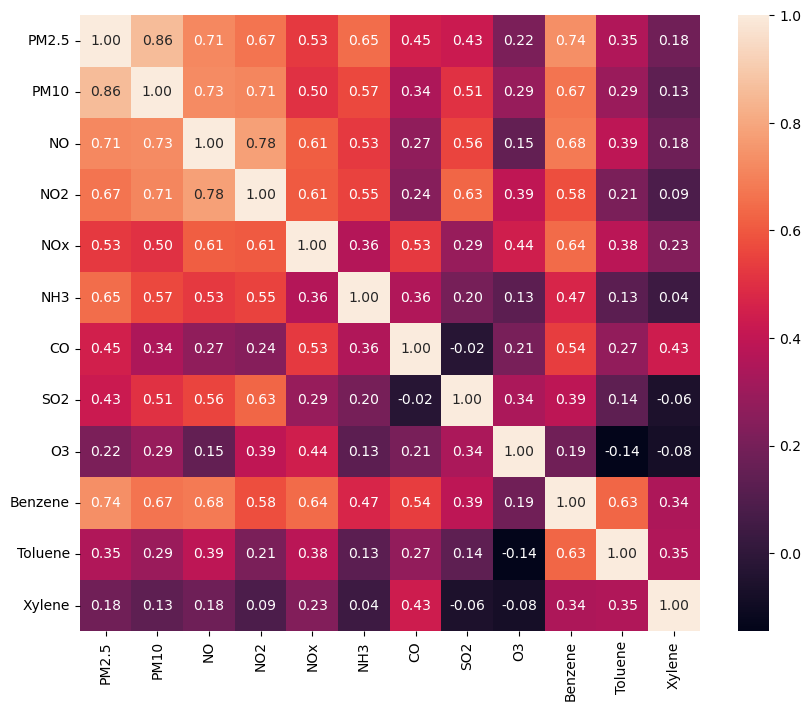

In [62]:
#Check for presence of correlations
plt.figure (figsize=(10,8))
sns.heatmap(df_pca_scaled.corr(),annot=True , fmt='.2f')

In [65]:
#Confirm the statistical significance of correlations
#H0: Correlations are not significant, H1: There are significant correlations
#Reject H0 if p-value < 0.05
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value, p_value = calculate_bartlett_sphericity(df_pca_scaled)
p_value

0.0

In [66]:
#Confirm the adequacy of sample size. 
#Note: Above 0.7 is good, below 0.5 is not acceptable
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(df_pca_scaled)
kmo_model

0.8377873137578513

In [67]:
# Apply PCA taking all features
from sklearn.decomposition import PCA
pca = PCA(n_components=12, random_state=123)
pca_transformed = pca.fit_transform (df_pca_scaled)

In [68]:
#Extract eigen vectors
pca.components_

array([[ 0.36757983,  0.35874864,  0.3586897 ,  0.34856375,  0.31661476,
         0.27264851,  0.22407402,  0.2354441 ,  0.14900296,  0.35967138,
         0.20036925,  0.11870582],
       [ 0.01788055,  0.12180783,  0.07920562,  0.25502423, -0.07185109,
         0.06976372, -0.37463646,  0.38778796,  0.33653904, -0.20718676,
        -0.41848144, -0.53052722],
       [-0.10244197, -0.1082965 , -0.23877719, -0.02680145,  0.329494  ,
        -0.04259609,  0.46126311, -0.1934286 ,  0.65938621, -0.06805854,
        -0.32861601,  0.10988637],
       [ 0.2517615 ,  0.14172243, -0.04998115, -0.05800976, -0.19614686,
         0.64557842,  0.21025355, -0.42214395, -0.25004424, -0.10221822,
        -0.35987447, -0.17472887],
       [-0.02951417, -0.10587218, -0.06664532, -0.15232101,  0.3156141 ,
         0.03492092,  0.00652305, -0.27840717,  0.07088788,  0.1881715 ,
         0.44708658, -0.73591565],
       [-0.33778676, -0.35252369,  0.38787525,  0.34686121,  0.49700404,
         0.18451077, -

In [69]:
#Check the eigen values
#Note: This is always returned in descending order
pca.explained_variance_

array([5.71418983, 1.73516949, 1.14758734, 0.95455182, 0.63944041,
       0.46998204, 0.36503474, 0.34686872, 0.1906889 , 0.16883957,
       0.15442402, 0.11919921])

In [70]:
#Check the explained variance for each PC
#Note: Explained variance = (eigen value of each PC)/(sum of eigen values of all PCs)
pca.explained_variance_ratio_

array([0.47594546, 0.14452548, 0.09558468, 0.07950639, 0.05326018,
       0.03914568, 0.03040442, 0.02889134, 0.01588283, 0.01406296,
       0.01286226, 0.00992832])

In [71]:
#Create a dataframe containing the loadings or coefficients of all PCs
df_extracted_loadings = pd.DataFrame (pca.components_.T,
                                     columns = ['PC1','PC2', 'PC3', 'PC4', 'PC5', 'PC6',
                                               'PC7','PC8', 'PC9', 'PC10', 'PC11', 'PC12'],
                                     index = df_pca_scaled.columns)

In [72]:
df_extracted_loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
PM2.5,0.367580,0.017881,-0.102442,0.251761,-0.029514,-0.337787,0.065633,0.275665,0.086309,-0.123236,-0.164356,0.738761
PM10,0.358749,0.121808,-0.108297,0.141722,-0.105872,-0.352524,0.123756,0.469464,-0.192561,-0.218866,0.015977,-0.606809
NO,0.358690,0.079206,-0.238777,-0.049981,-0.066645,0.387875,-0.144580,0.198196,0.126583,0.155804,0.736009,0.092056
NO2,0.348564,0.255024,-0.026801,-0.058010,-0.152321,0.346861,0.022629,-0.052348,-0.576914,0.421731,-0.385366,0.058499
NOx,0.316615,-0.071851,0.329494,-0.196147,0.315614,0.497004,-0.093880,0.218380,0.227118,-0.446437,-0.302527,-0.044863
NH3,0.272649,0.069764,-0.042596,0.645578,0.034921,0.184511,0.277003,-0.566976,0.115428,-0.193869,0.039794,-0.127519
CO,0.224074,-0.374636,0.461263,0.210254,0.006523,-0.203209,-0.607033,-0.152714,-0.298226,0.032584,0.170692,-0.013601
SO2,0.235444,0.387788,-0.193429,-0.422144,-0.278407,-0.223017,-0.365280,-0.437689,0.135554,-0.322230,-0.063257,-0.010476
O3,0.149003,0.336539,0.659386,-0.250044,0.070888,-0.218104,0.448666,-0.101397,-0.002582,0.103173,0.293715,0.078303
Benzene,0.359671,-0.207187,-0.068059,-0.102218,0.188172,-0.207380,-0.020012,-0.090417,0.531238,0.589204,-0.224580,-0.214074


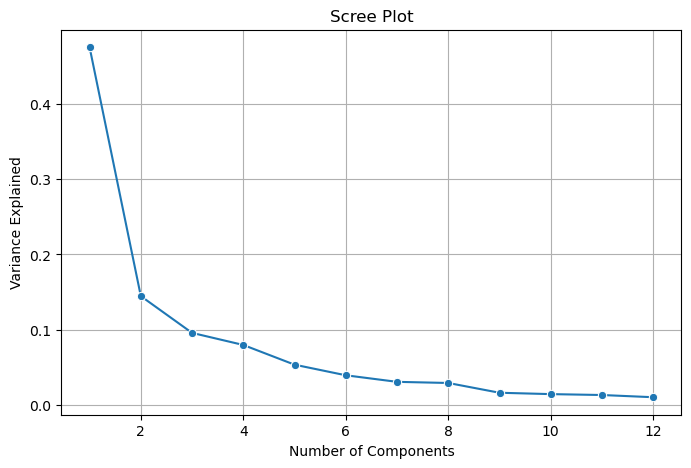

In [73]:
#Create a scree plot
plt.figure(figsize=(8,5))
sns.lineplot(y=pca.explained_variance_ratio_ ,x=range(1,13),marker='o')
plt.xlabel('Number of Components',fontsize=10)
plt.ylabel('Variance Explained',fontsize=10)
plt.title('Scree Plot',fontsize=12)
plt.grid()
plt.show()

In [74]:
#Check the cumlative explained variance ratio to find a cut off for selecting the number of PCs
np.cumsum(pca.explained_variance_ratio_)

array([0.47594546, 0.62047094, 0.71605562, 0.79556201, 0.84882219,
       0.88796786, 0.91837228, 0.94726362, 0.96314645, 0.97720941,
       0.99007168, 1.        ])

In [75]:
#Choose the PCs basis cumulative explained variance
df_selected = df_extracted_loadings[['PC1','PC2','PC3','PC4','PC5']]

In [76]:
#Check the selected PCs
df_selected

,PC1,PC2,PC3,PC4,PC5
PM2.5,0.367580,0.017881,-0.102442,0.251761,-0.029514
PM10,0.358749,0.121808,-0.108297,0.141722,-0.105872
NO,0.358690,0.079206,-0.238777,-0.049981,-0.066645
NO2,0.348564,0.255024,-0.026801,-0.058010,-0.152321
NOx,0.316615,-0.071851,0.329494,-0.196147,0.315614
NH3,0.272649,0.069764,-0.042596,0.645578,0.034921
CO,0.224074,-0.374636,0.461263,0.210254,0.006523
SO2,0.235444,0.387788,-0.193429,-0.422144,-0.278407
O3,0.149003,0.336539,0.659386,-0.250044,0.070888
Benzene,0.359671,-0.207187,-0.068059,-0.102218,0.188172


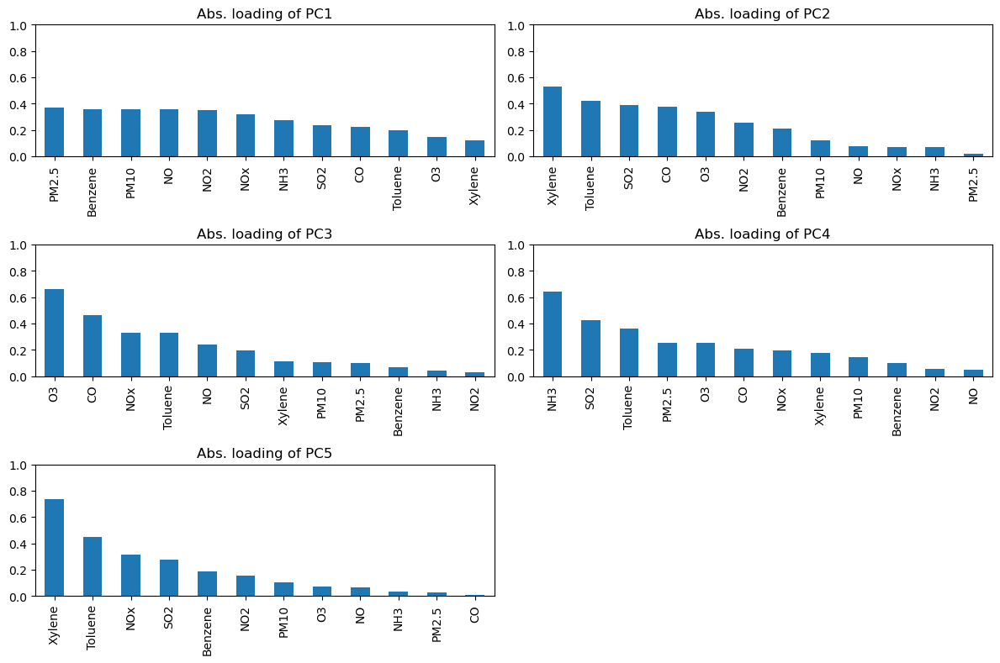

In [85]:
#Check as to how the original features matter to each PC
#Note: Here we are only considering the absolute values
plt.figure(figsize=(12,8))
for i in range (len(df_selected.columns)):
    plt.subplot(3,2,i+1)
    abs(df_selected[df_selected.columns[i]]).T.sort_values(ascending = False).plot.bar()
    plt.yticks(np.arange(0,1.2,.2))
    plt.title('Abs. loading of {}'. format(df_selected.columns[i]))
    plt.tight_layout()                                                             

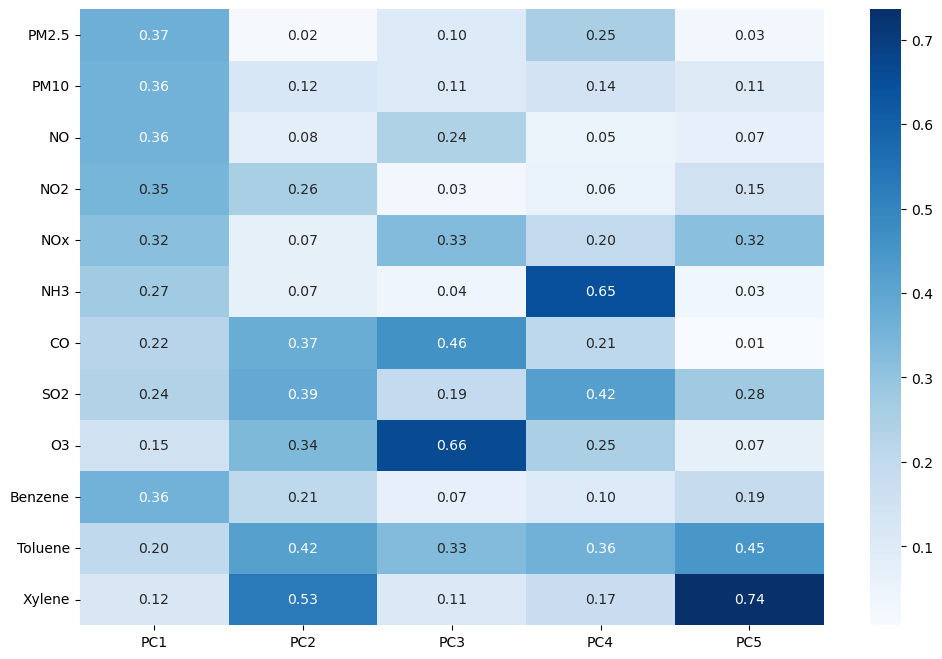

In [86]:
#Compare how the original features influence various PCs
plt.figure(figsize=(12,8))
sns.heatmap(abs(df_selected), annot=True, cmap='Blues', fmt='.2f');

In [87]:
#In order to calculate PC scores we need loadings, below:
df_selected

,PC1,PC2,PC3,PC4,PC5
PM2.5,0.367580,0.017881,-0.102442,0.251761,-0.029514
PM10,0.358749,0.121808,-0.108297,0.141722,-0.105872
NO,0.358690,0.079206,-0.238777,-0.049981,-0.066645
NO2,0.348564,0.255024,-0.026801,-0.058010,-0.152321
NOx,0.316615,-0.071851,0.329494,-0.196147,0.315614
NH3,0.272649,0.069764,-0.042596,0.645578,0.034921
CO,0.224074,-0.374636,0.461263,0.210254,0.006523
SO2,0.235444,0.387788,-0.193429,-0.422144,-0.278407
O3,0.149003,0.336539,0.659386,-0.250044,0.070888
Benzene,0.359671,-0.207187,-0.068059,-0.102218,0.188172


In [88]:
#...and we need the original scaled features
df_pca_scaled.iloc[0]

PM2.5     -0.823814
PM10      -0.881449
NO        -1.103682
NO2       -1.364231
NOx       -1.171197
NH3       -0.876637
CO        -0.569198
SO2       -0.666182
O3        -0.949903
Benzene   -0.650850
Toluene    0.571394
Xylene    -0.164550
Name: 0, dtype: float64

In [90]:
#We need to perform a dot product between the loadings and features to obtain the scores
for i in df_selected.columns:
    pc_score = np.dot(df_selected[i], df_pca_scaled.iloc[0])
    print(round(pc_score,6), end ='.')  

-2.665334.-0.91618.-0.790212.-0.245518.0.367239.

In [91]:
#Above step involves a lot of hard work. Let's do it the easier way
#Extract the required(as per the cumulative explained variance) number of PCs
pca = PCA(n_components=5,random_state=123)
pca_final = pca.fit_transform(df_pca_scaled)

In [92]:
#Just create a dataframe out of fit_transformed scaled data above
#Note: Notice the output of cell 34 and the first row of the dataframe below
pca_final_df = pd.DataFrame(pca_final, columns=df_selected.columns)
pca_final_df.head()

,PC1,PC2,PC3,PC4,PC5
0,-2.665334,-0.916180,-0.790212,-0.245518,0.367239
1,-3.156439,-0.411456,-0.384953,-0.150697,0.398613
2,-2.354841,-1.347799,-0.881378,-0.483265,-0.338393
3,-1.829266,-1.964523,-1.144289,-0.255720,-1.167517
4,-2.781773,-0.676409,-1.105102,0.156680,0.541447


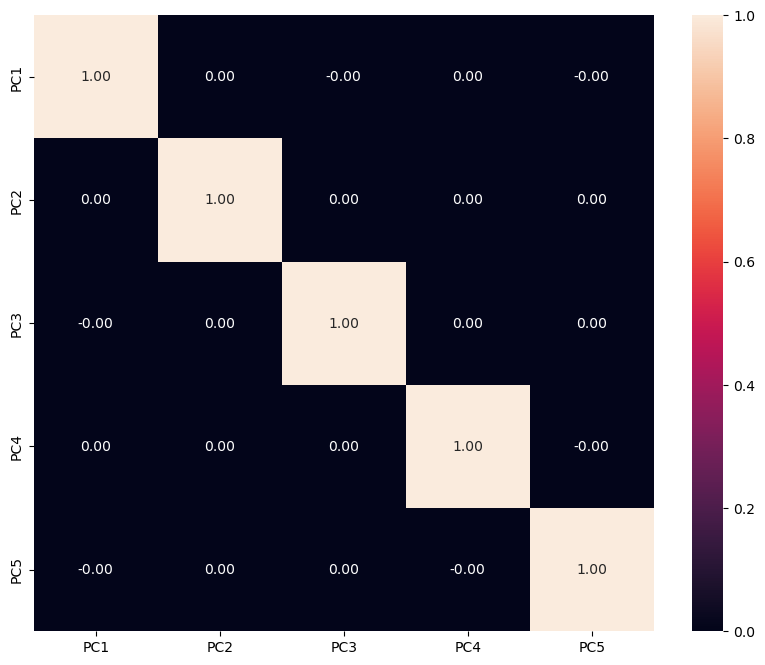

In [93]:
#Check for presence of correlations among the PCs
plt.figure(figsize = (10,8))
sns.heatmap(pca_final_df.corr(), annot=True,fmt='.2f');

In [104]:
df = pd.read_excel('Short+Term+Home+Loans.xlsx')

In [105]:
df.head()

,loan_account,age,gender,marital_status,qualification,gross_income,nettakehome,balance_tenure,city,completed_tenure,...,num_emi_changes,num_low_freq_transactions,num_of_emi_transactions,orignal_interest_rate,orignal_tenor,outstanding_principal,paid_interest,paid_principal,pre_emi_dueamt,pre_emi_received_amt
0,LA492,39,F,M,UG,63542.344735,63542.344735,111,MADURAI,70,...,11,10,73,17.479728,180,9.882910e+05,9.340537e+05,212745.625226,39959.331336,39959.331336
1,LA498,51,M,M,GRAD,81130.025032,81130.025032,107,MADURAI,68,...,3,11,73,17.479728,180,1.206218e+06,1.069305e+06,295078.188194,78774.632736,78774.632736
2,LA500,41,M,M,UG,56298.592500,56298.592500,50,MADURAI,70,...,13,10,73,17.479728,120,7.137100e+05,8.303592e+05,487326.621863,37918.629288,37918.629288
3,LA531,42,M,M,UG,74314.142100,74314.142100,110,MADURAI,70,...,13,17,72,17.479728,180,1.744746e+06,1.567354e+06,357068.193072,29375.950152,29375.950152
4,LA552,27,M,S,GRAD,64255.460240,64255.460240,112,MADURAI,69,...,14,10,71,17.479728,180,1.502039e+06,1.355995e+06,299516.018579,46048.309200,46048.309200


In [106]:
df.describe()

,age,gross_income,nettakehome,balance_tenure,completed_tenure,current_interest_rate,current_interest_rate_max,current_interest_rate_min,current_tenor,diff_current_interest_rate_max_min,...,num_emi_changes,num_low_freq_transactions,num_of_emi_transactions,orignal_interest_rate,orignal_tenor,outstanding_principal,paid_interest,paid_principal,pre_emi_dueamt,pre_emi_received_amt
count,2319.000000,2.319000e+03,2.319000e+03,2319.000000,2319.000000,2319.000000,2319.000000,2319.000000,2319.000000,2319.000000,...,2319.000000,2319.000000,2319.000000,2319.000000,2319.000000,2.319000e+03,2.319000e+03,2.319000e+03,2.319000e+03,2.319000e+03
mean,39.451056,8.260822e+04,8.134619e+04,146.662786,29.503665,15.698703,15.783840,15.684731,175.971108,0.104288,...,5.356188,4.567486,32.156102,15.768140,180.867615,1.949442e+06,6.538977e+05,2.389494e+05,5.630330e+04,5.562086e+04
std,8.982396,1.264007e+05,1.268459e+05,45.138729,13.490253,1.872893,1.832462,1.875045,42.242628,0.563156,...,3.809970,3.610644,13.251947,1.814290,35.859160,1.289269e+06,5.553356e+05,4.546814e+05,1.176218e+05,1.155979e+05
min,18.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,11.074656,11.074656,11.074656,10.000000,0.000000,...,0.000000,0.000000,0.000000,11.074656,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,32.000000,4.189591e+04,4.109947e+04,129.000000,22.000000,14.046210,14.358348,14.046210,173.000000,0.000000,...,3.000000,2.000000,24.000000,14.358348,180.000000,1.065798e+06,3.083669e+05,6.463679e+04,5.852663e+03,5.848246e+03
50%,39.000000,6.184963e+04,6.050222e+04,150.000000,28.000000,15.919038,15.919038,15.919038,180.000000,0.000000,...,4.000000,3.000000,31.000000,15.919038,180.000000,1.606862e+06,5.082382e+05,1.159271e+05,1.687113e+04,1.687113e+04
75%,46.000000,9.118946e+04,9.046402e+04,167.000000,37.000000,17.479728,17.479728,17.479728,181.000000,0.000000,...,7.000000,6.000000,40.000000,17.479728,180.000000,2.546081e+06,8.067100e+05,2.208857e+05,5.423541e+04,5.423541e+04
max,65.000000,4.261664e+06,4.261664e+06,307.000000,70.000000,19.976832,19.976832,19.976832,316.000000,12.011070,...,27.000000,21.000000,73.000000,19.976832,240.000000,1.080242e+07,5.588191e+06,7.458322e+06,1.624202e+06,1.585701e+06


In [98]:
hl.isnull().sum()

loan_account                           0
age                                    0
gender                                 0
marital_status                         0
qualification                          0
gross_income                           0
nettakehome                            0
balance_tenure                         0
city                                   0
completed_tenure                       0
current_interest_rate                  0
current_interest_rate_max              0
current_interest_rate_min              0
current_tenor                          0
diff_current_interest_rate_max_min     0
diff_emi_amount_max_min                0
diff_original_current_interest_rate    0
diff_original_current_tenor            0
emi_amount                             0
emi_dueamt                             0
emi_received_amt                       0
excess_adjusted_amt                    0
excess_available                       0
foir                                   0
last_receipt_amo

In [107]:
df.duplicated().sum()

0

## Problem Statement

Lending is one of the critical functions of any bank or financial institution. Customers are provided loans across different products (home loan, loan against property etc.) at competitive interest rates for an acceptable tenure. There is always a risk that a customer may default on the loan or may try and repay the loan in advance which leads to financial losses to the business.

There may not be enough data or evidence available from the past which will help the firm to predict the loan default or prepayment and mitigate the above possible risk. However, it does have information about the customer demographics, loan details, EMI transactions etc. which contributes to more than 25-30 features (high-dimension data) related to a customer’s loan account. But due to high dimensions it is difficult to identify any patterns within the data. Unsupervised learning techniques like Principal Component Analysis comes to rescue here to reduce the high dimensionality and help in further analysis and pattern recognition

In [108]:
df.city.value_counts()

MUMBAI             586
HYDERABAD          268
AHMEDABAD          165
CHENNAI            164
MADURAI            157
COIMBATORE         156
SURAT              136
ERODE               85
TIRUCHIRAPPALLI     78
PUNE                78
KARUR               65
TUTICORIN           64
TIRUPUR             63
WARANGAL            56
NAMAKKAL            56
BANGALORE           45
VISHAKHAPATNAM      45
Hyd                 31
Mum                 21
Name: city, dtype: int64

Observations:
Data consists of 2319 customer loan transactions with 42 features

Fields ‘diff_current_interest_rate_max_min’, ‘diff_original_current_interest_rate’, ‘diff_original_current_tenor’ have atleast 75% of the values as 0

Field 'excess_adjusted_amt' has atleast 50% of values as 0

'gross_income' & 'nettakehome' have minimum values as 0. Needs to be cleaned

There are no missing values in the data

We have 5 categorical fields 'gender', 'marital status', 'city' and 'qualification'. 'city' field needs cleanup.

Very few observations available for customers with ENG, MAT, DOCTRATE qualification

# Data Cleanup

In [109]:
df.city.replace(to_replace='Mum',value='MUMBAI',inplace=True)
df.city.replace(to_replace='Hyd',value='HYDERABAD',inplace=True)
df.city.value_counts()

MUMBAI             607
HYDERABAD          299
AHMEDABAD          165
CHENNAI            164
MADURAI            157
COIMBATORE         156
SURAT              136
ERODE               85
TIRUCHIRAPPALLI     78
PUNE                78
KARUR               65
TUTICORIN           64
TIRUPUR             63
NAMAKKAL            56
WARANGAL            56
BANGALORE           45
VISHAKHAPATNAM      45
Name: city, dtype: int64

In [110]:
print('% of records with 0 value in diff_current_interest_rate_max_min field: {:.2%}'.format((df[df.diff_current_interest_rate_max_min == 0].shape[0])/df.shape[0]))
print('# of records with 0 value in diff_original_current_interest_rate field: {:.2%}'.format((df[df.diff_original_current_interest_rate == 0].shape[0])/df.shape[0]))
print('# of records with 0 value in diff_original_current_tenor field: {:.2%}'.format((df[df.diff_original_current_tenor == 0].shape[0])/df.shape[0]))
print('# of records with 0 value in excess_adjusted_amt field: {:.2%}'.format((df[df.excess_adjusted_amt == 0].shape[0])/df.shape[0]))

% of records with 0 value in diff_current_interest_rate_max_min field: 95.30%
# of records with 0 value in diff_original_current_interest_rate field: 96.03%
# of records with 0 value in diff_original_current_tenor field: 72.49%
# of records with 0 value in excess_adjusted_amt field: 67.96%


In [111]:
df.drop(['diff_current_interest_rate_max_min','diff_original_current_interest_rate','diff_original_current_tenor','excess_adjusted_amt'], axis=1, inplace=True)

In [112]:
df[df.gross_income==0]

,loan_account,age,gender,marital_status,qualification,gross_income,nettakehome,balance_tenure,city,completed_tenure,...,num_emi_changes,num_low_freq_transactions,num_of_emi_transactions,orignal_interest_rate,orignal_tenor,outstanding_principal,paid_interest,paid_principal,pre_emi_dueamt,pre_emi_received_amt
106,LA928,29,F,M,GRAD,0.0,0.0,159,COIMBATORE,21,...,1,1,21,17.479728,180,8.944886e+05,228711.906059,36314.844106,6923.810520,6923.810520
616,LA2297,54,F,M,UG,0.0,0.0,87,NAMAKKAL,45,...,3,4,46,17.479728,132,1.217339e+06,730542.546646,283956.588908,12884.692368,12884.692368
640,LA2348,46,M,M,OTHERS,0.0,0.0,138,MUMBAI,42,...,5,4,43,17.479728,180,6.839979e+05,361987.939409,66650.027041,12884.692368,12884.692368
1198,LA3410,35,M,M,GRAD,0.0,0.0,153,MUMBAI,28,...,4,4,35,14.670486,180,2.328519e+06,783168.969620,163632.234425,177258.383520,177258.383520
2315,LA5726,34,M,M,UG,0.0,0.0,240,MUMBAI,0,...,7,8,18,14.358348,240,1.280237e+06,130587.212571,0.000000,316114.464864,192106.478616


In [113]:
df[df.nettakehome==0]

,loan_account,age,gender,marital_status,qualification,gross_income,nettakehome,balance_tenure,city,completed_tenure,...,num_emi_changes,num_low_freq_transactions,num_of_emi_transactions,orignal_interest_rate,orignal_tenor,outstanding_principal,paid_interest,paid_principal,pre_emi_dueamt,pre_emi_received_amt
8,LA570,44,M,M,GRAD,90077.748000,0.0,0,CHENNAI,49,...,2,6,50,17.479728,180,0.000000e+00,1.213050e+06,3.753240e+06,10737.979824,10737.979824
106,LA928,29,F,M,GRAD,0.000000,0.0,159,COIMBATORE,21,...,1,1,21,17.479728,180,8.944886e+05,2.287119e+05,3.631484e+04,6923.810520,6923.810520
307,LA1496,25,F,S,GRAD,75759.889955,0.0,186,CHENNAI,54,...,2,1,55,17.479728,240,3.396424e+06,2.233865e+06,2.066864e+05,30919.728000,30919.728000
395,LA1783,44,M,M,OTHERS,15012.958000,0.0,138,HYDERABAD,42,...,9,6,50,17.479728,180,2.081138e+06,1.138929e+06,1.708054e+05,282875.757264,282875.757264
521,LA2100,34,M,S,UG,40228.722257,0.0,85,TUTICORIN,40,...,15,11,46,17.479728,156,8.974986e+05,5.893742e+05,3.035380e+05,106719.441192,106719.441192
545,LA2147,47,M,M,OTHERS,105090.706000,0.0,120,CHENNAI,45,...,3,2,46,17.479728,180,2.635998e+06,1.503699e+06,4.416587e+05,26412.073368,26412.073368
616,LA2297,54,F,M,UG,0.000000,0.0,87,NAMAKKAL,45,...,3,4,46,17.479728,132,1.217339e+06,7.305425e+05,2.839566e+05,12884.692368,12884.692368
640,LA2348,46,M,M,OTHERS,0.000000,0.0,138,MUMBAI,42,...,5,4,43,17.479728,180,6.839979e+05,3.619879e+05,6.665003e+04,12884.692368,12884.692368
662,LA2392,60,M,M,GRAD,89787.997911,0.0,53,MADURAI,44,...,4,2,45,14.982624,96,1.195590e+06,6.926213e+05,6.254819e+05,23227.341384,23227.341384
664,LA2395,48,F,M,UG,30660.964123,0.0,196,HYDERABAD,44,...,18,10,45,14.358348,240,1.084249e+06,4.744590e+05,6.574324e+04,14053.016376,14053.016376


In [114]:
df.gross_income.replace(to_replace=0, value=df.gross_income.median(),inplace=True)
df.nettakehome.replace(to_replace=0, value=df.nettakehome.median(),inplace=True)

EDA

Univariate Analysis¶

Let us define a function 'univariateAnalysis_numeric' to display information as part of univariate analysis of numeric variables. The function will accept coulmn name and number of bins as arguments.

The function will display the statistical description of the the numeric variable, histogram or distplot to view the distribution and the box plot to view 5 point summary and outliers if any.

In [115]:
## CaCulation of Covariance
A = np.array([1692,1978,1884,2151,2519])
B = np.array([68,102,110,112,154])
covariance_matrix  = np.cov(A,B)
covariance = covariance_matrix[0,1]
covariance

9107.3

In [2]:
df = pd.read_csv('nutrientcomposition_new.csv')
df.head()

,S.No,Protein,Fat,vitaminC,Fibre,Product
0,1,0.452369,1.170926,1.079271,1.702960,"Amaranth leaves, cooked, boiled, drained, with..."
1,2,2.321087,0.706856,0.350088,0.658249,Bacon and beef sticks
2,3,0.884554,1.186571,2.428544,1.984562,"Apples, frozen, unsweetened, unheated (Include..."
3,4,0.715501,0.577599,0.270925,0.369266,"Alcoholic beverage, beer, light, BUD LIGHT"
4,5,0.132610,0.544521,0.116884,0.557309,"Alcoholic beverage, daiquiri, canned"


In [4]:
# Since the mean , median , Min and max value of the data is almost same , we do not need to scale the data. 
#Else in order to perform cluster analyses scaling od fata is ncessary
df.iloc[:,1:6].describe()

,Protein,Fat,vitaminC,Fibre
count,1746.000000,1746.000000,1746.000000,1746.000000
mean,0.922470,0.900091,0.900146,0.900830
std,0.627128,0.634617,0.623847,0.626875
min,0.000128,0.000267,0.000029,0.002579
25%,0.435853,0.394784,0.419103,0.389124
50%,0.813025,0.804687,0.796290,0.820783
75%,1.295106,1.298988,1.280870,1.295732
max,4.016890,3.979364,4.013322,3.570331


In [8]:
data = df.iloc[:,1:5]

In [9]:
data.head()

,Protein,Fat,vitaminC,Fibre
0,0.452369,1.170926,1.079271,1.702960
1,2.321087,0.706856,0.350088,0.658249
2,0.884554,1.186571,2.428544,1.984562
3,0.715501,0.577599,0.270925,0.369266
4,0.132610,0.544521,0.116884,0.557309


In [10]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [11]:
# to calculate the distance between the clusters or data using Ward method within Linkage
wardlink = linkage(data, method='ward')

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [25.0, 25.0, 35.0, 35.0],
  [45.0, 45.0, 55.0, 55.0],
  [30.0, 30.0, 50.0, 50.0],
  [10.0, 10.0, 40.0, 40.0],
  [75.0, 75.0, 85.0, 85.0],
  [65.0, 65.0, 80.0, 80.0],
  [105.0, 105.0, 115.0, 115.0],
  [95.0, 95.0, 110.0, 110.0],
  [135.0, 135.0, 145.0, 145.0],
  [125.0, 125.0, 140.0, 140.0],
  [102.5, 102.5, 132.5, 132.5],
  [72.5, 72.5, 117.5, 117.5],
  [25.0, 25.0, 95.0, 95.0],
  [175.0, 175.0, 185.0, 185.0],
  [165.0, 165.0, 180.0, 180.0],
  [155.0, 155.0, 172.5, 172.5],
  [195.0, 195.0, 205.0, 205.0],
  [225.0, 225.0, 235.0, 235.0],
  [215.0, 215.0, 230.0, 230.0],
  [200.0, 200.0, 222.5, 222.5],
  [163.75, 163.75, 211.25, 211.25],
  [245.0, 245.0, 255.0, 255.0],
  [275.0, 275.0, 285.0, 285.0],
  [265.0, 265.0, 280.0, 280.0],
  [250.0, 250.0, 272.5, 272.5],
  [295.0, 295.0, 305.0, 305.0],
  [325.0, 325.0, 335.0, 335.0],
  [315.0, 315.0, 330.0, 330.0],
  [300.0, 300.0, 322.5, 322.5],
  [261.25, 261.25, 311.25, 311.25],
  [187.5, 187.5, 286.25, 286

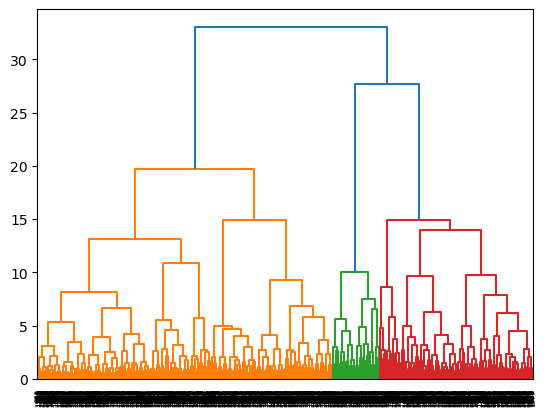

In [12]:
# to create the dendogram 
dendrogram(wardlink)

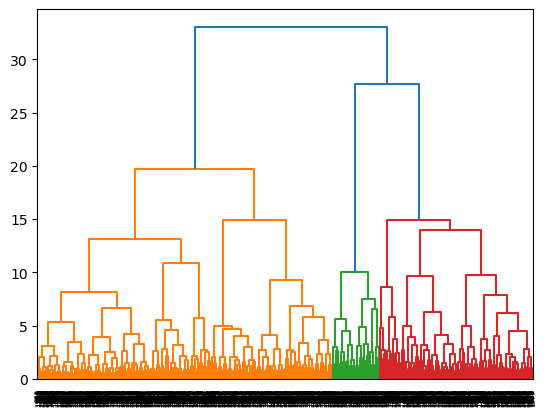

In [13]:
dend = dendrogram(wardlink)

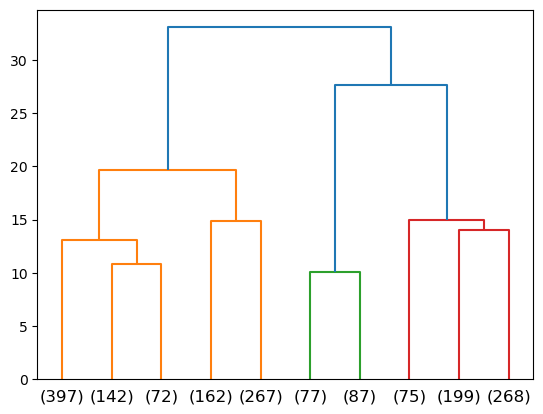

In [14]:
# in order to see a clean dendogram where only last 10 merges is shown)
dend = dendrogram(wardlink,
                 truncate_mode='lastp',
                 p = 10,
                 )

In [15]:
from scipy.cluster.hierarchy import fcluster

In [16]:
# Method 1
clusters = fcluster(wardlink, 3, criterion='maxclust')
clusters

array([1, 1, 2, ..., 1, 1, 3], dtype=int32)

In [19]:
# Method 1
clusters = fcluster(wardlink, 22, criterion='distance')
clusters

array([1, 1, 2, ..., 1, 1, 3], dtype=int32)

In [68]:
# Method 1
clusters = fcluster(wardlink, 7, criterion='distance')
clusters

array([ 7,  4, 10, ...,  2,  7, 12], dtype=int32)

In [20]:
df['clusters'] = clusters

In [21]:
df.head()

,S.No,Protein,Fat,vitaminC,Fibre,Product,clusters
0,1,0.452369,1.170926,1.079271,1.702960,"Amaranth leaves, cooked, boiled, drained, with...",1
1,2,2.321087,0.706856,0.350088,0.658249,Bacon and beef sticks,1
2,3,0.884554,1.186571,2.428544,1.984562,"Apples, frozen, unsweetened, unheated (Include...",2
3,4,0.715501,0.577599,0.270925,0.369266,"Alcoholic beverage, beer, light, BUD LIGHT",1
4,5,0.132610,0.544521,0.116884,0.557309,"Alcoholic beverage, daiquiri, canned",1


In [26]:
data_df = pd.read_csv('Cust_Spend_Data_New.csv')

In [27]:
data_df.head()

,Cust_ID,Name,Avg_Mthly_Spend,No_Of_Visits,Apparel_Items,FnV_Items,Staples_Items
0,1,Abraham,1123,28,1,16,14
1,2,Adela,9818,13,5,2,5
2,3,Adelina,9824,10,10,2,2
3,4,Adrian,3097,23,2,8,9
4,5,Adrianna,817,28,1,17,17


In [28]:
data_df.shape

(829, 7)

In [30]:
data_df.dtypes

Cust_ID             int64
Name               object
Avg_Mthly_Spend     int64
No_Of_Visits        int64
Apparel_Items       int64
FnV_Items           int64
Staples_Items       int64
dtype: object

In [31]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829 entries, 0 to 828
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Cust_ID          829 non-null    int64 
 1   Name             829 non-null    object
 2   Avg_Mthly_Spend  829 non-null    int64 
 3   No_Of_Visits     829 non-null    int64 
 4   Apparel_Items    829 non-null    int64 
 5   FnV_Items        829 non-null    int64 
 6   Staples_Items    829 non-null    int64 
dtypes: int64(6), object(1)
memory usage: 45.5+ KB


In [32]:
data_df.duplicated().sum()

0

In [34]:
cust_df = data_df.drop(['Cust_ID', 'Name'], axis=1)

In [35]:
cust_df.head()

,Avg_Mthly_Spend,No_Of_Visits,Apparel_Items,FnV_Items,Staples_Items
0,1123,28,1,16,14
1,9818,13,5,2,5
2,9824,10,10,2,2
3,3097,23,2,8,9
4,817,28,1,17,17


In [38]:
X = StandardScaler()

In [39]:
scaled_df = X.fit_transform(cust_df)

In [40]:
scaled_df

array([[-1.7896947 ,  2.32407237, -1.44109551,  2.28639713,  1.33272373],
       [ 2.44092704, -1.1127025 ,  0.50541069, -1.53502065, -0.78605994],
       [ 2.44384639, -1.80005748,  2.93854344, -1.53502065, -1.49232116],
       ...,
       [-0.14707492, -0.65446585,  0.01878414,  0.10272982,  0.15562169],
       [-0.35629486,  0.49112577,  0.01878414, -0.17022859,  0.3910421 ],
       [-0.03468002,  0.03288912,  0.50541069,  0.10272982,  0.15562169]])

In [41]:
# to run Kmeans method of clustering with an assumed number of cluster as 2 since we have not run the WSS method yet to deterins the optimal number of clusters
k_means = KMeans(n_clusters=2)

In [42]:
# to input sclaed data into kmeans
k_means.fit(scaled_df)

KMeans(n_clusters=2)

In [43]:
# to extract the kmeans data in labled format
k_means.labels_

array([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,

In [44]:
# to get the total within sum of square when k = 2
k_means.inertia_

2225.818078099467

In [45]:
k_means= KMeans(n_clusters=3)
k_means.fit(scaled_df)
k_means.inertia_

1074.3823802989516

In [46]:
k_means= KMeans(n_clusters=4)
k_means.fit(scaled_df)
k_means.inertia_

909.4495242917951

In [47]:
k_means= KMeans(n_clusters=5)
k_means.fit(scaled_df)
k_means.inertia_

784.5887748781103

In [48]:
k_means= KMeans(n_clusters=6)
k_means.fit(scaled_df)
k_means.inertia_

715.3208051403277

In [49]:
wss=[]

In [50]:
for i in range(1,11):
    KM = KMeans(n_clusters=i)
    KM.fit(scaled_df)
    wss.append(KM.inertia_)

C:\Users\Nishu\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


In [51]:
wss

[4145.0,
 2225.818078099467,
 1074.3823802989516,
 909.4495242917951,
 784.5624359391796,
 697.7964308882446,
 630.0985175084348,
 580.9502503458145,
 539.939113126548,
 509.2185791054863]

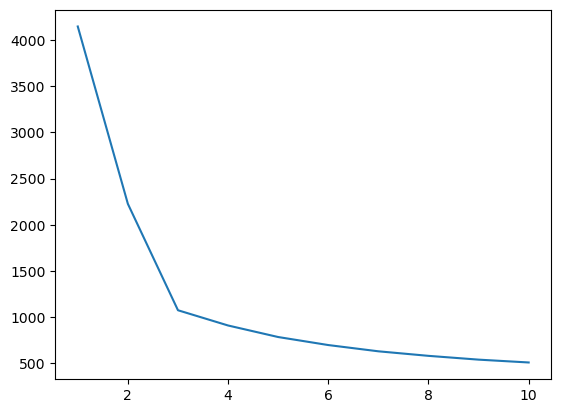

In [52]:
plt.plot(range(1,11),wss)

In [54]:
k_means = KMeans(n_clusters=3)
k_means.fit(scaled_df)
labels = k_means.labels_

In [55]:
data_df['Clus_kmeans'] = labels

In [56]:
data_df.head()

,Cust_ID,Name,Avg_Mthly_Spend,No_Of_Visits,Apparel_Items,FnV_Items,Staples_Items,Clus_kmeans
0,1,Abraham,1123,28,1,16,14,2
1,2,Adela,9818,13,5,2,5,1
2,3,Adelina,9824,10,10,2,2,1
3,4,Adrian,3097,23,2,8,9,0
4,5,Adrianna,817,28,1,17,17,2


In [57]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [58]:
# check the silhouette score for the orignal dat and labels (cluster) we calculated earlier
silhouette_score(scaled_df, labels)

0.5863370901372584

In [61]:
sil_width = silhouette_samples(scaled_df, labels)

In [62]:
data_df['sil_width'] = sil_width

In [63]:
data_df.head()

,Cust_ID,Name,Avg_Mthly_Spend,No_Of_Visits,Apparel_Items,FnV_Items,Staples_Items,Clus_kmeans,sil_width
0,1,Abraham,1123,28,1,16,14,2,0.656055
1,2,Adela,9818,13,5,2,5,1,0.512424
2,3,Adelina,9824,10,10,2,2,1,0.582380
3,4,Adrian,3097,23,2,8,9,0,0.375197
4,5,Adrianna,817,28,1,17,17,2,0.703167


In [64]:
# to check if any the observation has incorret grouping cluster by checking if silhouette_samples is less then 0
silhouette_samples(scaled_df, labels).min()

0.04131038567750352

In [1]:
df = pd.read_csv('ThreeCars.csv')

<IPython.core.display.Javascript object>

In [2]:
df.head()

,Price,Age,Mileage,Porsche,Jaguar,BMW
0,69.4,3,21.5,1,0,0
1,56.9,3,43.0,1,0,0
2,49.9,2,19.9,1,0,0
3,47.4,4,36.0,1,0,0
4,42.9,4,44.0,1,0,0


In [3]:
y = df['Price']

In [5]:
x = df[['Age','Mileage', 'Porsche','Jaguar','BMW']]

In [6]:
import statsmodels.api as sm
import pandas as pd

In [9]:
X = sm.add_constant(x)

In [10]:
model = sm.OLS(y, X).fit()

In [11]:
r_squared = model.rsquared

In [12]:
print("R-squared:", r_squared)

R-squared: 0.7805691333032706


In [13]:
input_params = x